<a href="https://colab.research.google.com/github/dolmani38/Summary2/blob/main/en_multi-discriminator%20GAN%200924.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# English Multi-Discriminator GAN


ABSTRACT

----


#4. Implementation


## 4.1 기본 설정...

In [2]:
if True:
    from google.colab import drive
    drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.activity.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fexperimentsandconfigs%20https%3a%2f%2fwww.googleapis.com%2fauth%2fphotos.native&response_type=code

Enter your authorization code:
4/1AX4XfWjASg7lxKBowmXBsr6bQopijg9NinqIGsHy6u4w1scgcFj0X8mH-kE
Mounted at /content/drive


In [3]:
#!pip install keybert
!pip3 install transformers
!pip3 install sentence-transformers

#!pip install sentence-transformers

     |████████████████████████████████| 2.8 MB 7.2 MB/s 
     |████████████████████████████████| 3.3 MB 56.4 MB/s 
     |████████████████████████████████| 895 kB 60.5 MB/s 
     |████████████████████████████████| 52 kB 1.9 MB/s 
     |████████████████████████████████| 636 kB 68.9 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
     |████████████████████████████████| 85 kB 3.3 MB/s 
     |████████████████████████████████| 1.2 MB 40.1 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.0.0-py3-none-any.whl size=126710 sha256=f71b8ae3e4f9185d845f845391b796b14cf815073cdbe8eb634f5785f06f6ca1
  Stored in directory: /root/.cache/pip/wheels/d1/c1/0f/faafd427f705c4b012274ba60d9a91d75830306811e1355293
Successfully built sentence-transformers


In [4]:
import matplotlib.pyplot as plt
# set seeds for reproducability
from numpy.random import seed
#seed(1)

import pandas as pd
import numpy as np
import string, os 

import urllib.request
import nltk
nltk.download('punkt')

import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [5]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

logout = True

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [6]:
# Print iterations progress
class ProgressBar:

    def __init__(self,total=20, prefix = '', suffix = '', decimals = 1, length = 20, fill = '|', printEnd = "\r"):
        self.total = total
        self.prefix = prefix
        self.suffix = suffix
        self.decimals = decimals
        self.length = length
        self.fill = fill
        self.printEnd = printEnd
        self.ite = 0
        self.back_filledLength = 0

    def printProgress(self,iteration, text):
        self.ite += iteration
        percent = ("{0:." + str(self.decimals) + "f}").format(100 * (self.ite / float(self.total)))
        filledLength = int(self.length * self.ite // self.total)
        bar = self.fill * filledLength + '.' * (self.length - filledLength)
        if filledLength > self.back_filledLength or percent == 100:
            if logout:
                print(f'\r{self.prefix} |{bar}| {percent}% {self.suffix}  {text}', end="", flush=True)
            # Print New Line on Complete
            if self.ite == self.total: 
                if logout:
                    print()
        self.back_filledLength = filledLength    

In [7]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms

##4.2 Grammar Discriminator Class

In [8]:
from transformers import BertTokenizer, BertTokenizerFast,AutoTokenizer, BertForSequenceClassification, AdamW, BertConfig, get_linear_schedule_with_warmup
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler, TensorDataset, random_split

import time
import random
import datetime
import pickle

# 간단한 전처리
def clean_text(txt):
    txt = txt.replace('\n',' ')
    txt = txt.replace('\r',' ')    
    txt = txt.replace('=','')
    txt = txt.replace('\"','')   
    txt = txt.replace('\'','')
    #txt = txt.replace(',','')
    txt = txt.replace('..','')
    txt = txt.replace('...','')
    txt = txt.replace(' .','.')
    txt = txt.replace('.','. ')
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')           
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')             
    return txt.strip()

def shuffling(txt):
    txt_list = txt.split(' ')
    random.shuffle(txt_list)
    return ' '.join(txt_list)

def collect_training_dataset_for_grammar_discriminator(sentences_dataset):

    sentences = []
    labels = []

    for txtss in sentences_dataset:
        txtss = clean_text(txtss)
        txts = txtss.strip().split('.')
        for txt in txts:  
            txt = txt.strip()
            if len(txt) > 10:
                #ko_grammar_dataset.append([txt,1])
                txt = txt.replace('.','')
                tf = random.choice([True,False])
                # 정상 또는 비정상 둘중에 하나만 데이터셋에 추가
                if (tf):
                    sentences.append(txt) # '.'의 위치를 보고 True, False를 판단 하기 땜에...
                    labels.append(1)
                else:
                    sentences.append(shuffling(txt))
                    labels.append(0)

    return sentences,labels

# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    
    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))

class Grammar_Discriminator:


    def __init__(self, pretraoned_kobert_model_name='bert-base-v2', input_dir=None):

        if input_dir is None:
            self.tokenizer = BertTokenizerFast.from_pretrained(pretraoned_kobert_model_name)
            self.discriminator = BertForSequenceClassification.from_pretrained(
                                    pretraoned_kobert_model_name, # Use the 12-layer BERT model, with an uncased vocab.
                                    num_labels = 2, # The number of output labels--2 for binary classification.
                                                    # You can increase this for multi-class tasks.   
                                    output_attentions = False, # Whether the model returns attentions weights.
                                    output_hidden_states = False, # Whether the model returns all hidden-states.
                                )            
        else:
            self.__load_model(input_dir)




    def set_dataset(self, sentences,labels):
        # Print the original sentence.
        print(' Original: ', sentences[0])

        # Tokenize all of the sentences and map the tokens to thier word IDs.
        input_ids = []
        attention_masks = []

        # For every sentence...
        for i, sent in enumerate(sentences):
            print(f'\r Tokenize {i+1}/{len(sentences)}', end="", flush=True)            
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])
            
            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])

        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0)
        attention_masks = torch.cat(attention_masks, dim=0)
        labels = torch.tensor(labels)

        # Print sentence 0, now as a list of IDs.
        print('Original: ', sentences[0])
        print('Token IDs:', input_ids[0])

        # Training & Validation Split
        # Divide up our training set to use 90% for training and 10% for validation.

        # Combine the training inputs into a TensorDataset.
        dataset = TensorDataset(input_ids, attention_masks, labels)

        # Create a 90-10 train-validation split.

        # Calculate the number of samples to include in each set.
        train_size = int(0.9 * len(dataset))
        val_size = len(dataset) - train_size

        # Divide the dataset by randomly selecting samples.
        train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

        print('{:>5,} training samples'.format(train_size))
        print('{:>5,} validation samples'.format(val_size))

        # The DataLoader needs to know our batch size for training, so we specify it 
        # here. For fine-tuning BERT on a specific task, the authors recommend a batch 
        # size of 16 or 32.
        self.batch_size = 32

        # Create the DataLoaders for our training and validation sets.
        # We'll take training samples in random order. 
        self.train_dataloader = DataLoader(
                    train_dataset,  # The training samples.
                    sampler = RandomSampler(train_dataset), # Select batches randomly
                    batch_size = self.batch_size # Trains with this batch size.
                )

        # For validation the order doesn't matter, so we'll just read them sequentially.
        self.validation_dataloader = DataLoader(
                    val_dataset, # The validation samples.
                    sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
                    batch_size = self.batch_size # Evaluate with this batch size.
                )        


    def train(self,epochs=4):
        # Tell pytorch to run this model on the GPU.
        self.discriminator.cuda()

        # Get all of the model's parameters as a list of tuples.
        params = list(self.discriminator.named_parameters())

        print('The BERT model has {:} different named parameters.\n'.format(len(params)))

        print('==== Embedding Layer ====\n')

        for p in params[0:5]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== First Transformer ====\n')

        for p in params[5:21]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== Output Layer ====\n')

        for p in params[-4:]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))  

        # Note: AdamW is a class from the huggingface library (as opposed to pytorch) 
        # I believe the 'W' stands for 'Weight Decay fix"
        self.optimizer = AdamW(self.discriminator.parameters(),
                        lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )

        # Number of training epochs. The BERT authors recommend between 2 and 4. 
        # We chose to run for 4, but we'll see later that this may be over-fitting the
        # training data.
        #epochs = 2

        # Total number of training steps is [number of batches] x [number of epochs]. 
        # (Note that this is not the same as the number of training samples).
        total_steps = len(self.train_dataloader) * epochs

        # Create the learning rate scheduler.
        scheduler = get_linear_schedule_with_warmup(self.optimizer, 
                                                    num_warmup_steps = 0, # Default value in run_glue.py
                                                    num_training_steps = total_steps)
            
        # This training code is based on the `run_glue.py` script here:
        # https://github.com/huggingface/transformers/blob/5bfcd0485ece086ebcbed2d008813037968a9e58/examples/run_glue.py#L128

        # Set the seed value all over the place to make this reproducible.
        seed_val = 42

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)

        # We'll store a number of quantities such as training and validation loss, 
        # validation accuracy, and timings.
        training_stats = []

        # Measure the total training time for the whole run.
        total_t0 = time.time()

        # For each epoch...
        for epoch_i in range(0, epochs):
            
            # ========================================
            #               Training
            # ========================================
            
            # Perform one full pass over the training set.

            print("")
            print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
            print('Training...')

            # Measure how long the training epoch takes.
            t0 = time.time()

            # Reset the total loss for this epoch.
            total_train_loss = 0

            # Put the model into training mode. Don't be mislead--the call to 
            # `train` just changes the *mode*, it doesn't *perform* the training.
            # `dropout` and `batchnorm` layers behave differently during training
            # vs. test (source: https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch)
            self.discriminator.train()

            # For each batch of training data...
            for step, batch in enumerate(self.train_dataloader):

                # Progress update every 40 batches.
                if step % 40 == 0 and not step == 0:
                    # Calculate elapsed time in minutes.
                    elapsed = format_time(time.time() - t0)
                    
                    # Report progress.
                    print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(self.train_dataloader), elapsed))

                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using the 
                # `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)

                # Always clear any previously calculated gradients before performing a
                # backward pass. PyTorch doesn't do this automatically because 
                # accumulating the gradients is "convenient while training RNNs". 
                # (source: https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch)
                self.discriminator.zero_grad()        

                # Perform a forward pass (evaluate the model on this training batch).
                # The documentation for this `model` function is here: 
                # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                # It returns different numbers of parameters depending on what arguments
                # arge given and what flags are set. For our useage here, it returns
                # the loss (because we provided labels) and the "logits"--the model
                # outputs prior to activation.
                outputs = self.discriminator(b_input_ids, 
                                    token_type_ids=None, 
                                    attention_mask=b_input_mask, 
                                    labels=b_labels)
                loss, logits = outputs.loss, outputs.logits
                # Accumulate the training loss over all of the batches so that we can
                # calculate the average loss at the end. `loss` is a Tensor containing a
                # single value; the `.item()` function just returns the Python value 
                # from the tensor.
                total_train_loss += loss.item()

                # Perform a backward pass to calculate the gradients.
                loss.backward()

                # Clip the norm of the gradients to 1.0.
                # This is to help prevent the "exploding gradients" problem.
                torch.nn.utils.clip_grad_norm_(self.discriminator.parameters(), 1.0)

                # Update parameters and take a step using the computed gradient.
                # The optimizer dictates the "update rule"--how the parameters are
                # modified based on their gradients, the learning rate, etc.
                self.optimizer.step()

                # Update the learning rate.
                scheduler.step()

            # Calculate the average loss over all of the batches.
            avg_train_loss = total_train_loss / len(self.train_dataloader)            
            
            # Measure how long this epoch took.
            training_time = format_time(time.time() - t0)

            print("")
            print("  Average training loss: {0:.2f}".format(avg_train_loss))
            print("  Training epcoh took: {:}".format(training_time))
                
            # ========================================
            #               Validation
            # ========================================
            # After the completion of each training epoch, measure our performance on
            # our validation set.

            print("")
            print("Running Validation...")

            t0 = time.time()

            # Put the model in evaluation mode--the dropout layers behave differently
            # during evaluation.
            self.discriminator.eval()

            # Tracking variables 
            total_eval_accuracy = 0
            total_eval_loss = 0
            nb_eval_steps = 0

            # Evaluate data for one epoch
            for batch in self.validation_dataloader:
                
                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using 
                # the `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)
                
                # Tell pytorch not to bother with constructing the compute graph during
                # the forward pass, since this is only needed for backprop (training).
                with torch.no_grad():        

                    # Forward pass, calculate logit predictions.
                    # token_type_ids is the same as the "segment ids", which 
                    # differentiates sentence 1 and 2 in 2-sentence tasks.
                    # The documentation for this `model` function is here: 
                    # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                    # Get the "logits" output by the model. The "logits" are the output
                    # values prior to applying an activation function like the softmax.
                    outputs = self.discriminator(b_input_ids, 
                                        token_type_ids=None, 
                                        attention_mask=b_input_mask,
                                        labels=b_labels)
                loss, logits = outputs.loss, outputs.logits
                # Accumulate the validation loss.
                total_eval_loss += loss.item()

                # Move logits and labels to CPU
                logits = logits.detach().cpu().numpy()
                label_ids = b_labels.to('cpu').numpy()

                # Calculate the accuracy for this batch of test sentences, and
                # accumulate it over all batches.
                total_eval_accuracy += flat_accuracy(logits, label_ids)
                

            # Report the final accuracy for this validation run.
            avg_val_accuracy = total_eval_accuracy / len(self.validation_dataloader)
            print("  Accuracy: {0:.2f}".format(avg_val_accuracy))

            # Calculate the average loss over all of the batches.
            avg_val_loss = total_eval_loss / len(self.validation_dataloader)
            
            # Measure how long the validation run took.
            validation_time = format_time(time.time() - t0)
            
            print("  Validation Loss: {0:.2f}".format(avg_val_loss))
            print("  Validation took: {:}".format(validation_time))

            # Record all statistics from this epoch.
            training_stats.append(
                {
                    'epoch': epoch_i + 1,
                    'Training Loss': avg_train_loss,
                    'Valid. Loss': avg_val_loss,
                    'Valid. Accur.': avg_val_accuracy,
                    'Training Time': training_time,
                    'Validation Time': validation_time
                }
            )

        print("")
        print("Training complete!")

        print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))
            

        return training_stats

    def save_model(self, output_dir = './model_save/'):
        # Create output directory if needed
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

        print("Saving model to %s" % output_dir)

        # Save a trained model, configuration and tokenizer using `save_pretrained()`.
        # They can then be reloaded using `from_pretrained()`
        model_to_save = self.discriminator.module if hasattr(self.discriminator, 'module') else self.discriminator  # Take care of distributed/parallel training
        model_to_save.save_pretrained(output_dir)
        self.tokenizer.save_pretrained(output_dir)

        # Good practice: save your training arguments together with the trained model
        # torch.save(args, os.path.join(output_dir, 'training_args.bin'))

    def __load_model(self, input_dir = './drive/MyDrive/Colab Notebooks/summary/en_grammar_check_model'):
        print('Loading BERT tokenizer...')
        self.tokenizer = BertTokenizerFast.from_pretrained(input_dir)
        self.discriminator = BertForSequenceClassification.from_pretrained(input_dir)

    def transfer_learning(self, sentences, train_for = True):
        
        input_ids = []
        attention_masks = []

        # For every sentence...
        for sent in sentences:
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])

            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])
        
        if train_for:
            b_labels = torch.ones(len(sentences),dtype=torch.long).to(device)
        else:
            b_labels = torch.zeros(len(sentences),dtype=torch.long).to(device)
        #print(b_labels)
        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0).to(device)
        attention_masks = torch.cat(attention_masks, dim=0).to(device)    
        #if str(discriminator1.device) == 'cpu':
        #    pass
        #else:
        #    input_ids = input_ids.to(device)
        #    attention_masks = attention_masks.to(device)        

        outputs = self.discriminator(input_ids, 
                            token_type_ids=None, 
                            attention_mask=attention_masks, 
                                labels=b_labels)

        #print(outputs)
        #return torch.sigmoid(outputs[0][:,1])
        #return outputs[0][:,1]
        return outputs['loss'], outputs['logits']


# 문법 discriminator 활용

In [9]:
g_discriminator = Grammar_Discriminator(input_dir = '/content/drive/MyDrive/Colab Notebooks/summary/en_grammar_model')

Loading BERT tokenizer...


In [10]:
txt = ['Her friends sadly never heard from her after they parted company.','Her friends sadly never from her after heard they parted company.']
g_discriminator.discriminator.to(device)
g_discriminator.transfer_learning(txt)

(tensor(2.1402, device='cuda:0', grad_fn=<NllLossBackward>),
 tensor([[-5.8312,  5.9503],
         [ 2.0386, -2.2279]], device='cuda:0', grad_fn=<AddmmBackward>))

##4.3 Static similarity discriminator class

In [11]:
from sentence_transformers import SentenceTransformer
from transformers import BertTokenizer
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from scipy.misc import electrocardiogram
import scipy


class Similarity_Discriminator:
    '''
    _instance = None
    _embedder = None
    def __new__(cls,pre_trained_model_name='stsb-roberta-large'):
        if cls._instance is None:
            print('Creating Similarity_Discriminator object')
            cls._instance = super(Similarity_Discriminator, cls).__new__(cls)
            # Put any initialization here.
            cls._embedder = SentenceTransformer(pre_trained_model_name)
        return cls._instance

    '''

    def __init__(self,pre_trained_model_name='stsb-roberta-large'): #'roberta-large-nli-stsb-mean-tokens'):
        print('Creating Similarity_Discriminator object')
        # Put any initialization here.
        self._embedder = SentenceTransformer(pre_trained_model_name,device=device)  
        #self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

    def encode(self,texts):
        return self._embedder.encode(texts,show_progress_bar=False)

    def similarity(self, query_text, org_text_emb):
        queries = nltk.sent_tokenize(query_text)
        query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #print(queries)
        #print(org_text_emb)
        
        if len(query_embeddings) == 0:
            return 0.0

        cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_text_emb, "cosine")
        similarity_score = 1.0 - np.min(np.max(cos_scores,axis=1))
        '''
        for query, query_embedding in zip(queries, query_embeddings):
            distances = scipy.spatial.distance.cdist([query_embedding], [org_text_emb], "cosine")[0]
            results = zip(range(len(distances)), distances)
            for idx, distance in results:
                scores.append(1-distance)
        '''
        return similarity_score  
 

###4.3.1 영어 문장 유사도 pre-trained model 적용

In [12]:
#del s_discriminator

s_discriminator = Similarity_Discriminator()
#s_discriminator = Similarity_Discriminator()

Creating Similarity_Discriminator object


Downloading:   0%|          | 0.00/748 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.92k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/674 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.17k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/798k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/191 [00:00<?, ?B/s]

# ExtactiveSummarizer

In [13]:
import nltk
from nltk.corpus import stopwords
from nltk.cluster.util import cosine_distance
from nltk.tokenize import sent_tokenize
import numpy as np
import networkx as nx
import re
import torch
from torch import nn
from transformers import BertTokenizer, BertModel

In [14]:
class ExtactiveSummarizer:
    # 한국어의 경우, 'kykim/bert-kor-base'
    def __init__(self,model_name='bert-base-uncased'):

        #nltk.download('stopwords')
        nltk.download('punkt')

        self.tokenizer = BertTokenizer.from_pretrained(model_name)
        self.model = BertModel.from_pretrained(model_name, return_dict=True, output_attentions=True)
        self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

        # If there's a GPU available...
        if torch.cuda.is_available():    
            # Tell PyTorch to use the GPU.    
            self.device = torch.device("cuda")
        # If not...
        else:
            self.device = torch.device("cpu")

        self.model.to(self.device)
        self.cos.to(self.device)
        
    def read_article(self,text):        
        sentences =[]        
        sentences = sent_tokenize(text)    
        for sentence in sentences:        
            sentence.replace("[^a-zA-Z0-9]"," ")     
        return sentences

    def sentence_similarity(self,sent1,sent2):
        tok_sent1 = self.tokenizer(sent1, return_tensors="pt")
        tok_sent2 = self.tokenizer(sent2, return_tensors="pt")
        tok_sent1.to(self.device)
        tok_sent2.to(self.device)
        outputs = self.model(**tok_sent1)
        sent_1_pooler_output = outputs.pooler_output

        outputs = self.model(**tok_sent2)
        sent_2_pooler_output = outputs.pooler_output
        return self.cos(sent_1_pooler_output, sent_2_pooler_output).cpu().detach().numpy()

    def get_self_attention_weight(self,sentence):
        tok_sent = self.tokenizer(sentence, return_tensors="pt")
        tok_sent.to(self.device)
        outputs = self.model(**tok_sent)
        
        attentions = torch.stack(outputs.attentions)
        #attention = outputs[-1]  # Output includes attention weights when output_attentions=True
        last_attentions = attentions[11][0][11]
        #print(last_attentions.shape)
        tokens = [self.tokenizer.convert_ids_to_tokens(s) for s in tok_sent['input_ids'].tolist()[0]]
        #print(tokens)
        attention_map = []
        for i,token in enumerate(tokens):
            attention_map.append((i,token,torch.sum(last_attentions[:,i]).item()))
        return attention_map

    # Create similarity matrix among all sentences
    def build_similarity_matrix(self,sentences):
        #create an empty similarity matrix
        similarity_matrix = np.zeros((len(sentences),len(sentences)))
        
        for idx1 in range(len(sentences)):
            for idx2 in range(len(sentences)):
                if idx1!=idx2:
                    similarity_matrix[idx1][idx2] = self.sentence_similarity(sentences[idx1],sentences[idx2])
                    
        return similarity_matrix

    # Generate and return text summary
    def generate_summary(self,text,top_n):
        
        #stop_words = stopwords.words('english')
        summarize_text = []
        
        # Step1: read text and tokenize
        sentences = self.read_article(text)
        
        # Steo2: generate similarity matrix across sentences
        sentence_similarity_matrix = self.build_similarity_matrix(sentences)
        
        # Step3: Rank sentences in similarirty matrix
        sentence_similarity_graph = nx.from_numpy_array(sentence_similarity_matrix)
        scores = nx.pagerank(sentence_similarity_graph)
        
        #Step4: sort the rank and place top sentences
        ranked_sentences = sorted(((scores[i],s) for i,s in enumerate(sentences)),reverse=True)
        
        #print(ranked_sentences)
        # Step 5: get the top n number of sentences based on rank    
        for i in range(top_n if top_n < len(ranked_sentences) else len(ranked_sentences)):
            summarize_text.append(ranked_sentences[i][1])
        
        # Step 6 : outpur the summarized version
        return " ".join(summarize_text),len(sentences)   

In [15]:
es = ExtactiveSummarizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [16]:
es.sentence_similarity('This IS expected if you are BertModel from the checkpoint','This IS expected if you are initializing BertModel from the checkpoint')

array([0.9934667], dtype=float32)

In [17]:
es.get_self_attention_weight('The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October.')

[(0, '[CLS]', 0.18557289242744446),
 (1, 'the', 0.07899213582277298),
 (2, 'bishop', 0.3666439354419708),
 (3, 'of', 0.05223364382982254),
 (4, 'the', 0.10034431517124176),
 (5, 'fargo', 0.0550147145986557),
 (6, 'catholic', 0.3552972078323364),
 (7, 'diocese', 0.11490436643362045),
 (8, 'in', 0.12254498898983002),
 (9, 'north', 0.009641865268349648),
 (10, 'dakota', 0.04165465384721756),
 (11, 'has', 0.11064591258764267),
 (12, 'exposed', 0.2776542901992798),
 (13, 'potentially', 0.10957956314086914),
 (14, 'hundreds', 0.1402682662010193),
 (15, 'of', 0.19087064266204834),
 (16, 'church', 0.38132524490356445),
 (17, 'members', 0.20232832431793213),
 (18, 'in', 0.20666250586509705),
 (19, 'fargo', 0.12040776759386063),
 (20, 'grand', 0.03221951425075531),
 (21, 'forks', 0.06993243098258972),
 (22, 'and', 0.13787443935871124),
 (23, 'jamestown', 0.29331332445144653),
 (24, 'to', 0.25634700059890747),
 (25, 'the', 0.23425814509391785),
 (26, 'hepatitis', 0.4447019398212433),
 (27, 'a', 0

# 4.4 Document source class

## CDD/Daily mail Sample data 수집

In [18]:
import pickle
with open("/content/drive/MyDrive/Colab Notebooks/summary/data/dnn_daily_mail_sample.bin", "rb") as fp:
    dt = pickle.load(fp)
sentences_dataset = dt[0]
gold_summary = dt[1]

## 4.4.2 source class 구현

In [19]:
# 간단한 전처리
def __clean_text(txt):
    txt = txt.replace('\n',' ')
    txt = txt.replace('\r',' ')    
    #txt = txt.replace('=','')
    #txt = txt.replace('\"','')   
    #txt = txt.replace('\'','')
    #txt = txt.replace(',','')
    #txt = txt.replace('..','')
    #txt = txt.replace('...','')
    txt = txt.replace('.',' ')
    #txt = txt.replace('.','. ')
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')           
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')             
    return txt.strip()

def get_prepared_doc(txt):
    docs = []
    sentences = np.array(nltk.sent_tokenize(txt))
    for sen in sentences:
        docs.append(__clean_text(sen) +'.')
    return (' '.join(docs)).strip()

In [20]:


class Source:

    def __init__(self,full_text,org_text,delete_ending = False,attendtion_rate=0.3):
        self.full_text = full_text
        self.org_text = org_text
        self.delete_ending = delete_ending
        self.attendtion_rate = attendtion_rate

    def __crean_text(self, txt):
        txt = txt.replace('\n',' ')
        txt = txt.replace('\r',' ')    
        txt = txt.replace('=','')
        txt = txt.replace('\"','')   
        txt = txt.replace('\'','')
        txt = txt.replace(',','')
        txt = txt.replace('..','')
        txt = txt.replace('...','')
        txt = txt.replace(' .','.')
        txt = txt.replace('.','. ')
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        return txt.strip()

    def set_key_rate(self,s_discriminator):
        # full_text에 대한 처리...
        self.full_text = self.__crean_text(self.full_text.strip())
        self.full_sentences = np.array(nltk.sent_tokenize(self.full_text))
        self.s_discriminator = s_discriminator
        self.full_text_emb = self.s_discriminator.encode(self.full_sentences)   

        # original sentance, 즉 source sentence에 대한 처리
        self.org_text = self.__crean_text(self.org_text.strip())
        if logout:
            print('-'*50)
            print(self.org_text)
            print('-'*50)  

        # 두개 이상의 문장이 있는 경우, 중간 문자의 마침표를 지우고,
        # ' and'를 넣어서, 연결한다.
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)
        s = []
        for i,sents in enumerate(self.org_sentences):
            if sents.endswith('.') and i < len(self.org_sentences)-1:
                s.append(sents[:-1].strip() + " and")
            else:
                s.append(sents)
                #self.org_sentences[i] = sents[:-1].strip() + " and"
                #print(self.org_sentences[i])
        self.org_sentences = s
        #print(s)
        #print(self.org_sentences)
        # 하나의 문장을 token 단위로 잘라서 {index:token} dict을 만든다.
        # 또한, 각 token의 attention을 설정한다.
        self.org_term_set = (' '.join(self.org_sentences)).strip().split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}

        self.seps = []
        self.bias_table = {}
        #morp_table = {}
        aw = 0.0
        attentions = []
        self_attentions = es.get_self_attention_weight(self.org_text)
        self_attentions_max = 0
        self_attentions_map = {}
        for index, word in enumerate(self.org_term_set):
            self.term_table[index] = word
            #attention = cosine_similarity(self.full_text,word)
            #attentions.append(attention)
            sa = 0
            for u in range(index,len(self_attentions)):
                if word.lower().replace('.','') == self_attentions[u][1]:
                    sa = self_attentions[u][2]
                    if sa > self_attentions_max:
                        self_attentions_max = sa

            self_attentions_map[index] = sa
            #print(f'{word} \t\t {attention:.4f} {sa:.4f}')
            
        #print('self_attentions_max',self_attentions_max)
        attentions = list(self_attentions_map.values())
        attentions.sort(reverse=True)
        #문장 전체 token의 30%에 attention을 준다.
        trs = attentions[int(len(attentions)*self.attendtion_rate + 0.5)]

        for index, word in enumerate(self.org_term_set):
            self.term_table[index] = word
            self.bias_table[index] = self_attentions_map[index] - trs #self_attentions_max
            #attention = self_attentions_map[index] #cosine_similarity(self.full_text,word)
            #self.bias_table[index] = (self.bias_table[index] if self.bias_table[index] > 0 else -1.0)
            self.bias_table[index] = (self.bias_table[index] if self.bias_table[index] > 0 else -1.0)
            #if len(self.org_term_set) - 1 == index:
            #        self.bias_table[index] = 0.1
            '''
            if attention >= trs or index == len(self.org_term_set)-1:
                self.bias_table[index] = self_attentions_map[index] - trs #0.0 #attention
            else:
                self.bias_table[index] = -1.0 #attention #-cosine_similarity(self.full_text,word)
            '''
            '''
            if word.endswith(('.','?')):
                self.seps.append(index)
                if self.org_source_length - 1 == index:
                    pass
                else:
                    self.term_table[index] = combine_sentence(word)
            '''
        #print(list(self.bias_table.values()))
        # 또 다른 token 단위의 {index:token} dict을 만드는데, 이는 generator의 조합이
        # 문법적으로 부실할 경우, corrector가 보정할때 '~~고'의 중간 연결문을 
        # 부드럽게 만들기 위해 중간 문장의 '~다.'를 삭제한 dict에 해당한다.
        self.combination_table = {}
        for index, word in enumerate(self.org_term_set):
            self.combination_table[index] = word
            if index < len(self.org_term_set)-1: #중간 문장의 '~다.'를 삭제한다.
                if self.org_term_set[index].endswith('다.'):
                    self.combination_table[index] = word[0:len(word)-2]
        if logout:
            print('Length ------------------------------------|',len(self.term_table))
            print(self.bias_table)
        #print(self.combination_table)
        if len(self.term_table) > 128:
            raise Exception("Too much sentence length.")

    def get_org_sample(self, num):
        return self.org_sentences[np.random.choice(len(self.org_sentences), num)]

    def get_source_embedded_code(self):
        return self.org_text_emb

    def get_random_text(self,rate=0.5):
        cnt = int(len(self.term_table) * rate)
        a = list(self.term_table.keys())
        b = np.random.choice(a, cnt)
        c = [fruit for fruit in a if fruit not in b]
        txt = []
        for i in c:
            txt.append(self.term_table[i])
        return ' '.join(txt).strip(), hash(tuple(b))

## N-Gram Similarity Comparison

https://gist.github.com/gaulinmp/da5825de975ed0ea6a24186434c24fe4

In [21]:
# Get Tuple algorithms 
import re
import math
import numpy as np
from itertools import chain
from collections import Counter
import nltk
from nltk.util import ngrams # This is the ngram magic.
from textblob import TextBlob

NGRAM = 4

re_sent_ends_naive = re.compile(r'[.\n]')
re_stripper_alpha = re.compile('[^a-zA-Z]+')
re_stripper_naive = re.compile('[^a-zA-Z\.\n]')

splitter_naive = lambda x: re_sent_ends_naive.split(re_stripper_naive.sub(' ', x))

sent_detector = nltk.data.load('tokenizers/punkt/english.pickle')

def get_tuples_nosentences(txt):
    """Get tuples that ignores all punctuation (including sentences)."""
    if not txt: return None
    #ng = ngrams(re_stripper_alpha.sub(' ', txt).split(), NGRAM)
    ng = ngrams(txt, NGRAM)
    return list(ng)

def get_tuples_manual_sentences(txt):
    """Naive get tuples that uses periods or newlines to denote sentences."""
    if not txt: return None
    sentences = (x.split() for x in splitter_naive(txt) if x)
    ng = (ngrams(x, NGRAM) for x in sentences if len(x) >= NGRAM)
    return list(chain(*ng))

def get_tuples_nltk_punkt_sentences(txt):
    """Get tuples that doesn't use textblob."""
    if not txt: return None
    sentences = (re_stripper_alpha.split(x) for x in sent_detector.tokenize(txt) if x)
    # Need to filter X because of empty 'words' from punctuation split
    ng = (ngrams(filter(None, x), NGRAM) for x in sentences if len(x) >= NGRAM)
    return list(chain(*ng))

def get_tuples_textblob_sentences(txt):
    """New get_tuples that does use textblob."""
    if not txt: return None
    tb = TextBlob(txt)
    ng = (ngrams(x.words, NGRAM) for x in tb.sentences if len(x.words) > NGRAM)
    return [item for sublist in ng for item in sublist]

def jaccard_distance(a, b):
    """Calculate the jaccard distance between sets A and B"""
    a = set(a)
    b = set(b)
    return 1.0 * len(a&b)/len(a|b)

def cosine_similarity_ngrams(a, b):
    vec1 = Counter(a)
    vec2 = Counter(b)
    
    intersection = set(vec1.keys()) & set(vec2.keys())
    numerator = sum([vec1[x] * vec2[x] for x in intersection])

    sum1 = sum([vec1[x]**2 for x in vec1.keys()])
    sum2 = sum([vec2[x]**2 for x in vec2.keys()])
    denominator = math.sqrt(sum1) * math.sqrt(sum2)

    if not denominator:
        return 0.0
    return float(numerator) / denominator


def test():
    paragraph = """It was the best of times, it was the worst of times.
               It was the age of wisdom? It was the age of foolishness!
               I first met Dr. Frankenstein in Munich; his monster was, presumably, at home."""
    print(paragraph)
    _ = get_tuples_nosentences(paragraph);print("Number of N-grams (no sentences):", len(_));_

    _ = get_tuples_manual_sentences(paragraph);print("Number of N-grams (naive sentences):", len(_));_

    _ = get_tuples_nltk_punkt_sentences(paragraph);print("Number of N-grams (nltk sentences):", len(_));_

    _ = get_tuples_textblob_sentences(paragraph);print("Number of N-grams (TextBlob sentences):", len(_));_

    a = get_tuples_nosentences("It was the best of times.")
    b = get_tuples_nosentences("It was the worst of times.")
    print("Jaccard: {}   Cosine: {}".format(jaccard_distance(a,b), cosine_similarity_ngrams(a,b)))

    a = get_tuples_nosentences("Above is a bad example of four-gram similarity.")
    b = get_tuples_nosentences("This is a better example of four-gram similarity.")
    print("Jaccard: {}   Cosine: {}".format(jaccard_distance(a,b), cosine_similarity_ngrams(a,b)))

    a = get_tuples_nosentences("Jaccard Index ignores repetition repetition repetition repetition repetition.")
    b = get_tuples_nosentences("Cosine similarity weighs repetition repetition repetition repetition repetition.")
    print("Jaccard: {}   Cosine: {}".format(jaccard_distance(a,b), cosine_similarity_ngrams(a,b)))
test()

It was the best of times, it was the worst of times.
               It was the age of wisdom? It was the age of foolishness!
               I first met Dr. Frankenstein in Munich; his monster was, presumably, at home.
Number of N-grams (no sentences): 214
Number of N-grams (naive sentences): 25
Number of N-grams (nltk sentences): 25
Number of N-grams (TextBlob sentences): 25
Jaccard: 0.6071428571428571   Cosine: 0.755742181606458
Jaccard: 0.6071428571428571   Cosine: 0.755742181606458
Jaccard: 0.23214285714285715   Cosine: 0.9208243668497166


In [22]:
def cosine_similarity(src_txt,trg_txt):
    try:
        if src_txt == None or src_txt.strip() == '':
            return 0.0
        if trg_txt == None or trg_txt.strip() == '':
            return 0.0

        a = get_tuples_nosentences(src_txt)
        b = get_tuples_nosentences(trg_txt)
        return cosine_similarity_ngrams(a,b)
    except Exception as ex:
        #print(src_txt,trg_txt)
        return 0.0

In [23]:
txt = """
The judge agreed with police that he would have been over the limit at the time his red Citroen hit Miss Titley’s blue Daihatsu Cuore on a road near Yarmouth, Isle of Wight, on October 11, 2013.
His phone records showed he was also texting around the time of the crash.
"""
s = Source(txt,txt)
s.set_key_rate(s_discriminator)


--------------------------------------------------
The judge agreed with police that he would have been over the limit at the time his red Citroen hit Miss Titley’s blue Daihatsu Cuore on a road near Yarmouth Isle of Wight on October 11 2013. His phone records showed he was also texting around the time of the crash.
--------------------------------------------------
Length ------------------------------------| 52
{0: -1.0, 1: -1.0, 2: -1.0, 3: -1.0, 4: -1.0, 5: -1.0, 6: 0.0865025520324707, 7: -1.0, 8: -1.0, 9: 0.12773078680038452, 10: 0.1687050461769104, 11: -1.0, 12: 0.25777509808540344, 13: -1.0, 14: -1.0, 15: -1.0, 16: 0.14481332898139954, 17: 0.02169474959373474, 18: -1.0, 19: 0.21578389406204224, 20: 0.2829214036464691, 21: -1.0, 22: 0.03007197380065918, 23: -1.0, 24: -1.0, 25: -1.0, 26: -1.0, 27: 0.012956440448760986, 28: -1.0, 29: 0.12064102292060852, 30: -1.0, 31: -1.0, 32: -1.0, 33: -1.0, 34: -1.0, 35: -1.0, 36: 0.027618959546089172, 37: -1.0, 38: 0.14481332898139954, 39: -1.0

# 4.5 Generator class

In [24]:
from functools import reduce


# custom weights initialization called on netG and netD

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Linear') != -1:
        m.weight.data.normal_(0.01, 0.1)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(0.0, 0.05)
        m.bias.data.fill_(0)

class Generator(nn.Module):
    """
        Simple Generator w/ MLP
    """
    '''
    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, input_size*2),
            nn.BatchNorm1d(input_size*2),
            nn.ReLU(True),
            nn.Linear(input_size*2, input_size*3),
            nn.BatchNorm1d(input_size*3),
            nn.ReLU(True),
            nn.Linear(input_size*3, input_size*3),
            nn.BatchNorm1d(input_size*3),
            nn.ReLU(True),            
            nn.Linear(input_size*3, input_size*2),
            nn.BatchNorm1d(input_size*2),
            nn.ReLU(True),
            nn.Linear(input_size*2, input_size),
            #nn.BatchNorm1d(term_length*4),
            nn.Tanh() # -1 ~ 1
        )

    
    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        l1 = nn.Linear(input_size, input_size*4)
        l1.weight.data.normal_(0.0, 0.01)
        bn = nn.BatchNorm1d(input_size*4)
        bn.weight.data.normal_(0.0, 0.01)
        bn.bias.data.fill_(0)        
        l2 = nn.Linear(input_size*4, input_size)
        l2.weight.data.normal_(0.05, 0.01)
        self.layer = nn.Sequential(
            l1,
            bn,
            nn.ReLU(True), #nn.LeakyReLU(0.2),
            l2,
            #nn.BatchNorm1d(term_length*4),
            nn.Tanh() # -1 ~ 1
        )
    '''

    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, input_size*4),
            nn.BatchNorm1d(input_size*4),
            nn.ReLU(True), #nn.LeakyReLU(0.2),
            nn.Linear(input_size*4, input_size),
            #nn.BatchNorm1d(input_size*4),
            #nn.ReLU(True), #nn.LeakyReLU(0.2),            
            #nn.Linear(input_size*4, input_size),
            #nn.BatchNorm1d(input_size),
            #nn.ReLU(True), #nn.LeakyReLU(0.2),
            nn.Tanh() # -1 ~ 1
        )

    def forward(self, x, bias):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        y = torch.add(y_,bias)
        #y = nn.Sigmoid()(y)

        return y, y_

# SAM_Summarizer 학습기...

In [25]:
import random
import math
import numpy as np
from scipy.special import expit
from transformers import get_linear_schedule_with_warmup
import torch.nn.functional as F

class SAM_Summarizer:

    def __init__(self,g_discriminator,s_discriminator):
        self.g_discriminator = g_discriminator
        #self.c_discriminator = c_discriminator
        self.s_discriminator = s_discriminator
        self.m = nn.Sigmoid()
        self.with_bias = True

    def ready(self,source):
        self.source = source  
        #self.source.analysis_frame_terms(self.s_discriminator)
        self.generator = Generator(input_size=self.source.org_source_length)
        self.generator.apply(weights_init)
        return self

    def summarize(self,epochs=10,batch_size=1,learning_rate=2e-4, display = False,comp_rate=1.0):
        history = self.__train(epochs,batch_size,learning_rate,display,comp_rate)

        if display and history is not None:
            plt.figure(figsize=(12, 6))
            plt.plot(history['gen_g_loss'],label='grammar loss')
            plt.plot(history['gen_l_loss'],label='compression loss')
            plt.plot(history['gen_s_loss'],label='n-gram similarity loss')
            #plt.plot(history['gen_c_loss'],label='context similarity loss')
            #plt.plot(history['total loss'],label='total loss')
            plt.plot(history['losses std'],label='standard deviation of losses')
            
            #if 'dis_loss' in history:
            #    plt.plot(history['dis_loss'],label='discriminator grammar loss')
            plt.legend()
            plt.show()

        return history

    # text의 생성 for torch
    def __text_gen2(self, p_txt, gen_length):
        gtext = []
        sorted_noise, i = torch.sort(p_txt, descending=True)
        order, i = torch.sort(i[:gen_length], descending=False)
        #print(len(order))
        #print(gen_length)
        assert len(order) == gen_length
        order = order.cpu().detach().numpy()
        for k in order:
            gtext.append((self.source.term_table[k],k))
        return gtext

    def __text_gen3(self, p_txt):
        gtext = []

        for order,p in enumerate(p_txt):
            if p > 0.0:
                gtext.append(self.source.term_table[order])
        return gtext

    def __text_gen5(self, p_txt):
        gtext = []

        for order,p in enumerate(p_txt):
            if p > 0.0:
                gtext.append(self.source.combination_table[order])
        return gtext

    def __text_hash(self, p_txt):
        b = []
        #hash(tuple(b))
        for order,p in enumerate(p_txt):
            if p > 0.0:
                b.append(order)
        return hash(tuple(b))

    def __text_gen4(self, p_txt):
        gtext = ""
        indexs = []
        for order,p in enumerate(p_txt):
            if p > 0.0:
                gtext += self.source.term_table[order] + ' '
                indexs.append(order)
        return gtext.strip(),indexs


    def __discrete_gradient(self,weights,use_gpu=False, verbose=0):
        fake_gen_out = torch.zeros(weights.shape).to(device)
        fake_cos_out = torch.zeros(weights.shape).to(device)
        fake_sim_out = torch.zeros(weights.shape).to(device)
        fake_len_out = torch.zeros(weights.shape).to(device) 

        #real_text = self.source.get_org_sample(weights.shape[0])
        fake_outs = []
        #real_outs = []
        apply_order = []
        for i, noise in enumerate(weights):
            #gtext = self.__text_gen2(noise,gen_length)
            gtext,tk = self.__text_gen4(noise)
            fake_outs.append(gtext)
            apply_order.append((i,tk))
  
        #print(fake_outs)

        D_z_loss, fake_gmr_out=self.g_discriminator.transfer_learning(fake_outs,train_for = False)

        o_sim_out = []
        o_cos_out = []
        o_len_out = []
        for fake_text in fake_outs:
            s1 = cosine_similarity(self.source.full_text,fake_text)  
            #s1 = self.s_discriminator.similarity(fake_text,self.source.full_text_emb)
            #s2 = 0.5 #cosine_similarity(self.source.full_text,fake_text)  #self.s_discriminator.similarity(fake_text,self.source.full_text_emb)
            #s = ((s1+s2)/2 - 0.5) * 2
            #s = (s1 - 0.5) * 2
            #print(s)
            #print(s)
            cs = 0.5 #(s2/2 - 0.5) * 2
            l = 1 - len(fake_text)/len(self.source.org_text)
            #l = ((1 - len(fake_text.split(' '))/len(self.source.org_text.split(' ')))-0.5) * 2
            #print(l)
            o_sim_out.append(s1)
            o_cos_out.append(cs)
            o_len_out.append(l)
            #print(1 - len(fake_text.split(' '))/self.source.org_source_length)
            #o_len_out.append(-len(fake_text.split(' '))/self.source.org_source_length)
        
        
        for j, (i,tk) in enumerate(apply_order):

            try:
                '''
                a = torch.tanh( fake_gmr_out[j,1])
                if a > 0 :
                    fake_gen_out[:] = -0.5
                    fake_gen_out[i,tk] = a
                else:
                    fake_gen_out[:] = 0.5
                    fake_gen_out[i,tk] = a
                '''
                fake_gen_out[i,tk] = torch.tanh( fake_gmr_out[j,1])
                fake_sim_out[i,tk] = o_sim_out[j]
                fake_cos_out[i,tk] = o_cos_out[j]
                #fake_len_out[i,tk] = o_len_out[j]
                fake_len_out[:] = -o_len_out[j]
                #fake_len_out[i,tk] = 0 #torch.tensor(fake_text_len/self.source.org_source_length).to(device)
                #fake_len_out[:] = o_len_out[j] #torch.tensor(fake_text_len/self.source.org_source_length).to(device)
                #print(o_len_out[j])
            except Exception as ex:
                print(j,i,tk)
                print(fake_gmr_out)
                raise ex

        return fake_gen_out, fake_sim_out, fake_cos_out, fake_len_out #fake_com_out, fake_sim_out #, D_z_loss, D_x_loss


    def __train(self, epochs=10,batch_size=10,learning_rate=2e-4,display = False,comp_rate=1.0):
        # In the Deepmind paper they use RMSProp however then Adam optimizer
        # improves training time
        #generator_optimizer = tf.keras.optimizers.Adam(1e-4)
        # This method returns a helper function to compute cross entropy loss
        #cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

        # Set the seed value all over the place to make this reproducible.
        seed_val = int(random.random()*100)

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)
        
        criterion = nn.MSELoss()
        #D_opt = torch.optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
        G_opt = AdamW(self.generator.parameters(),
                        lr = 2e-3, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )
        # Create the learning rate scheduler.
        scheduler = get_linear_schedule_with_warmup(G_opt, 
                                                    num_warmup_steps = 0, # Default value in run_glue.py
                                                    num_training_steps = epochs)
        
        #gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        pb = ProgressBar(epochs,prefix='Train...')
        gen_gmr_loss_history = []
        gen_len_loss_history = []
        gen_sim_loss_history = []
        gen_cos_loss_history = []
        dis_loss_history = []    
        total_loss_history = []
        losses_std_history = []

        #model 들은 cuda로 보낸다.
        self.g_discriminator.discriminator.to(device)
        self.g_discriminator.discriminator.eval() # 학습하지 않는다...
        #self.c_discriminator.discriminator.to(device)
        #self.c_discriminator.discriminator.eval() # 학습하지 않는다...

        self.generator.to(device)       
        self.generator.train()

        #self.bias_w = init_bias
        initial_bias = 0
        G_s_loss = torch.tensor(0)
        #G_c_loss = torch.tensor(0)
        G_g_loss = torch.tensor(0)


        epsilon = 1 # Epsilon-greedy algorithm in initialized at 1 meaning every step is random at the start
        max_epsilon = 1 # You can't explore more than 100% of the time
        min_epsilon = 0.001 # At a minimum, we'll always explore 1% of the time
        decay = 10/epochs
        

        dfs = torch.tensor([ 1.0, similarity, comp_rate], device=device, dtype=torch.float, requires_grad=True)
        target = torch.tensor([list(self.source.bias_table.values()) for u in range(batch_size)],dtype=torch.float).to(device)
        #print(target)
        #noise = torch.randn(batch_size,self.source.org_source_length).to(device) 
        a_w = 1.0
        for i in range(epochs):
   
            if True:
                noise = torch.randn(batch_size,self.source.org_source_length).to(device) 
                '''
                random_number = np.random.rand()
                # 2. Explore using the Epsilon Greedy Exploration Strategy
                if random_number <= epsilon:
                    # Explore
                    bias = torch.randn(batch_size,self.source.org_source_length).to(device) * epsilon
                    #b = torch.tensor([list(self.source.bias_table.values()) for u in range(batch_size)]).to(device)
                    #bias = torch.add(a,b)
                    #noise = torch.randn(batch_size,self.source.org_source_length).to(device) 
                else:
                    #bias = torch.tensor([list(self.source.bias_table.values()) for u in range(batch_size)]).to(device)
                    bias = torch.zeros_like(noise).to(device)
                '''
                bias = torch.zeros_like(noise).to(device)


                #if self.with_bias:
                #    bias[:,noise.shape[1]-1] = 0.1
                #bias[:,noise.shape[1]-1] = 0.5
                #if i < epochs/4:
                #bias = torch.randn(batch_size,self.source.org_source_length).to(device) / 4                 
                #bias = torch.randn(batch_size,self.source.org_source_length).to(device) 

                sw, sw0 = self.generator(noise,bias)
                #print(sw)
                with torch.no_grad():                
                    fake_gmr_out, fake_sim_out, fake_cos_out, fake_len_out = self.__discrete_gradient(sw)

                #print(fake_len_out)
                #print(fake_gmr_out)
                sw2 = sw * fake_gmr_out
                #print(sw2)
                G_g_loss = -torch.mean(sw2)
                #print(G_g_loss)
                sw1 = sw * fake_sim_out
                G_s_loss = -torch.mean(sw1)

                sw4 = sw * fake_cos_out
                G_c_loss = -torch.mean(sw4) 

                #sw3 = sw * fake_len_out
                #G_l_loss = -torch.mean(sw3)

                G_l_loss = (criterion(sw,target) - 1) #* (1-epsilon)

                dsc_loss = torch.stack([G_g_loss,G_s_loss,G_l_loss])

                G_loss = torch.dot(dfs,dsc_loss) + torch.std(dsc_loss)*std_factor
                #G_loss =  G_g_loss  + G_s_loss + G_l_loss * comp_rate
                #G_loss = G_l_loss

                #print(G_loss)
                
                self.generator.zero_grad()
                G_loss.backward()
                #print('backward:')
                G_opt.step()
                scheduler.step()
                '''
                learning_rate = 0.02
                with torch.no_grad():
                    dfs += learning_rate * dfs.grad
                    dfs.grad = None                    
                    dfs[dfs < 0] = 0.1                
                '''
                #if G_g_loss == 0:# or (i > 100 and G_g_loss > 0):
                #    return None

                #if G_g_loss > 0:
                #    a_w += 0.4

            gen_gmr_loss_history.append(G_g_loss.cpu().detach().numpy())
            gen_cos_loss_history.append(G_c_loss.cpu().detach().numpy())
            gen_sim_loss_history.append(G_s_loss.cpu().detach().numpy())
            #dis_loss_history.append(D_loss.cpu().detach().numpy())
            gen_len_loss_history.append(G_l_loss.cpu().detach().numpy())

            #pb.printProgress(+1,f'{i+1}/{epochs} epochs, beta:{dfs} Generator / grammar loss:{G_g_loss}  similarity loss:{G_s_loss}') #,   Discriminator grammar_loss:{D_loss}        ')
            #pb.printProgress(+1,'{}/{} epochs, beta:{}, grammar loss:{:.4f}  similarity loss:{:.4f} length loss:{:.4f}'.format(i+1,epochs,dfs,G_g_loss,G_s_loss,G_l_loss)) #,   Discriminator grammar_loss:{D_loss}        ')
            pb.printProgress(+1,'{}/{} epochs, e {:.5f} gl:{:.8f}  sl:{:.4f} ll:{:.4f}'.format(i+1,epochs,epsilon, G_g_loss,G_s_loss,G_l_loss)) #,   Discriminator grammar_loss:{D_loss}        ')
            
            total_loss_history.append(torch.sum(dsc_loss).item())
            losses_std_history.append(torch.std(dsc_loss).item())

            epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay * i)
            
        self.generator.eval()

        if G_g_loss > -0.10:
            return None
        #self.g_discriminator.discriminator.eval()

        if display:
            plt.figure(figsize=(12, 6))
            xs = np.arange(self.source.org_source_length)
            #plt.bar(xs+0.0,sw0[0].cpu().detach().numpy(),label='before activation weights',width=0.2)
            plt.bar(xs+0.0,sw[0].cpu().detach().numpy(),label='generated value',width=0.2)
            plt.bar(xs+0.2,list(self.source.bias_table.values()),label='-self_attention',width=0.2)         
            plt.legend()        
            plt.show()

        return  {'gen_g_loss':gen_gmr_loss_history,'gen_s_loss':gen_sim_loss_history,'gen_c_loss':gen_cos_loss_history,'gen_l_loss':gen_len_loss_history,'total loss':total_loss_history,'losses std':losses_std_history} #,'dis_loss':dis_loss_history }
    '''
    def get_summary(self, count):
        #texts = []
        self.generator.cpu()
        self.generator.eval()
        #gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        noise = torch.randn(count,self.source.org_source_length)
        bias = torch.zeros_like(noise)
        if self.with_bias:
            bias[:,noise.shape[1]-1] = 1
        with torch.no_grad():
            sw,sw0 = self.generator(noise,bias)
            #sw,sw0 = self.generator(noise)

        max_score = 0
        max_sim = 0
        comp_rate = 0
        best_text = ""

        for p_txt in sw:
            gtext = self.__text_gen3(p_txt)
            text = ' '.join(gtext)
            
            #print('>>',text)
            sim_score = self.s_discriminator.similarity(text,self.source.full_text_emb)
            if sim_score > max_sim:
                best_text = text.strip()
                loss, out=self.g_discriminator.transfer_learning([text],train_for = False)
                max_score = out[0,1].item()
                comp_rate = 1 - len(best_text)/len(self.source.org_text)
                max_sim = sim_score
            #texts.append([text.strip(),out,sim_score])
        return best_text, max_score, max_sim, comp_rate
    '''
    def get_samples(self,count):
        self.generator.cpu()
        self.generator.eval()
        noise = torch.randn(count,self.source.org_source_length)
        bias = torch.zeros_like(noise)
        #if self.with_bias:
        #    bias[:,noise.shape[1]-1] = 1
        with torch.no_grad():
            sw,sw0 = self.generator(noise,bias)
        #samples = []
        best_p_txt = None
        best_text = ""
        best_grammar_score = 0
        max_score = 0
        second_best_text = ""
        second_max_score = 0        
        hash_list = []
        for p_txt in sw:
            gtext = self.__text_gen3(p_txt)
            h = self.__text_hash(p_txt)
            if h in hash_list:
                pass
            else:
                hash_list.append(h)
                text = (' '.join(gtext).strip())
                loss, out=self.g_discriminator.transfer_learning([text],train_for = False)
                #sim_score = self.s_discriminator.similarity(text,self.source.org_text_emb)

                sim_score = cosine_similarity(self.source.org_text,text)    
                comp_rate = 1 - len(text)/len(self.source.org_text)

                #samples.append((text,out[0,1].item(),sim_score,comp_rate))
                #score = out[0,1].item() + sim_score + comp_rate*2
                score = out[0,1].item()/6 + sim_score * 2 + comp_rate
                if logout:
                    print('{:.4f},{:.4f},score:{:.4f},[{}]'.format(sim_score,comp_rate,score,text))
                if max_score < score and (comp_rate > 0.4 and comp_rate < 0.6 ):
                    best_p_txt = p_txt
                    max_score = score
                    best_text = text
                    best_grammar_score = out[0,1].item()
                if max_score < score:
                    second_max_score = score
                    second_best_text = text
                    best_p_txt = p_txt
                    best_grammar_score = out[0,1].item()
            if max_score == 0:
                max_score = second_max_score
                best_text = second_best_text
        if best_text.endswith('.'):
            pass
        else:
            best_text += '.'
            
        if logout:
            print(f'요약률 {comp_rate:.4f} 문법성 {best_grammar_score:.4f} 요약 {best_text}')             
        #return [best_text for i in range(count)], max_score
        '''
        correct_best_text = sentence_correct(' '.join(self.__text_gen5(best_p_txt))) #' '.join(self.__text_gen5(best_p_txt))
        loss, out=self.g_discriminator.transfer_learning([best_text],train_for = False)
        best_grammar_score = out[0,1].item()
        loss, out=self.g_discriminator.transfer_learning([correct_best_text],train_for = False)
        correct_best_grammar_score = out[0,1].item()
        if best_grammar_score < 5.0 and correct_best_grammar_score > best_grammar_score:
            if logout:
                print('correct_grammar_score:{:.4f} best_grammar_score:{:.4f}'.format(correct_best_grammar_score,best_grammar_score))
                print(best_text)
                print(correct_best_text)
            best_text = correct_best_text
            best_grammar_score = correct_best_grammar_score
        '''
        return best_text, max_score, best_grammar_score


#5. Experiment

In [26]:
txt = """
The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October.
"""

source = Source(get_prepared_doc(sentences_dataset[0]),txt)
source.set_key_rate(s_discriminator)

--------------------------------------------------
The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October.
--------------------------------------------------
Length ------------------------------------| 34
{0: -1.0, 1: 0.13238579034805298, 2: -1.0, 3: -1.0, 4: -1.0, 5: 0.12103906273841858, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: 0.04339614510536194, 12: -1.0, 13: -1.0, 14: -1.0, 15: 0.1470670998096466, 16: -1.0, 17: -1.0, 18: -1.0, 19: -1.0, 20: -1.0, 21: -1.0, 22: 0.059055179357528687, 23: 0.022088855504989624, 24: -1.0, 25: 0.21044379472732544, 26: -1.0, 27: 0.002742856740951538, 28: -1.0, 29: -1.0, 30: -1.0, 31: -1.0, 32: -1.0, 33: -1.0}


# sam_wgan4

In [27]:
def sam_wgan4(full_text,text, epochs=50, batch_size=100,display=False, retry = True, retry_count = 0,comp_rate=1.0):
    if retry_count > 10:
        raise Exception("Can't summarize the text")

    source = Source(full_text,text,delete_ending = False,attendtion_rate=atten_rate)
    source.set_key_rate(s_discriminator)
    summarizer = SAM_Summarizer(g_discriminator,s_discriminator)
    summarizer.ready(source)
    hist = summarizer.summarize(epochs,batch_size=2,learning_rate=5e-3,display=display,comp_rate=comp_rate)
    if retry and hist == None and retry_count < 10:
        print('\n')
        return sam_wgan4(full_text,text, epochs+10, batch_size,display=display,retry_count=retry_count+1)
    samples, max_score, best_grammar_score = summarizer.get_samples(batch_size)
    #print(samples)
    
    if retry and best_grammar_score < (1.0 - retry_count*0.1):
        if logout:
            print('재시도 max score:{} grammar:{} text:{}'.format(max_score,best_grammar_score,samples))
        return sam_wgan4(full_text,text, epochs+10, batch_size,display=display,retry_count=retry_count+1)
    
    return samples, max_score, best_grammar_score

In [28]:
sentences_dataset[0]

"By . Associated Press . PUBLISHED: . 14:11 EST, 25 October 2013 . | . UPDATED: . 15:36 EST, 25 October 2013 . The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A . State Immunization Program Manager Molly Howell says the risk is low, but officials feel it's important to alert people to the possible exposure. The diocese announced on Monday that Bishop John Folda is taking time off after being diagnosed with hepatitis A. The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained 

# Sentence Corrector (EncoderDecoderModel)

In [29]:
from transformers import EncoderDecoderModel, BertTokenizerFast
import torch

pre_trained_kobert_model_name='bert-base-uncased'

tokenizer = BertTokenizerFast.from_pretrained(pre_trained_kobert_model_name)

In [30]:
from transformers import EncoderDecoderModel, BertTokenizerFast
try:
    del model
    print('delete model')
except Exception as ex:
    pass
model = EncoderDecoderModel.from_pretrained("/content/drive/MyDrive/GAN_ENDE/en_sentence_complete_model")

In [31]:
def sentence_correct(text):
    text = text.strip().lower()
    text = text.replace('!','')
    w = text.split(' ')
    last_token = w[-1]
    if last_token.endswith(('.')):
        last_token = w[-1][:-1]

    last_character = w[len(w)-1][:-1]
    inputs = tokenizer(text, padding="max_length", truncation=True, max_length=128, return_tensors="pt")
    input_ids = inputs.input_ids.to(device)
    attention_mask = inputs.attention_mask.to(device)
    '''
    v = torch.sum(attention_mask[0]).item()
    c = random.sample([i for i in range(v)],int(v/2))
    print(c)
    #input_ids[0][c] = 0
    attention_mask[0][c] = 0 #random.random()
    attention_mask[0][0] = 1
    attention_mask[0][v-1] = 1
    
    print(input_ids)    
    print(attention_mask)
    '''
    model.to(device)
    model.eval()
    outputs = model.generate(input_ids, attention_mask=attention_mask).cpu().detach().numpy()[0]
    o=[]
    for token in outputs:
        if token == tokenizer.pad_token_id:
            break
        o.append(token)
    output_str = tokenizer.batch_decode([o], skip_special_tokens=True)[0]
    output_str = output_str.replace(' ’ ',"'") #' - '
    output_str = output_str.replace(' - ',"-") #' - '
    if logout:
        print('raw:',output_str)
    
    eos = output_str.find('.')
    real_eos =  eos
    if last_character.endswith('다'):
        eos2 = output_str.find(last_character) 
        if eos2 > 0 and eos2 < eos:
            real_eos = eos2 + len(last_character)
    # 끝에 token matching을 위해, 적어도 3글자 이상의 token에 대하여...
    elif len(last_token) > 3:
        eos2 = output_str.find(last_token) 
        if eos2 > 0 and eos2 < eos:
            real_eos = eos2 + len(last_token) 
            tmp = output_str[0:real_eos] + '.'
            # 적어도 5어절 이상은 되어야 인정해 준다.
            if len(tmp.split(' ')) > 5:
                output_str = tmp

    if output_str.endswith('.'):
        pass
    else:
        output_str += '.'
    return output_str

In [32]:
txt = 'judge agreed with police that would have been over limit time Citroen Miss Titley’s blue Daihatsu Cuore road near Yarmouth Isle Wight October 2013 phone records showed also texting around time crash.'
txt = 'internal Miami-Dade Police Department investigates Mata complaint airport transport Dominican.'
sentence_correct(txt)

raw: an internal miami-dade police department investigates mata complaint about airport transport in dominican, dominicans, and dominicans '.


'an internal miami-dade police department investigates mata complaint about airport transport in dominican.'

In [33]:
!pip3 install bert-extractive-summarizer

In [34]:
def besm(full_text,text,top_rank=2):

    queries = nltk.sent_tokenize(text)
    src_sentences = nltk.sent_tokenize(full_text)
    query_embeddings = s_discriminator._embedder.encode(queries,show_progress_bar=False)
    full_text_embeddings = s_discriminator._embedder.encode(src_sentences,show_progress_bar=False)
    #print(queries)
    #print(org_text_emb)
    
    if len(query_embeddings) == 0:
        return 0.0

    cos_scores = scipy.spatial.distance.cdist(query_embeddings, full_text_embeddings, "cosine")
    scores = np.max(cos_scores,axis=1)
    orderd = [(o,s) for o,s in enumerate(scores)]
    orderd.sort(key=lambda e: e[1],reverse=True)
    a = [orderd[i][0] for i in range(0,top_rank)]
    a.sort()
    summ_text = " ".join([queries[i] for i in a])

    return summ_text


In [35]:
def besm2(full_text,text,top_rank=2):
    scores = []
    queries = nltk.sent_tokenize(text)
    for sen in queries:
        s = cosine_similarity(sen,full_text)
        scores.append(s)
        #print(s,sen)
    orderd = [(o,s) for o,s in enumerate(scores)]
    orderd.sort(key=lambda e: e[1],reverse=True)
    a = [orderd[i][0] for i in range(0,top_rank)]
    a.sort()
    summ_text = " ".join([queries[i] for i in a])

    return summ_text


In [36]:
from summarizer import Summarizer


model1 = Summarizer()

def besm(full_text,num_sentences=3):
    result = model1(full_text, num_sentences=num_sentences)
    return "".join(result)

Downloading:   0%|          | 0.00/571 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-large-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [37]:

def similarity3(full_text,org_text):
    sentences = nltk.sent_tokenize(full_text)
    #print("Num sentences:", len(sentences))
    querys = nltk.sent_tokenize(org_text)
    #print("Num querys:", len(querys))

    #Compute the sentence embeddings
    org_embeddings = s_discriminator._embedder.encode(sentences,show_progress_bar=False)
    query_embeddings = s_discriminator._embedder.encode(querys,show_progress_bar=False)

    #Compute the pair-wise cosine similarities
    cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_embeddings, "cosine")
    similarity_score = 1.0 - np.mean(np.min(cos_scores,axis=0))

    return similarity_score

In [38]:
full_text = get_prepared_doc(sentences_dataset[0])
besm(full_text)

"The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo, Grand Forks and Jamestown to the hepatitis A. State Immunization Program Manager Molly Howell says the risk is low, but officials feel it's important to alert people to the possible exposure. Symptoms of hepatitis A include fever, tiredness, loss of appetite, nausea and abdominal discomfort."

# 실험 준비

In [39]:
def summary(ft,text,steps=4,top_rank=2,comp_rate=1.0):
    org_sentences = np.array(nltk.sent_tokenize(text.strip()))
    summary_text = []
    g = []
    sm = []
    for i in range(0,len(org_sentences),steps):
        txt = ''
        cnt = 0
        for s in range(i,i+steps):
            if s < len(org_sentences):
                txt +=  ' ' + org_sentences[s]
                cnt +=1
        #print(cnt,top_rank)
        txt = txt.strip()
        if cnt > top_rank:
            txt = besm2(ft,txt,top_rank=top_rank)

        t,score, grammar = sam_wgan4(ft,txt.strip(),epochs=300,display=logout,comp_rate=comp_rate)
        if logout:
            print('-'*50)
            print(t,score,grammar)
        #t = sentence_correct(t)
        #print(t)
        summary_text.append(t)
        g.append(grammar)
        sm.append(similarity3(ft,t))

    return ' '.join(summary_text).strip(),np.tanh(np.mean(g)),np.mean(sm)

## Main 실험

--------------------------------------------------
The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A.
--------------------------------------------------
Length ------------------------------------| 84
{0: -1.0, 1: -1.0, 2: -1.0, 3: -1.0, 4: -1.0, 5: -1.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: -1.0, 13: -1.0, 14: -1.0, 15: -1.0, 16: -1.0, 17: -1.0, 18: -1.0, 19: -1.0, 20: -1.0, 21: -1.0, 22: 0.024072855710983276, 23: -1.0, 24: -1.0, 25: 0.01809099316596985, 26: -1.0, 27: -1.0, 28: -1.0, 29: -1.0, 30: -1.0, 31: -1.0, 3

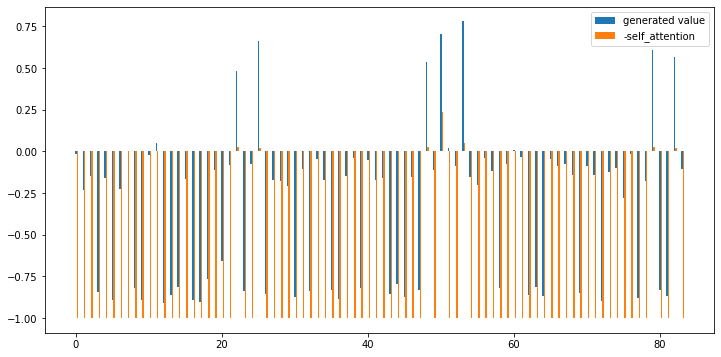

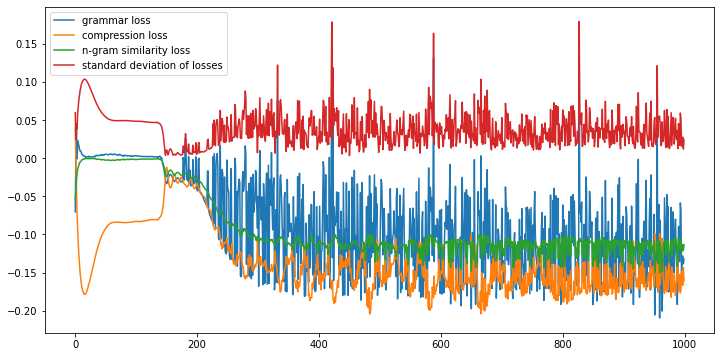

0.2897,0.8676,score:0.5842,[Jamestown hepatitis attended churches communion Jamestown hepatitis]
0.7799,0.3656,score:2.4698,[The bishop of Fargo Diocese in has exposed church Grand and Jamestown the hepatitis virus in late and October and Health Department issued an advisory anyone attended five churches and took communion and Bishop John Folda of the Fargo North Dakota has exposed hundreds of members in Fargo Grand and Jamestown hepatitis A.]
0.7872,0.3794,score:1.9578,[The bishop of Fargo Diocese in has exposed church Grand and Jamestown the hepatitis virus in late and October and Health Department issued an advisory anyone attended five churches and took communion and Bishop John Folda of the Fargo North Dakota has exposed hundreds of members in Fargo Grand Jamestown hepatitis]
0.4306,0.7885,score:0.8154,[Fargo Grand Jamestown hepatitis late advisory attended five churches communion of Fargo Jamestown hepatitis]
0.7607,0.3735,score:2.4929,[The bishop of Fargo Diocese in has exposed 

('The bishop of Fargo Diocese has church Grand Jamestown hepatitis virus in late and October and Health Department issued an advisory anyone attended five churches took communion and Bishop John Folda of Fargo North Dakota has exposed hundreds of members in Fargo Grand and Jamestown hepatitis A.',
 2.8068566144419744,
 5.577311992645264)

In [40]:
logout = True
atten_rate = 0.1
similarity = 1.0
std_factor = 3.0
txt = """
The bishop of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A virus in late September and early October. The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. Bishop John Folda (pictured) of the Fargo Catholic Diocese in North Dakota has exposed potentially hundreds of church members in Fargo Grand Forks and Jamestown to the hepatitis A.
"""
#The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained bishops in Italy last month. Symptoms of hepatitis A include fever, tiredness, loss of appetite, nausea and abdominal discomfort. Fargo Catholic Diocese in North Dakota (pictured) is where the bishop is located.
#The judge agreed with police that he would have been over the limit at the time his red Citroen hit Miss Titley’s blue Daihatsu Cuore on a road near Yarmouth, Isle of Wight, on October 11, 2013. His phone records showed he was also texting around the time of the crash.

sam_wgan4(get_prepared_doc(sentences_dataset[0]),txt,epochs=1000,display= True,retry = False,comp_rate= 1.5)

# 측정 도구...

In [41]:
!pip install rouge-score

In [42]:
from rouge_score import rouge_scorer

scorer = rouge_scorer.RougeScorer(['rouge1','rouge2', 'rougeL'], use_stemmer=True)

# 종합 Test

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


BESM Summary sentance length: 8
--------------------------------------------------
The state Health Department has issued an advisory of exposure for anyone who attended five churches and took communion. The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained bishops in Italy last month. The diocese announced on Monday that Bishop John Folda is taking time off after being diagnosed with hepatitis A. Fargo Catholic Diocese in North Dakota (pictured) is where the bishop is located.
--------------------------------------------------
Length ------------------------------------| 75
{0: -1.0, 1: -1.0, 2: 0.07276003062725067, 3: -1.0, 4: -1.0, 5: -1.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: -1.0, 13: 0.13494886457920074, 14: -1.0, 15: 0.12212468683719635, 16: -1.0, 17: -1.0, 18: 0.05919043719768524, 19: -1.0, 20: -1.0, 21: -1.0, 22: -1.0, 23: 0.26623885333538055, 24: 0.00859840214252472, 25: -1.0, 26: 0.100025

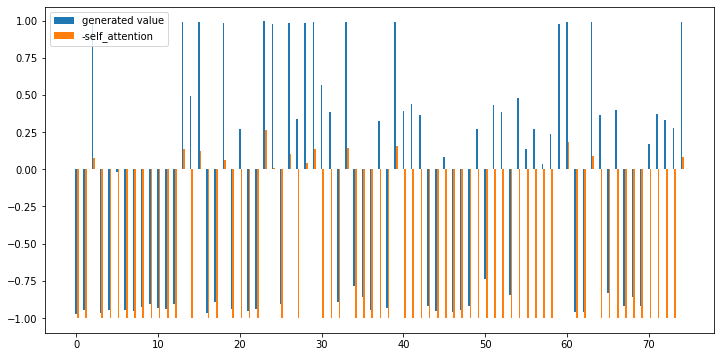

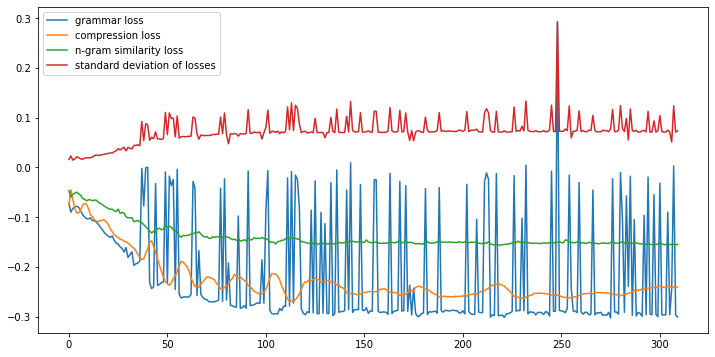

0.6994,0.4224,score:2.4932,[Health issued attended five churches communion he contracted infection through contaminated food while attending conference Italy last month and announced Bishop Folda is time off after being diagnosed with hepatitis Catholic Diocese North where the bishop is located.]
0.7127,0.3966,score:2.1506,[Health issued attended five churches communion The he contracted infection through contaminated food while attending conference bishops Italy last month and announced Bishop Folda is time off after being diagnosed with hepatitis Catholic Diocese North where the bishop is located.]
0.7082,0.4116,score:1.9504,[Health issued attended five churches communion The he contracted infection through contaminated food while attending conference bishops Italy last month and announced Folda is time off after being diagnosed with hepatitis Catholic Diocese North where the bishop is located.]
0.6900,0.4267,score:2.2116,[Health issued attended five churches communion he contracted 

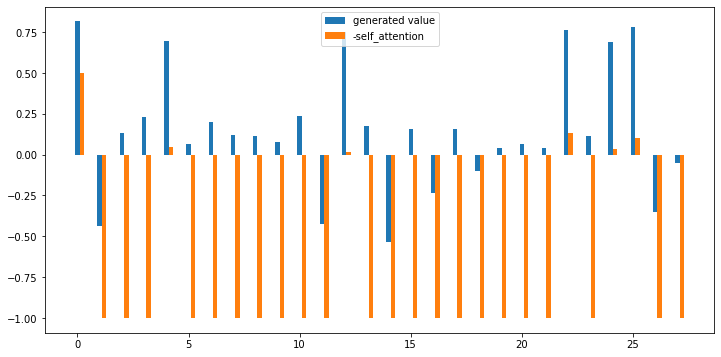

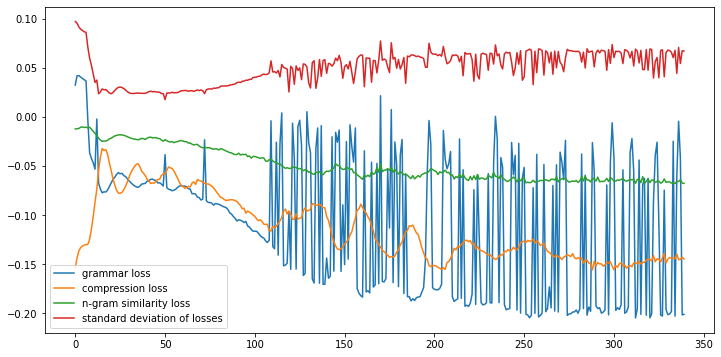

0.7583,0.2378,score:2.7175,[State Program Manager Molly Howell says the risk is low officials feel alert to the possible exposure and Associated Press |.]
0.6160,0.3659,score:1.2702,[State Program Manager Molly Howell the low officials important alert to exposure and Associated Press |.]
0.7896,0.1768,score:2.3680,[State Program Manager Molly Howell says the risk is low officials feel important alert to the possible exposure and Associated Press |.]
0.6684,0.3293,score:0.6836,[State Program Molly Howell the is low officials feel important alert the possible exposure Associated Press |.]
0.5540,0.4634,score:0.7469,[State Program Molly the low officials feel important alert exposure and Associated Press]
0.7985,0.1951,score:2.6084,[State Program Manager Molly Howell says the risk is low officials feel important alert to the possible exposure and Associated Press]
0.7683,0.2195,score:2.4461,[State Program Manager Molly Howell says the risk is low officials feel important alert to possible

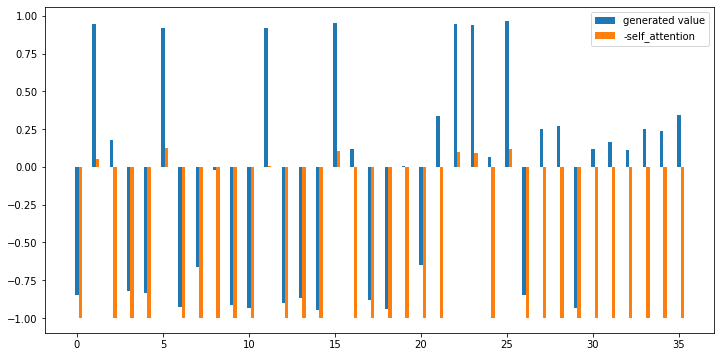

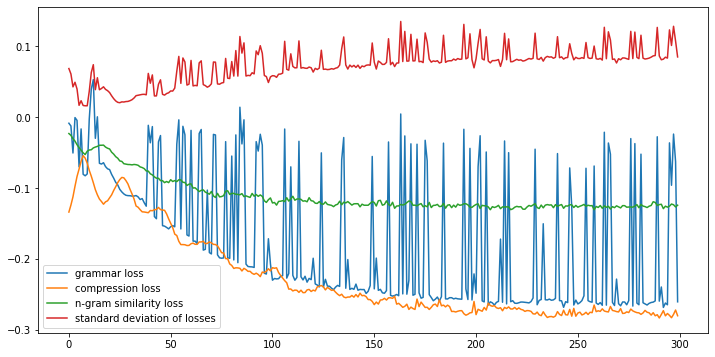

0.6496,0.3879,score:2.4142,[bishop of Catholic North exposed church members Grand and Jamestown to hepatitis virus in September and early October and UPDATED:.]
0.6538,0.3972,score:2.4800,[bishop of Catholic North exposed church members Grand and Jamestown to the hepatitis virus in September and October and UPDATED:.]
0.6819,0.3692,score:2.6092,[bishop of Catholic North exposed church members Grand and Jamestown to the hepatitis virus in September and early October and UPDATED:.]
0.6416,0.4159,score:2.1167,[bishop of Catholic exposed church members Grand and Jamestown to hepatitis virus in September and early October and UPDATED:.]
0.6417,0.4439,score:2.2236,[bishop of Catholic exposed church members and Jamestown to hepatitis virus in September and early October and UPDATED:.]
0.6077,0.5047,score:1.2560,[bishop Catholic exposed church members and Jamestown to hepatitis virus in and early October and UPDATED:.]
0.6117,0.4720,score:2.0452,[bishop of Catholic exposed church members and J

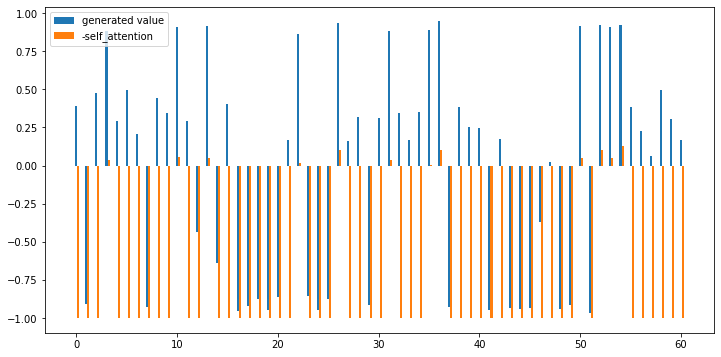

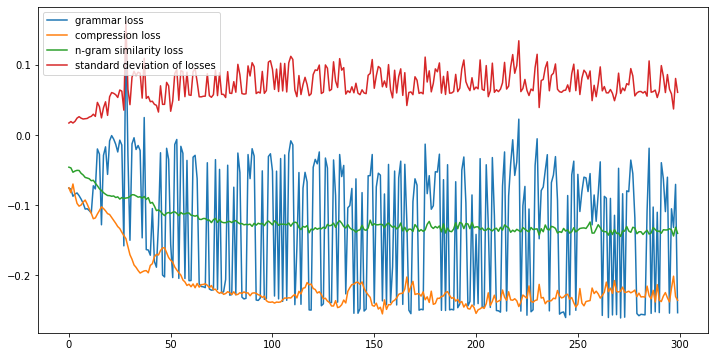

0.6080,0.5435,score:0.8006,[(organization) decided not the murder plot Mata received meetings in a organization been distributing narcotics in elsewhere Mata his police badge purchase drug traffickers.]
0.7911,0.3351,score:2.8613,[Ultimately (organization) decided not to move with the murder plot Mata received the meetings in a statement The organization has been distributing narcotics in Jersey and elsewhere complaint also Mata his police badge to purchase for drug traffickers.]
0.8042,0.3140,score:2.8985,[Ultimately (organization) decided not to move with the murder plot Mata received the meetings in a statement The organization has been distributing narcotics in Jersey and elsewhere complaint also Mata his police badge to purchase weapons for drug traffickers.]
0.7347,0.3958,score:2.5661,[(organization) decided not to with the murder plot Mata received the meetings in a statement The organization has been distributing narcotics in Jersey and elsewhere also Mata his police badge to p

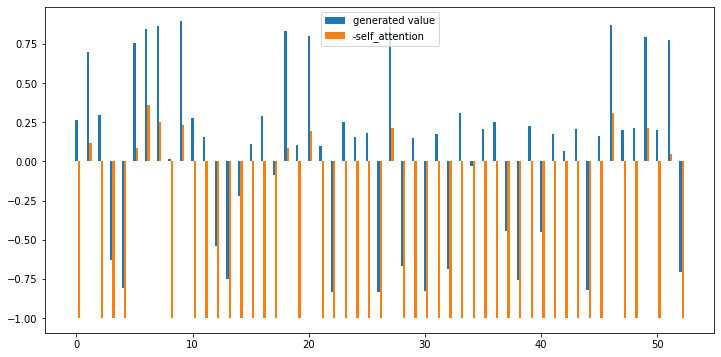

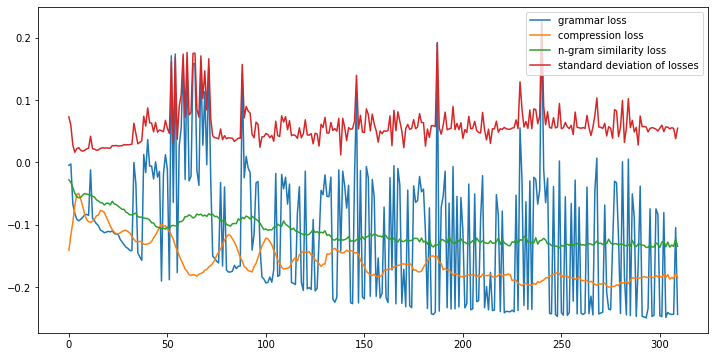

0.8013,0.2758,score:2.3710,[The killers would cops pulling over their targets before shooting the complaint and Outside the office authorities that the 45-year-old officer with drug organization to help plan plot get guns and arrested Mata on Tuesday in Miami Gardens]
0.7635,0.3545,score:2.1103,[The killers would cops pulling over their targets before shooting the complaint Outside the office authorities that 45-year-old officer organization help plan get guns and arrested Mata on Tuesday in Miami Gardens]
0.7023,0.3576,score:2.1760,[The killers would cops pulling over their targets before shooting complaint and Outside office that the 45-year-old officer with drug organization help plan plot guns and arrested Mata on Tuesday in Miami Gardens]
0.7585,0.3273,score:1.5627,[The killers would cops pulling over their targets before shooting complaint and Outside the office authorities that 45-year-old officer with drug organization to help plan plot and arrested Mata on Tuesday in Miami Gar

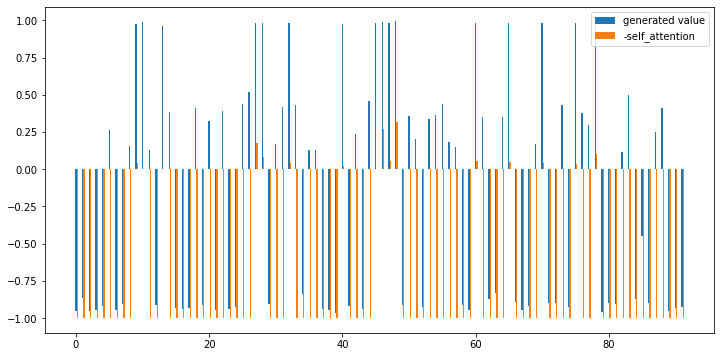

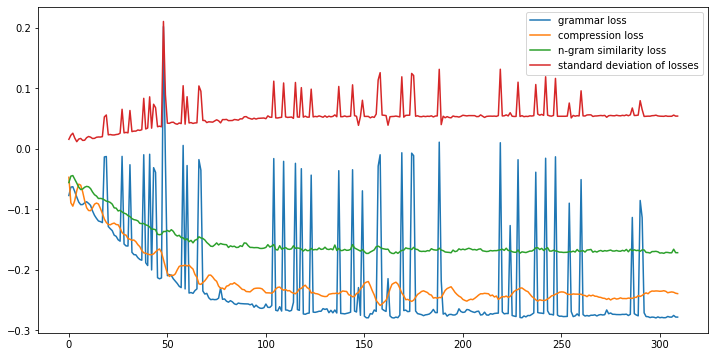

0.7418,0.4660,score:2.3804,[do the name of the trafficking organization allegedly but the been importing narcotics from such as Ecuador and Republic inside containers pallets of produce including bananas Mata has for the Miami-Dade Police Department including directing Miami Gardens a lieutenant K-9 at Miami International Airport complaint and face]
0.7511,0.4395,score:2.5596,[do the name of the trafficking organization allegedly but the been importing narcotics from such as Ecuador and Dominican Republic inside containers pallets of produce including bananas Mata has for the Miami-Dade Police Department including directing Miami Gardens a lieutenant K-9 at Miami International Airport complaint and could face]
0.7463,0.4594,score:2.5638,[do the name of the trafficking organization allegedly but the been importing narcotics from such as Ecuador and Dominican Republic inside containers of produce including bananas Mata has the Miami-Dade Police Department including directing Miami Garden

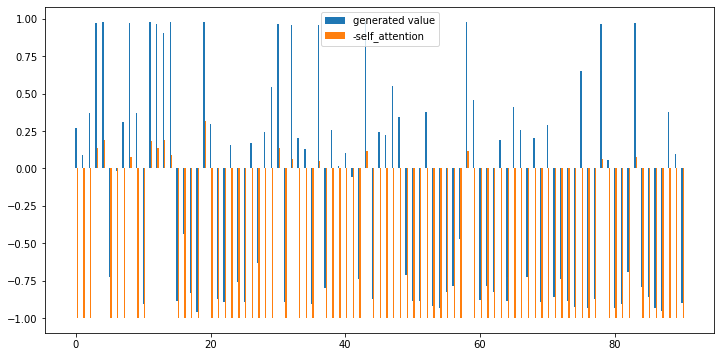

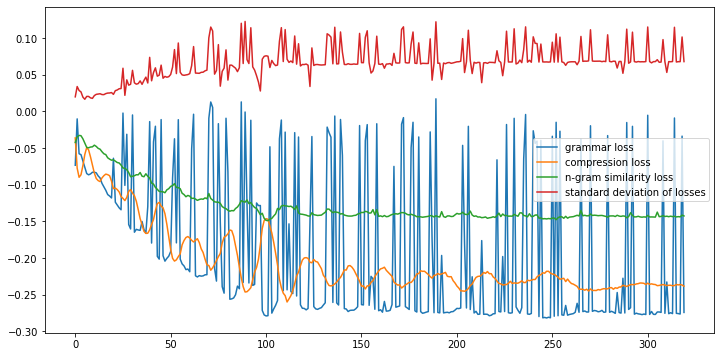

0.7300,0.4814,score:2.3210,[The analysis of his phone showed that he was on his phone around collision so likely also contributed to his driving and loss control This case highlights just tragic consequences of committing these and tragic the these can Eccleston-Todd Newport also driving for he an extended]
0.7286,0.5037,score:2.3950,[The analysis of his phone showed that he was on his phone around collision so likely also contributed to his driving and loss control This case highlights just tragic consequences of committing these and tragic the these can be Newport also driving for he an extended]
0.7351,0.4758,score:2.4822,[The analysis of his phone showed that he was on his phone around collision so likely also contributed to his driving and loss control This case highlights just tragic consequences of committing these and tragic the these can be Eccleston-Todd Newport also driving for he an extended]
0.7247,0.4870,score:2.3176,[The analysis of his phone showed that he was on his ph

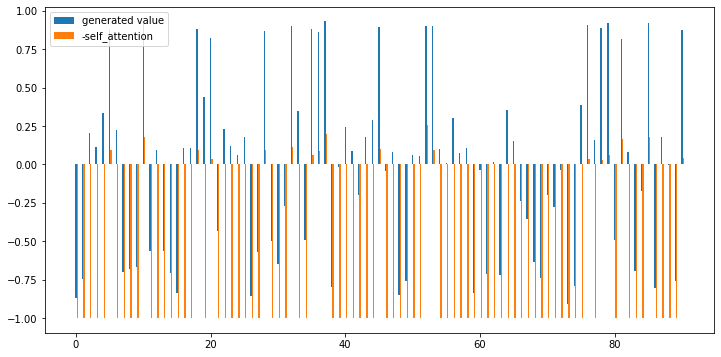

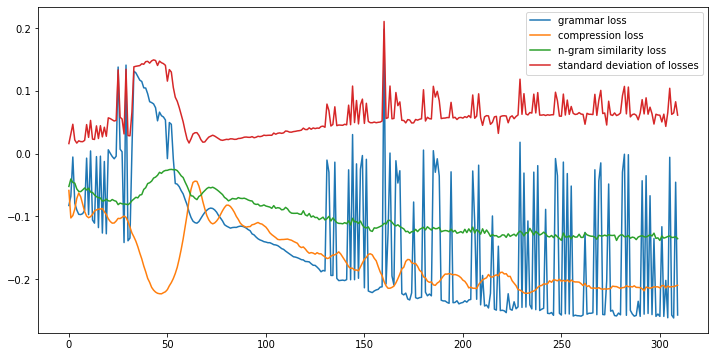

0.7491,0.4349,score:2.3915,[took the decision to pick phone or replying to this text was so distracted that to bend crossing central white line the path of Titley’s oncoming car left the pub to return home when the collision at 9 and I people twice any alcohol and getting behind wheel or phone theyre on road.]
0.7027,0.4790,score:1.6196,[took the decision to pick phone or replying to this text was so that to bend crossing central white line the path of Titley’s oncoming car He left the pub to return home when collision at 9 and I twice any alcohol and getting behind wheel or phone theyre road.]
0.7218,0.4729,score:2.6910,[the decision to pick phone or replying to this text was so distracted that to bend crossing central white line the path of Titley’s oncoming car left the pub to return home when the collision at 9 and I twice any alcohol and getting behind wheel or phone on road.]
0.7410,0.4349,score:2.6392,[took the decision to pick phone or replying to this text was so distracted th

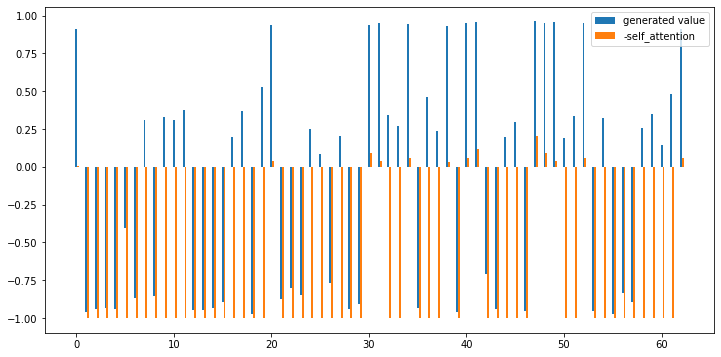

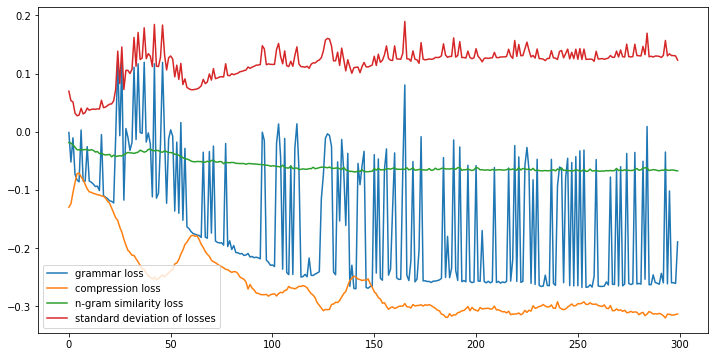

0.7630,0.4018,score:2.7256,[Those spending substantial time in a 28-year-old clerk from Wight had spent with friends at a pub had not drunk alcohol police She had out with friends at a pub Shalfleet had not had any alcohol.]
0.7378,0.4571,score:2.5027,[Those spending time in a 28-year-old from Wight had spent with friends at a pub had not drunk alcohol police She had out with friends at a pub Shalfleet had not had any alcohol.]
0.7497,0.4233,score:2.3405,[Those spending substantial time in a 28-year-old clerk from Wight had spent with friends at a pub not drunk alcohol police She had out with friends a pub Shalfleet had not had any alcohol.]
0.7540,0.4141,score:2.7307,[Those spending substantial time in a 28-year-old clerk from Wight spent with friends at a pub had not drunk alcohol police She had out with friends at a pub Shalfleet had not had any alcohol.]
0.7255,0.4387,score:2.5930,[Those spending substantial time in a 28-year-old clerk from Wight spent with friends at a pub had not

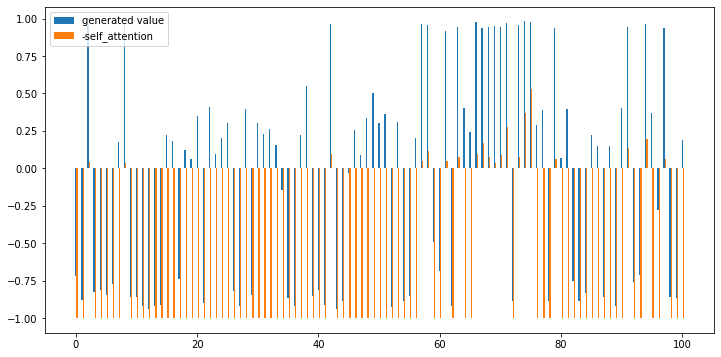

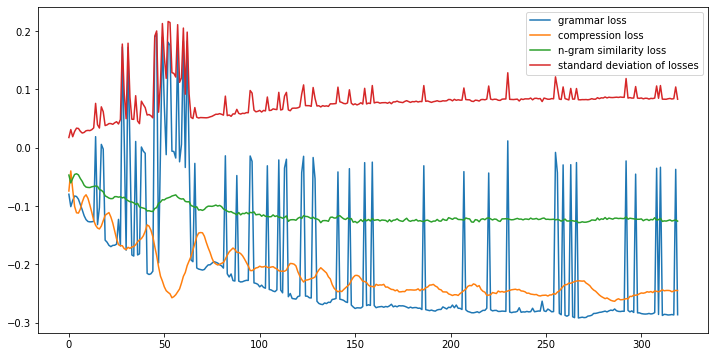

0.6744,0.4414,score:2.4970,[Putin open trade all sides chance to change subject talk less And a strategy might also have a EU chance to deal with some of more of their patronage laundering corruption which have inflated prize assets like London property Picasso paintings for years one can afford that lifeline now Europes economy rebound and one wane.]
0.6421,0.4862,score:2.3197,[Putin open trade all sides chance to change and less And a also have a EU chance to finally deal some of more of their patronage laundering corruption which have inflated prize assets like London property Picasso paintings for years and one can afford that now Europes economy rebound and one wane.]
0.7022,0.4138,score:2.7683,[Putin open trade all sides chance to change subject and talk less And a strategy might also have a EU chance to finally deal with some of more of their patronage laundering corruption which have inflated prize assets like London property Picasso paintings for years and one can afford that 

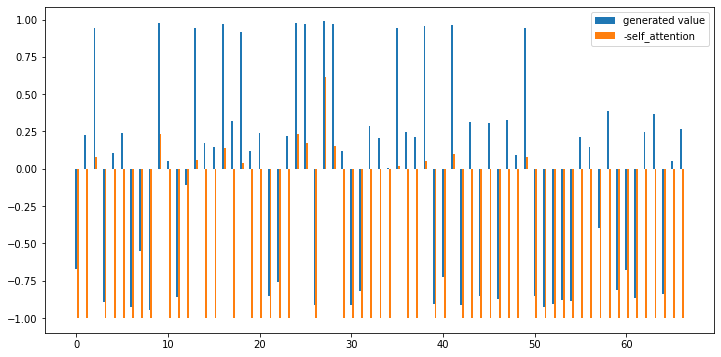

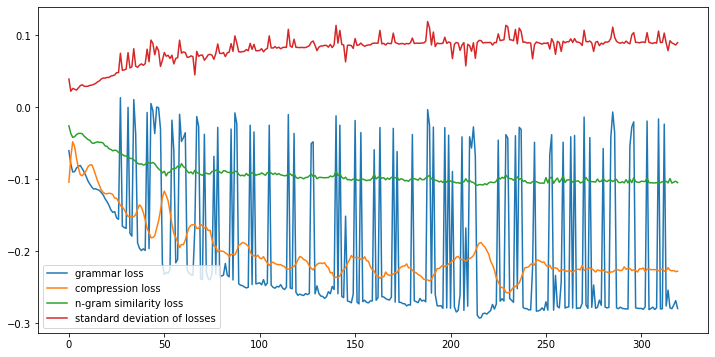

0.6501,0.4561,score:0.9056,[such EU must be sanctions are street will hurt both sides and Sixty Ukraines breakaway peninsula signed away just Soviet Nikita Khrushchev and Asset visa are palatable the EU out discretionary cumbersome legal and recourse.]
0.6745,0.4512,score:2.1649,[such EU must sanctions are street and will hurt both sides and Sixty breakaway peninsula signed away just by Soviet leader Nikita Khrushchev and Asset visa are palatable for the EU discretionary cumbersome legal and recourse.]
0.7095,0.3854,score:2.5167,[such EU must be sanctions are two-way street and will hurt both sides and Sixty Ukraines breakaway peninsula signed away just by Soviet leader Nikita Khrushchev and Asset visa are palatable for the EU out on discretionary cumbersome legal and recourse.]
0.6899,0.4220,score:2.3905,[such EU must be sanctions are street and will hurt both sides and Sixty Ukraines breakaway peninsula signed away just by Soviet leader Nikita Khrushchev and Asset visa are palatable 

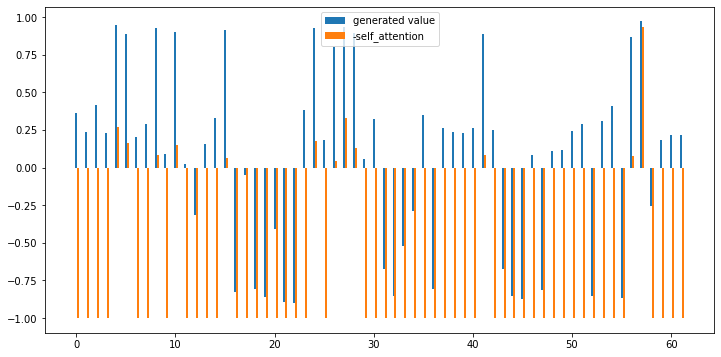

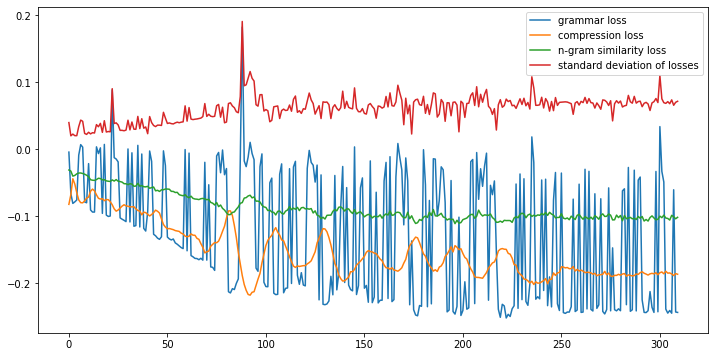

0.8108,0.2710,score:2.4064,[Its true that any trade war would hurt Russia far harder than would the EU not formers GDP comes from exports to the bloc this that those who run Russia essentially sides of the coin Because unlike rushed referendum has a say.]
0.8170,0.2710,score:2.4962,[Its true that any trade war would hurt Russia far harder than would the EU formers GDP comes from exports to the bloc this that those who run Russia and essentially sides of the coin Because unlike rushed referendum has a say.]
0.8171,0.2581,score:2.3560,[Its true that any trade war would hurt Russia far harder than would the EU not formers GDP comes from exports to the bloc this that those who run Russia and essentially sides of the coin Because unlike rushed referendum has a say.]
0.8108,0.2839,score:2.5319,[Its true that any trade war would hurt Russia far harder than would the EU formers GDP comes from exports to the bloc this that those who run Russia essentially sides of the coin Because unlike rushed

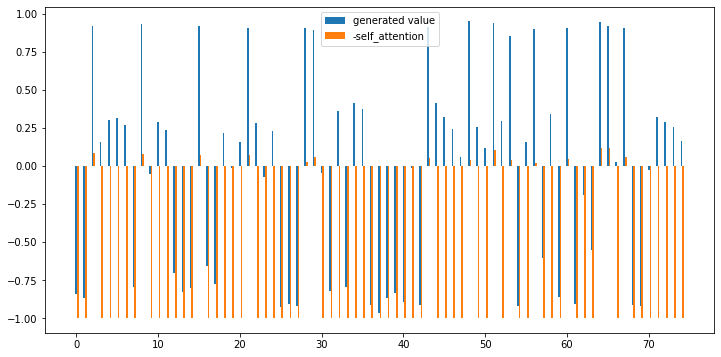

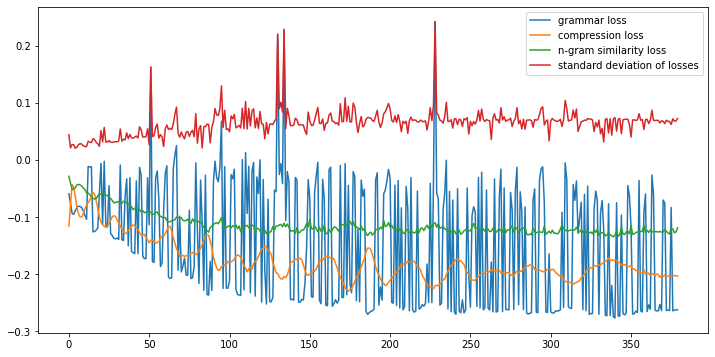

0.7090,0.4214,score:1.6104,[Matt scored hat-trick Rochdale the evening’s Crewe 5-2 and James Hanson became the first against Crawley after minutes before later Fleetwood were one of five teams to have won two out two but other clubs City Chesterfield Crawley hit their first blocks.]
0.7576,0.3759,score:2.6407,[Matt Done scored a hat-trick Rochdale the evening’s Crewe 5-2 and James Hanson became the first against Crawley this after minutes before Fleetwood were one of five teams to have won two out two but other clubs City Chesterfield and Crawley hit their first stumbling blocks.]
0.7713,0.3371,score:2.8037,[Matt Done scored a hat-trick Rochdale in the evening’s Crewe 5-2 and James Hanson became the first against Crawley after minutes before later Fleetwood were one of five teams to have won two out two but other clubs Peterborough City Chesterfield and Crawley hit their first stumbling blocks.]
0.7531,0.3485,score:2.5996,[Matt Done scored a hat-trick Rochdale in the evening’s Crewe 5-

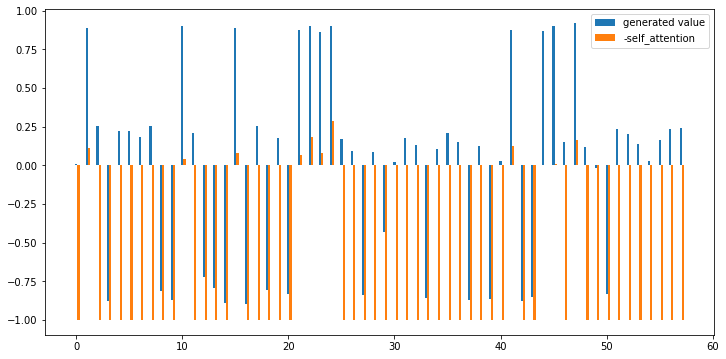

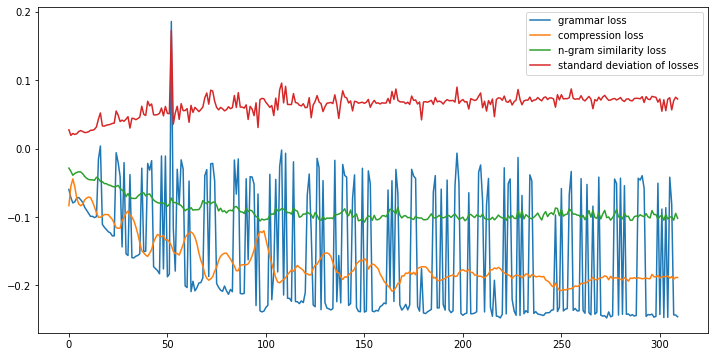

0.7446,0.3142,score:2.4195,[Swindon held to a 2-2 draw Stephen Bywater’s and were of between Coventry and Barnsley too in 2-2 with all four coming in the half Meanwhile Crawley unbeaten status while Bradford maintained theirs to a 3-1 win for the Bantams.]
0.7173,0.3353,score:2.3440,[Finally Swindon held to a 2-2 draw Stephen Bywater’s and of between Coventry and Barnsley too 2-2 with all four coming in the half Meanwhile Crawley unbeaten status while Bradford maintained to a 3-1 win for the Bantams.]
0.7232,0.3293,score:2.5476,[Finally Swindon held a 2-2 draw Stephen Bywater’s and were between Coventry and Barnsley too in 2-2 with all four coming in the half Meanwhile Crawley unbeaten status while Bradford maintained to a 3-1 win for the Bantams.]
0.6876,0.3656,score:2.0022,[Finally Swindon held to a 2-2 draw Stephen Bywater’s and were of between Coventry and Barnsley too 2-2 with all four coming in the half Meanwhile Crawley unbeaten status while Bradford to a win for the Bantams.]
0

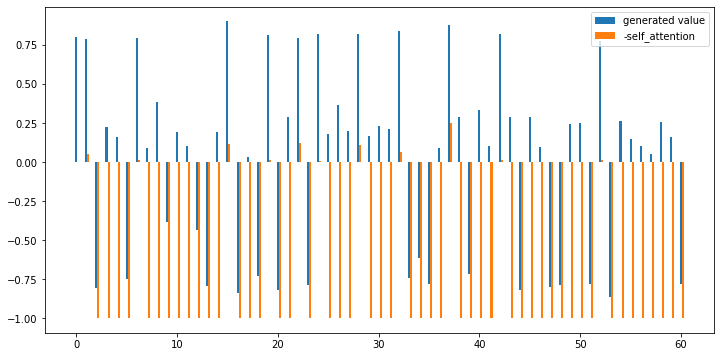

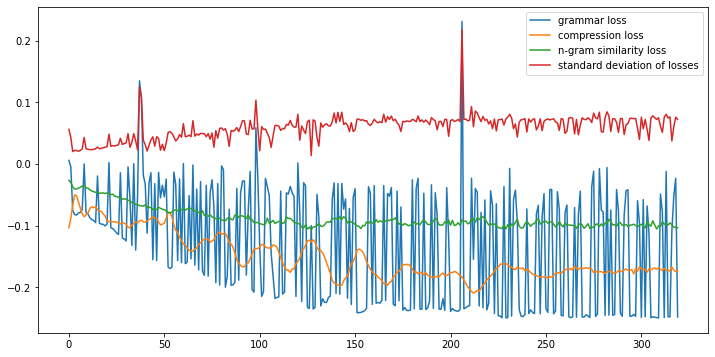

0.7560,0.3075,score:2.5101,[Tom Bradshaw equalised after James Hayter gave Glovers the Notts County a home over Colchester Ronan Murray and Liam Noble on target and Jose the Blades a lead and although it later cancelled Shaun Brisley’s Ben snatched a winner six minutes]
0.7264,0.3736,score:2.2235,[Tom Bradshaw equalised after James Hayter gave the Notts County a home over Colchester Ronan Murray and Liam Noble target and Jose the Blades a lead although later cancelled Shaun Ben snatched a winner six minutes from]
0.7641,0.2931,score:2.4777,[Tom Bradshaw equalised after James Hayter gave Glovers the Notts County a home over Colchester Ronan Murray and Liam Noble on target and Jose the Blades a lead and although it later cancelled Shaun Brisley’s Ben snatched a winner six minutes from]
0.6904,0.3793,score:2.5000,[Tom Bradshaw equalised after James gave Glovers the Notts County a home over Colchester Ronan Murray and Liam Noble on target and Jose Blades a lead and although it later cancel

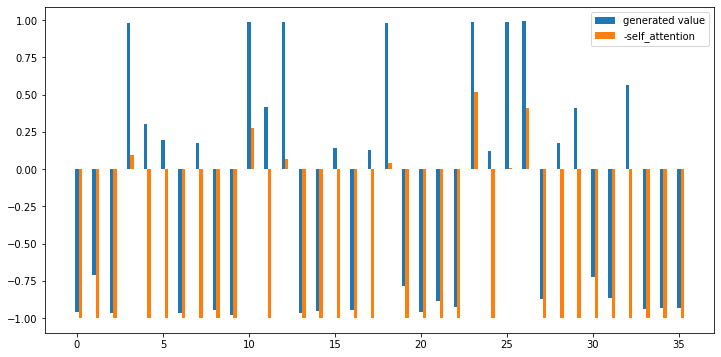

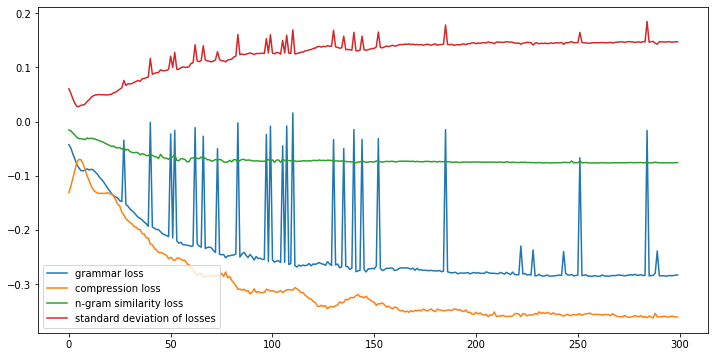

0.5391,0.4974,score:2.0703,[island in a restored farmhouse and retreat styled an Indonesian shirt and beige shorts a trip in]
0.5183,0.5183,score:1.3793,[island in a restored farmhouse and retreat styled an Indonesian shirt beige shorts a trip in]
0.5241,0.5079,score:1.6859,[island in restored farmhouse and retreat styled an Indonesian shirt and beige shorts a trip in]
0.5100,0.5445,score:1.4459,[island in restored farmhouse and retreat an Indonesian shirt and beige shorts a trip in]
0.5155,0.5445,score:1.9440,[island in a farmhouse and retreat styled an Indonesian shirt and beige shorts a trip in]
요약률 0.5445 문법성 2.9679 요약 island in a restored farmhouse and retreat styled an Indonesian shirt and beige shorts a trip in.
--------------------------------------------------
island in a restored farmhouse and retreat styled an Indonesian shirt and beige shorts a trip in. 2.0703178754815053 2.9679415225982666
--------------------------------------------------
Retread: David Cameron with Saman

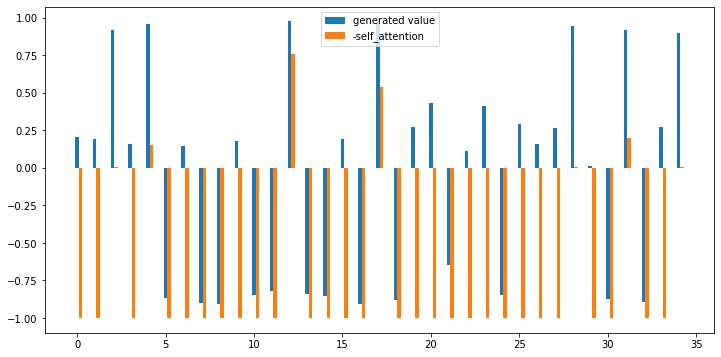

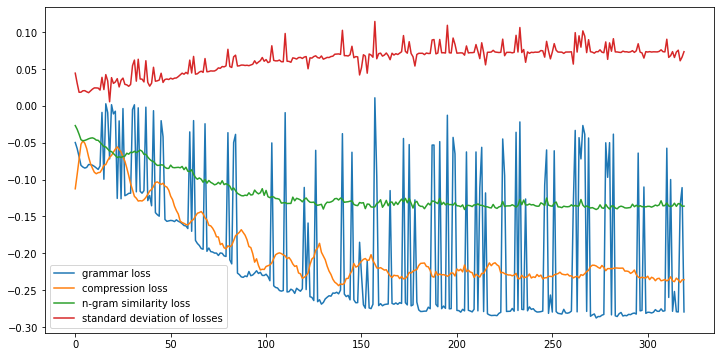

0.7120,0.3019,score:2.3047,[Retread: David Cameron with Samantha and Minister socks black shoes one memorable look and fashion consultant Mrs Cameron trumped husband the style.]
0.7126,0.3255,score:1.4512,[Retread: David Cameron with Samantha and Minister socks black shoes one memorable and fashion consultant Mrs Cameron trumped husband the style.]
0.7175,0.3396,score:1.4213,[Retread: David Cameron with Samantha and Minister socks black shoes memorable look fashion consultant Mrs Cameron trumped husband the style.]
0.7000,0.3208,score:1.6818,[Retread: David Cameron with Samantha and Minister socks black shoes memorable look and fashion consultant Mrs Cameron trumped husband the style.]
0.6274,0.3821,score:1.1620,[Retread: David Cameron Samantha and Minister socks black shoes memorable look and fashion consultant Mrs Cameron husband the style.]
0.7293,0.3208,score:1.4817,[Retread: David Cameron with Samantha and Minister socks black shoes one memorable look fashion consultant Mrs Camero

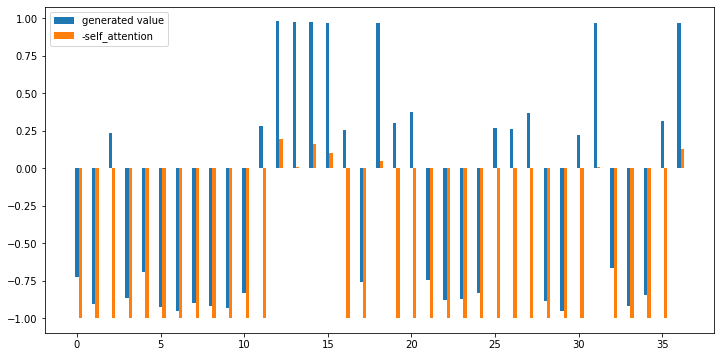

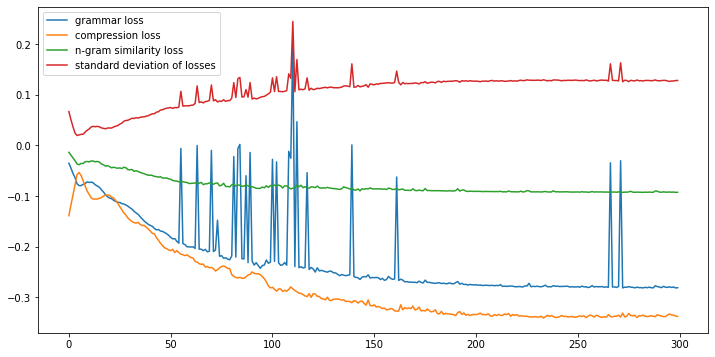

0.5961,0.5519,score:2.3292,[are and stakes wearing an elegant black dress and emerald been accused of a fashion on holiday.]
0.5705,0.5755,score:2.3037,[are and stakes wearing an elegant black dress and emerald accused of a fashion on holiday.]
요약률 0.5755 문법성 3.5104 요약 are and stakes wearing an elegant black dress and emerald been accused of a fashion on holiday.
--------------------------------------------------
are and stakes wearing an elegant black dress and emerald been accused of a fashion on holiday. 2.3292017735410955 3.5104427337646484
================================================== Original Document 5==================================================
He's been accused of making many a fashion faux pas while on holiday. But the Prime Minister seems to be deaf to his critics. Yesterday David Cameron was seen in the same pair of beige loafers he wore on holiday last year. Mr Cameron, who is in Lanzarote with his family, got  the £20 99 shoes from high street store Aldo and to

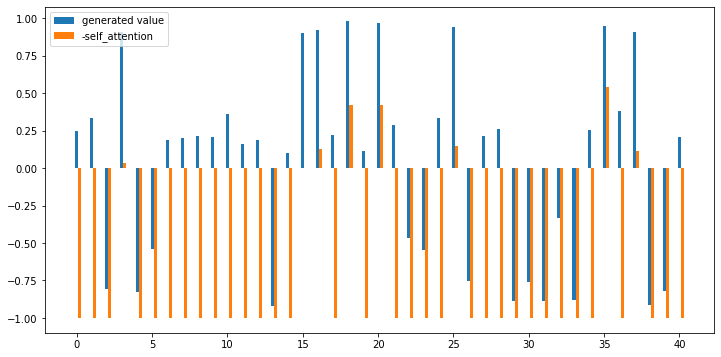

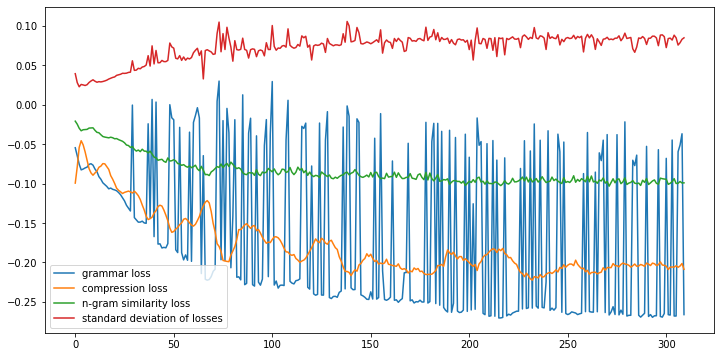

0.7273,0.2915,score:2.6923,[He and Cookie devastated by the diagnosis and Overall about 1 million Americans are living and Johnson admitted his teams told him had HIV in 1991 devastated.]
0.6848,0.3408,score:2.4406,[He and Cookie by the diagnosis and Overall about 1 million Americans are living and Johnson admitted his teams told him had HIV in 1991 devastated.]
0.6952,0.3498,score:2.3918,[He and Cookie devastated by the diagnosis and about 1 million Americans are living and Johnson admitted his teams him had HIV in 1991 devastated.]
0.5544,0.4709,score:1.2083,[He and Cookie the diagnosis and Overall about 1 million Americans are living and Johnson his teams him had HIV in 1991]
0.5453,0.4484,score:2.0924,[He and Cookie by diagnosis and Overall about 1 million Americans living and Johnson admitted his teams told him HIV in 1991]
0.7070,0.3094,score:2.3771,[He and Cookie devastated by diagnosis and Overall about 1 million Americans are living and Johnson admitted his teams told him had 

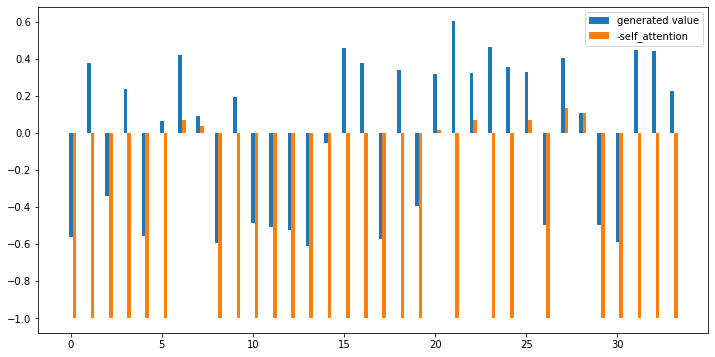

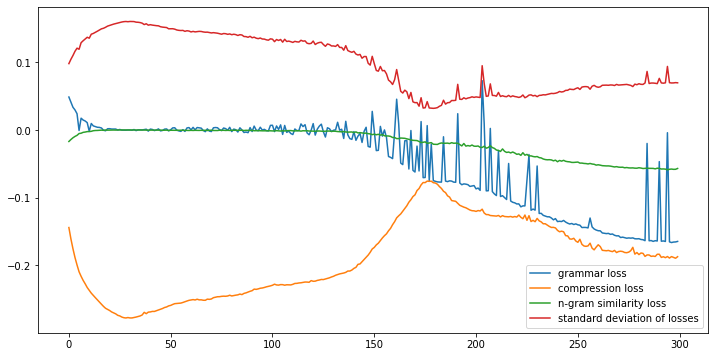

0.6481,0.3869,score:2.2046,[so was frightening and His earlier awareness about OraQuick HIV test and Support: Cookie and Johnson in earlier this year.]
0.6580,0.3719,score:2.1778,[so was frightening and His earlier raise awareness about OraQuick HIV test and Support: Cookie and Johnson earlier this year.]
0.6451,0.4171,score:1.4897,[so was and His earlier raise awareness about OraQuick HIV test and Support: Cookie and Johnson in earlier this year.]
0.6678,0.3568,score:2.1325,[so was frightening and His earlier raise awareness about OraQuick HIV test and Support: Cookie and Johnson in earlier this year.]
0.6381,0.4020,score:2.2549,[so was frightening and His earlier awareness about OraQuick HIV test and Support: Cookie and Johnson earlier this year.]
0.6246,0.4472,score:1.5726,[so was and His earlier awareness about OraQuick HIV test and Support: Cookie and Johnson in earlier this year.]
0.6461,0.4070,score:2.2287,[so was frightening and earlier awareness about OraQuick HIV test and Sup

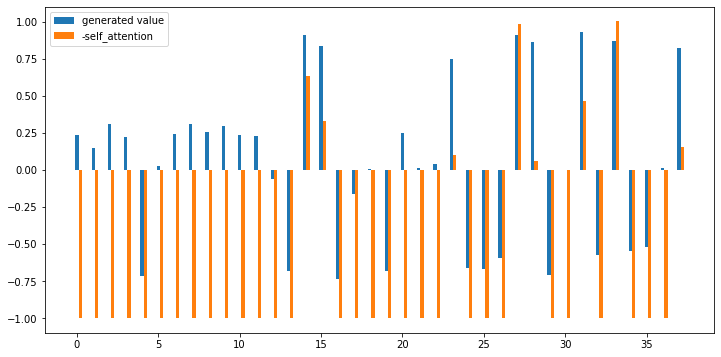

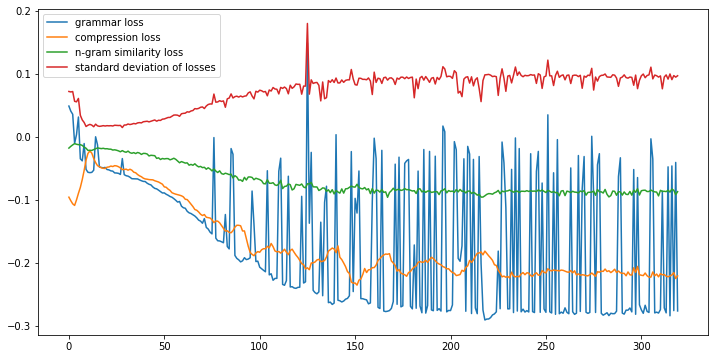

0.6554,0.3763,score:2.4454,[we’re still in denial it can happen to us and of black Americans per cent of new lifestyle who know they HIV to get.]
0.6586,0.3548,score:1.7849,[we’re still in denial it happen to us and of the black Americans for per cent of new lifestyle who know they HIV to get.]
0.6715,0.3441,score:2.5098,[we’re still in denial it can happen to us and of black Americans about per cent of new lifestyle who know they HIV to get.]
0.6844,0.3548,score:2.6084,[we’re still in denial it can happen to us and of the black Americans per cent of new lifestyle who know they HIV to get.]
0.6863,0.3333,score:2.5475,[we’re still in denial it can happen to us and of the black Americans for per cent of new lifestyle who know they HIV to get.]
0.6890,0.3387,score:2.3399,[we’re still in denial can happen to us and of the black Americans about per cent of new lifestyle who know they HIV to get.]
0.6733,0.3710,score:2.2868,[we’re still in denial can happen to us and of the black Americans p

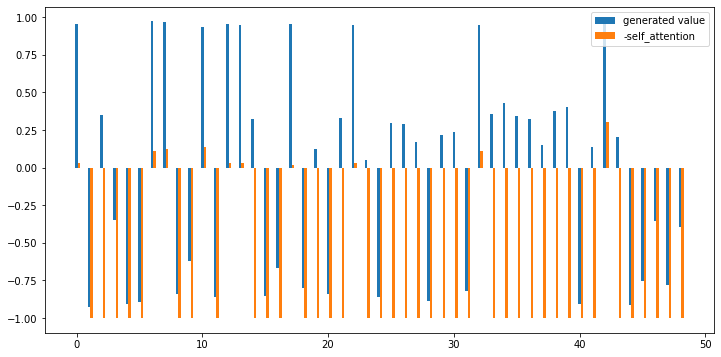

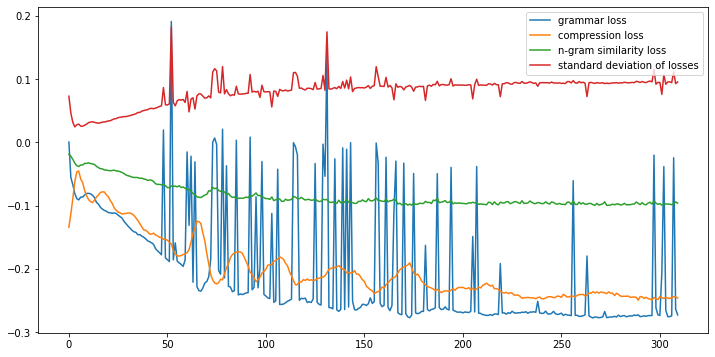

0.6414,0.4275,score:2.4628,[It isn’t train announcer insulting about it and shame because sure it was in good humour There’s not train with a sense of humour and his comments]
0.6859,0.3725,score:2.6205,[It isn’t train announcer insulting about it and shame because sure it was in good humour There’s not train drivers with a sense of humour and think his comments]
0.6653,0.3843,score:2.5419,[It isn’t train announcer insulting about it and shame because sure it was good humour There’s not train drivers with a sense of humour and think his comments]
0.6570,0.4039,score:2.4890,[It isn’t train announcer insulting about it and shame because sure it was in good humour There’s not train with a sense of humour and think his comments]
0.6570,0.4039,score:2.3791,[It isn’t train announcer insulting about it and shame because sure it was in good humour There’s not train drivers with sense of humour and his comments]
0.6061,0.4667,score:2.1270,[It isn’t train announcer insulting about it and shame b

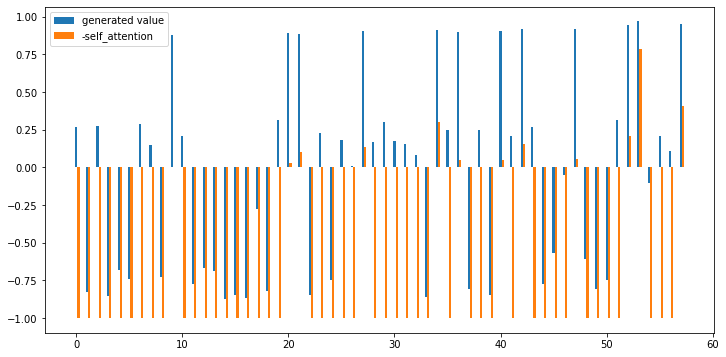

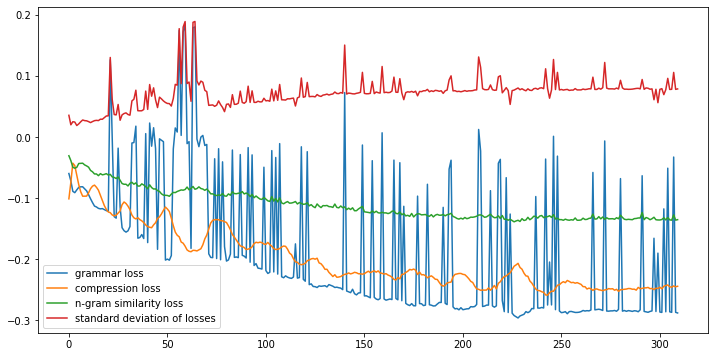

0.7294,0.3547,score:2.4132,[But Midland now launching investigation into to Shrewsbury service The Council called for the matter to be taken with the police branded remarks as racist and a professional be insulting places they are working.]
0.7101,0.3761,score:1.8443,[But Midland now launching investigation into to Shrewsbury service The Council for the matter to be taken with the police branded remarks as racist and a professional be insulting places they are working.]
0.7259,0.3609,score:2.3301,[But Midland now launching investigation into to Shrewsbury service The Council called for the matter to be taken with the police branded remarks as racist and professional be insulting places they are working.]
0.7117,0.3792,score:2.3973,[But Midland now launching investigation to Shrewsbury service The Council called for the matter to be taken with the police branded remarks racist and a professional be insulting places they are working.]
0.7292,0.3670,score:2.4467,[Midland now launching inv

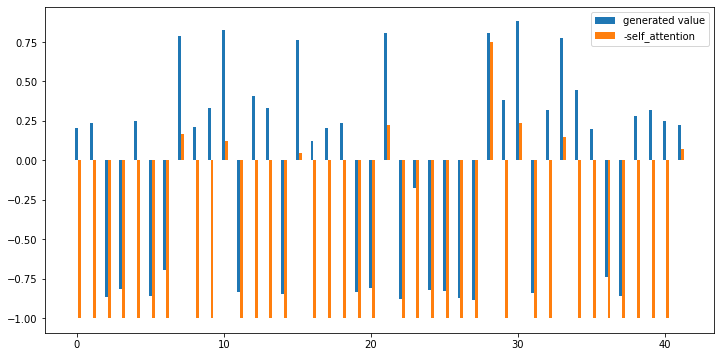

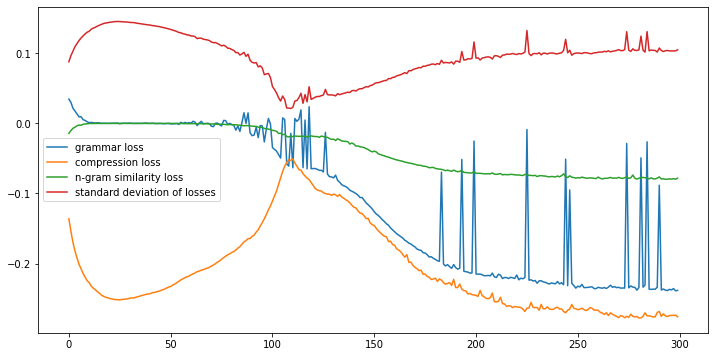

0.7406,0.3493,score:2.5909,[He said: believe Passenger Chris Downes 46 recording on mobile at the time announcer Central - please aware of pickpockets and Scroll down for video.]
0.6978,0.3886,score:2.2086,[He said: believe Passenger Downes 46 recording on mobile the time announcer Central - please aware of pickpockets and Scroll down for video.]
0.7286,0.3843,score:2.6250,[He said: Passenger Chris Downes 46 recording on mobile at the time announcer Central - please aware of pickpockets and Scroll down for video.]
0.7574,0.3144,score:2.5034,[He said: believe Passenger Chris Downes 46 recording on mobile at the time announcer clearly Central - please aware of pickpockets and Scroll down for video.]
0.7206,0.3799,score:2.4492,[He said: believe Passenger Chris Downes 46 recording on mobile at the time announcer Central - please aware of pickpockets and Scroll down for]
0.7147,0.3886,score:1.5128,[said: believe Passenger Chris Downes 46 recording on mobile at the time announcer Central - p

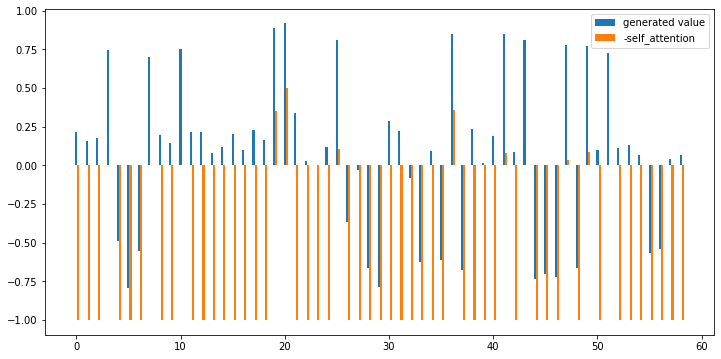

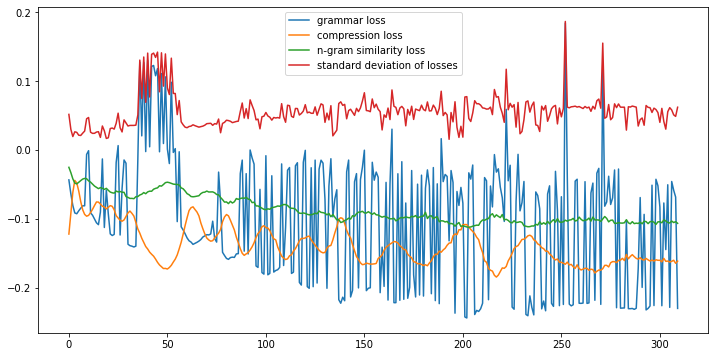

0.7543,0.2964,score:2.3330,[He’s a young player he shouldn’t and he probably regrets it and He’s a nice welcoming respectful and can be big influence ’ and Berahino’s Fletcher be to mentor a player world week that he wanted to play bigger club.]
0.7893,0.2378,score:2.4877,[He’s a young player he shouldn’t and he probably regrets it and He’s a nice kid welcoming respectful and can be big influence rest ’ and Berahino’s Fletcher be expected to mentor a player world week that he wanted to play bigger club.]
0.7212,0.3322,score:1.4693,[a young player he shouldn’t and he probably regrets it and He’s a nice kid welcoming respectful and can big influence rest ’ and Berahino’s Fletcher be to mentor a player world week he wanted to play club.]
0.6399,0.4723,score:0.7743,[young player he shouldn’t and he it and He’s nice welcoming respectful can big influence ’ and Fletcher be mentor a player world week that he wanted to play club.]
0.7658,0.2704,score:2.3853,[He’s a young player he shouldn’t an

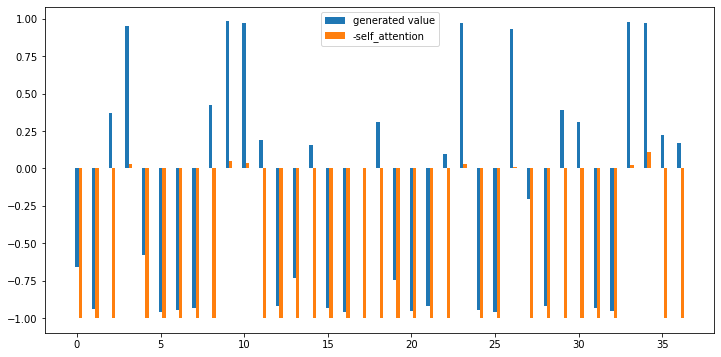

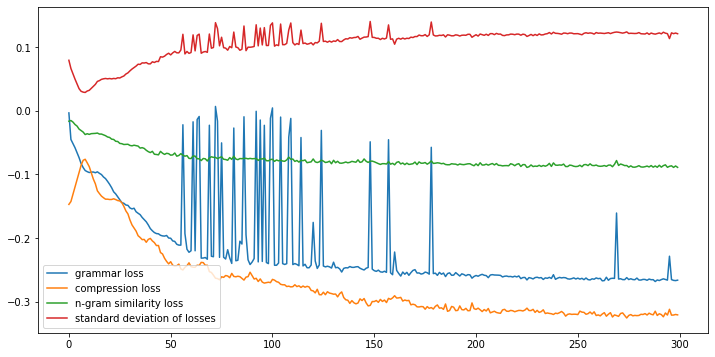

0.5614,0.5075,score:2.4243,[good players will be interested and is for us and Tony advised to focus performances at West Brom.]
0.5353,0.5377,score:2.3321,[good players will be interested and is for us and Tony advised to focus performances at West]
0.5441,0.5276,score:2.1313,[good players will be interested and is us and Tony advised to focus performances at West Brom.]
0.5126,0.5628,score:2.2656,[good players will be interested and is for us and Tony advised to focus performances at]
0.5708,0.5276,score:2.3034,[good players will be interested is for us and Tony advised to focus performances at West Brom.]
0.5455,0.5427,score:2.4418,[good players will be interested and us and Tony advised to focus performances at West Brom.]
0.5397,0.5327,score:2.2497,[players will be interested and is for us and Tony advised to focus performances at West Brom.]
0.5143,0.5528,score:1.9851,[good players will be interested and is us and Tony advised to focus performances at Brom.]
0.5189,0.5477,score:1.

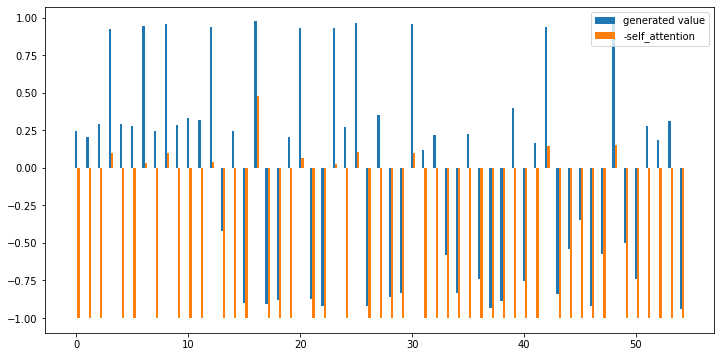

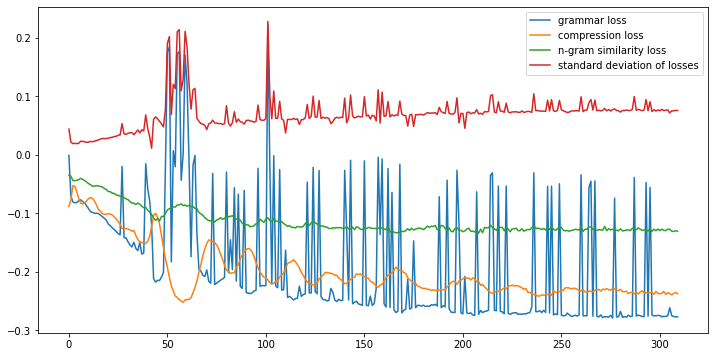

0.6771,0.4542,score:2.2942,[Hes done an interview but not for what he was supposed to be about Fletcher been impressed on the training lads have gone him that players West wants to do]
0.6920,0.4190,score:2.4777,[Hes done an interview but not for what he was supposed to be about Fletcher been impressed on the training but lads have gone him that young players West wants to do]
0.6399,0.4507,score:2.1774,[Hes an interview but not for what he was supposed to be about Fletcher been impressed on training but lads have gone him that young players West wants to do]
0.6781,0.4401,score:2.4133,[Hes done an interview but not for what he was supposed to be about Fletcher been impressed on the training but lads have gone him that players West wants to do]
0.6616,0.4577,score:2.4901,[Hes done an interview but not for what he was supposed to be about Fletcher been impressed on the training but lads have him that players West wants to do]
0.6910,0.4331,score:2.3828,[Hes done an interview but not for

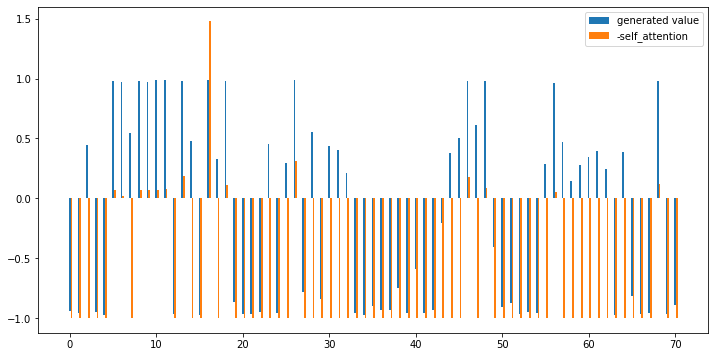

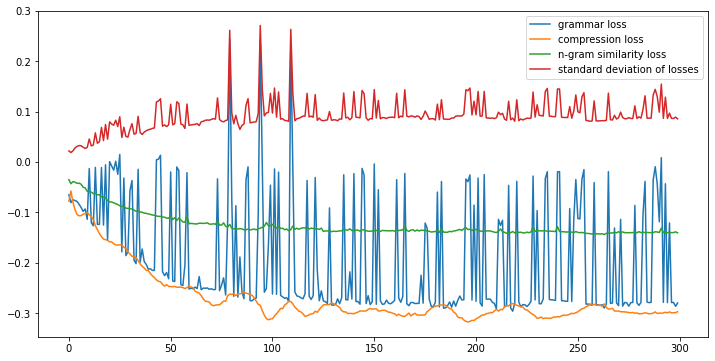

0.7102,0.4633,score:2.4108,[center memory board with eight flash memory chips bigger than palm of his with recorders Campbell has to tackle by the aircraft manufacturer investigators of data and begin the process of getting clearer happened]
0.7258,0.4506,score:2.1916,[center memory board with eight flash memory chips bigger than palm of his with recorders Campbell has to tackle what by the aircraft manufacturer investigators of data and begin the process of getting clearer happened]
0.7191,0.4582,score:2.1797,[center memory board with eight flash memory chips bigger than palm of his with recorders Campbell has to tackle what by the aircraft manufacturer investigators data and begin the process of getting clearer happened]
0.7106,0.4785,score:1.5280,[center memory board with eight flash memory chips bigger than palm of his with recorders Campbell has tackle what by the aircraft manufacturer investigators of data and begin the process of getting happened]
0.6929,0.4835,score:1.6543,[cen

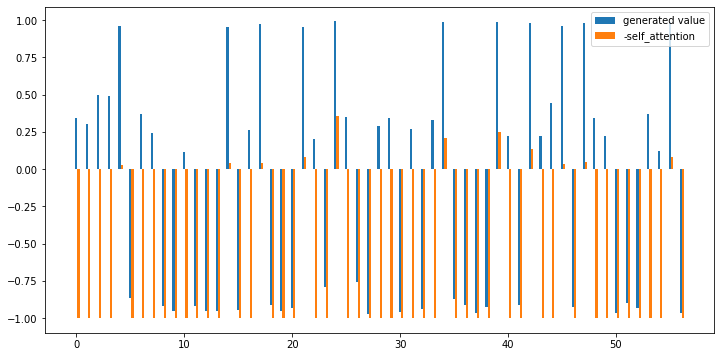

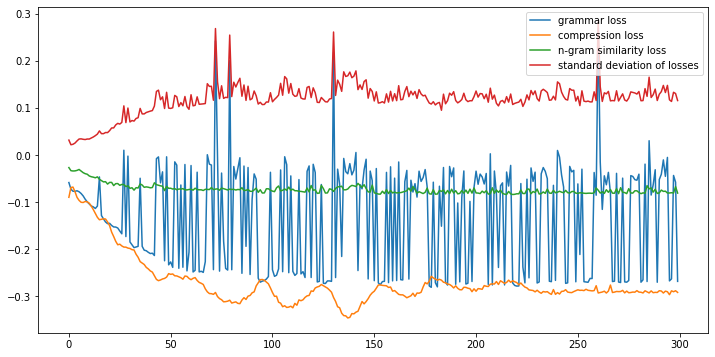

0.6814,0.3969,score:1.5517,[Just handful of countries the capability know-how inside box shelves of labs main examples of boxes have survived conditions and cockpit voice recorder captures audio channels for two hours before]
0.5289,0.5508,score:0.8921,[a handful countries know-how inside black box shelves labs examples boxes have survived conditions cockpit recorder captures audio channels before]
0.6723,0.4123,score:2.4493,[Just a handful of countries capability inside black box shelves of labs main examples of boxes have survived conditions and cockpit voice recorder captures audio channels for two hours before]
0.7194,0.3723,score:2.2415,[Just a handful of countries the capability know-how inside black box shelves of labs main examples of boxes have survived conditions and cockpit voice recorder captures audio channels for two hours before]
0.3393,0.7446,score:0.4602,[countries inside box shelves labs survived conditions cockpit captures audio before]
0.7071,0.3815,score:2.3353,[Ju

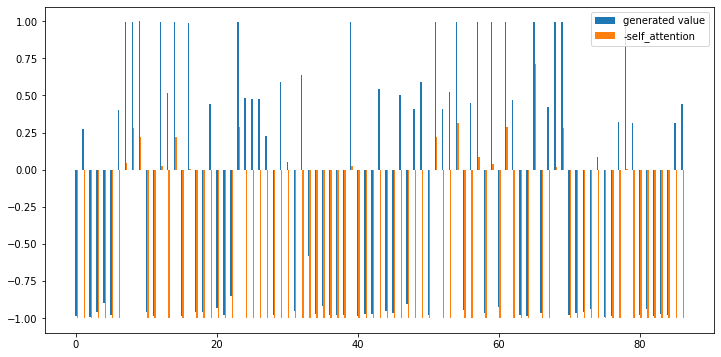

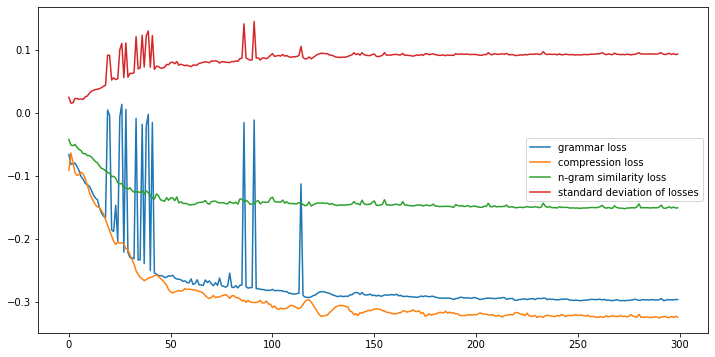

0.7215,0.4840,score:2.8031,[engineer taking apart flight data recovering the data them two place that may play a role in the Boeing 239 crew board and inside the Australian Transport Bureaus accident lab place where boxes Malaysian Airlines flight if theyre recovered from Indian Ocean.]
0.7221,0.4920,score:2.9021,[engineer taking apart flight data recovering the data them place that may play a role in the Boeing 239 crew board and inside the Australian Transport Bureaus accident lab place where boxes Malaysian Airlines flight if theyre recovered from Indian Ocean.]
0.7221,0.4920,score:2.8499,[engineer taking apart flight data recovering the data them two place that may play a role in the Boeing crew board and inside the Australian Transport Bureaus accident lab place where boxes Malaysian Airlines flight if theyre recovered from Indian Ocean.]
0.7199,0.4880,score:2.7115,[engineer taking apart flight data recovering the data them two place that may play role in the Boeing 239 crew board

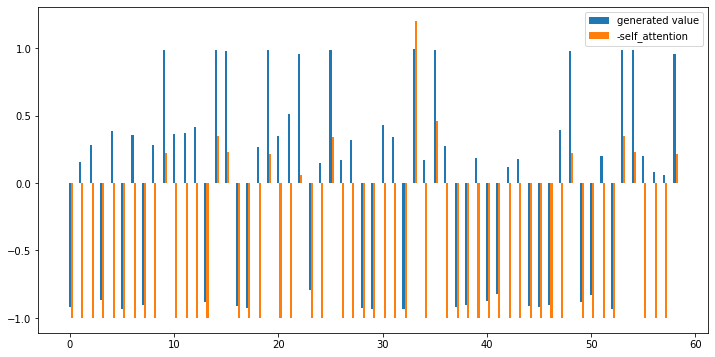

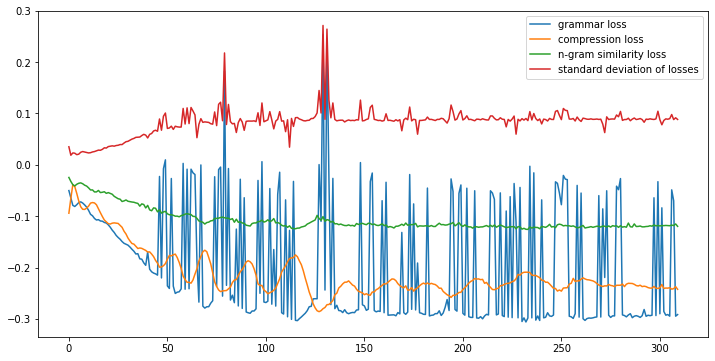

0.7755,0.3683,score:2.6556,[biggest challenge that is to portray the reality of spherical world flat map – a problem has haunted cartographers for But in Africa is larger than The is to portray of spherical world on a flat map.]
0.7894,0.3524,score:2.6736,[biggest challenge that is to portray the reality of spherical world flat map – a problem has haunted cartographers for But in Africa is larger than The is that to portray of spherical world on a flat map.]
0.7762,0.3683,score:2.5509,[biggest challenge that is to portray the reality of spherical world flat map – a problem has haunted cartographers for But in Africa is larger than The is that to portray of spherical world on a map.]
0.6821,0.4286,score:1.1529,[challenge that is to portray reality of spherical world flat map – problem haunted cartographers for But in Africa larger than The is that to portray of spherical world a flat map.]
0.7628,0.3746,score:2.5591,[biggest challenge that is to portray the reality of spherical world fl

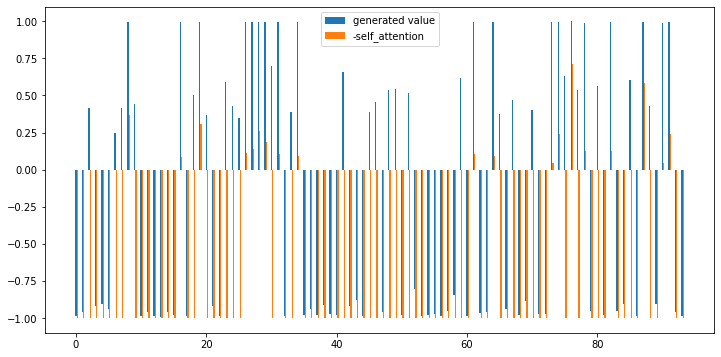

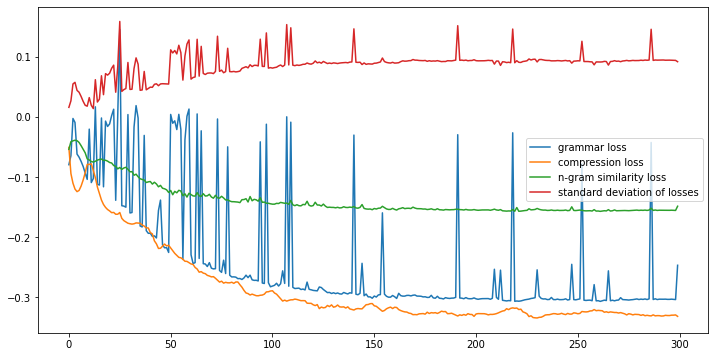

0.7157,0.4746,score:2.3357,[is the Mercator projection the classrooms in text books created in 1596 to help sailors navigate the world Google Maps never-ending perfect map Jerry Brotton of of World Maps isnt sure map Scandinavian countries are larger than India in India times size of Scandinavian countries]
0.7090,0.4821,score:2.4548,[is the Mercator projection the classrooms in text books created in 1596 to help sailors navigate the world Google Maps never-ending perfect map Jerry Brotton of of World Maps isnt sure Scandinavian countries are larger than India in India times size of Scandinavian countries]
0.6966,0.4821,score:2.3675,[is the Mercator projection classrooms in text books created in 1596 to help sailors navigate the world Google Maps never-ending perfect map Jerry Brotton of of World Maps isnt sure map Scandinavian countries are larger than India in India times size of Scandinavian countries]
0.7027,0.4802,score:2.0191,[is the Mercator projection the classrooms in text boo

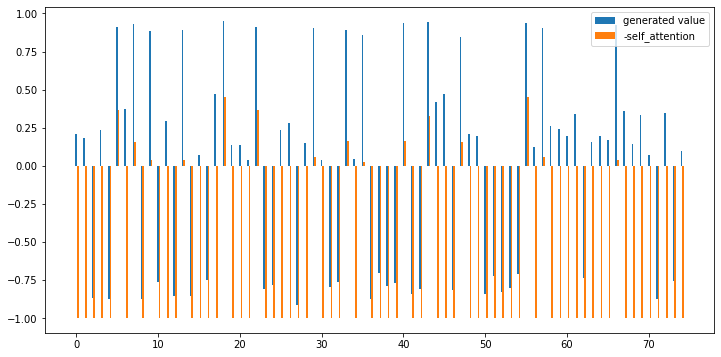

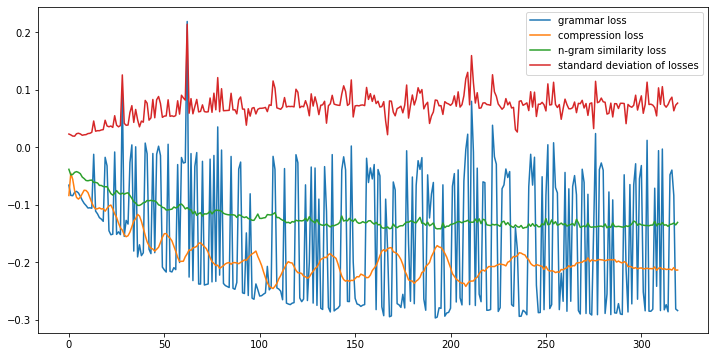

0.7130,0.4237,score:1.3290,[The map that countries are larger India in India three the size of all countries and But reality China is bigger Greenland bigger America and larger than Alaska size of China and placed it middle of a world that otherwise consisted mainly small islands.]
0.7484,0.3986,score:2.1521,[The map that countries are larger India in India three the size of all countries and But reality China is bigger than Greenland bigger America Mexico larger than Alaska size of China and placed it in middle of a world that otherwise consisted mainly small islands.]
0.7888,0.3599,score:2.5534,[The map that countries are larger India in India three the size of all Scandinavian countries and But reality China is bigger than Greenland bigger America and Mexico larger than Alaska size of China and placed it in middle of a world that otherwise consisted mainly small islands.]
0.7334,0.4077,score:2.3926,[The map that countries are larger India in India three the size of all countries and

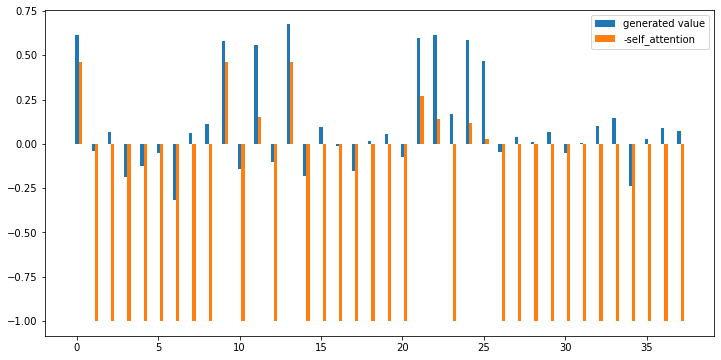

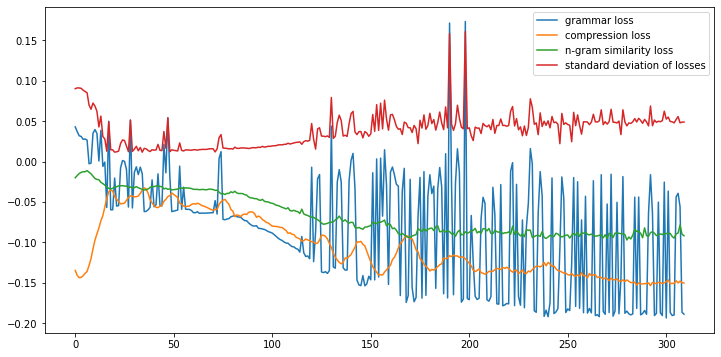

0.7591,0.2523,score:2.6725,[In lawsuit Dershowitz In sworn statement in Florida and claims to have sex as a minor with prominent criminal lawyer Alan Dershowitz filed a counter-defamation.]
0.7806,0.2570,score:2.7760,[In lawsuit Dershowitz In a sworn statement in Florida and to have sex as a minor with prominent U S criminal lawyer Alan Dershowitz filed a counter-defamation.]
0.7338,0.3224,score:2.7283,[In their and In a sworn statement in Florida and to have sex as a minor with prominent U S criminal lawyer Dershowitz filed a counter-defamation.]
0.7663,0.2804,score:2.6774,[In their Dershowitz In a sworn in Florida and claims to have sex as a minor with prominent U S criminal lawyer Alan Dershowitz filed a counter-defamation.]
0.7328,0.2570,score:2.5760,[In their lawsuit Dershowitz and In sworn in Florida and claims to sex as a minor with prominent U S criminal lawyer Alan Dershowitz filed a counter-defamation.]
0.3962,0.6869,score:0.5676,[In and In sworn in sex as minor with criminal

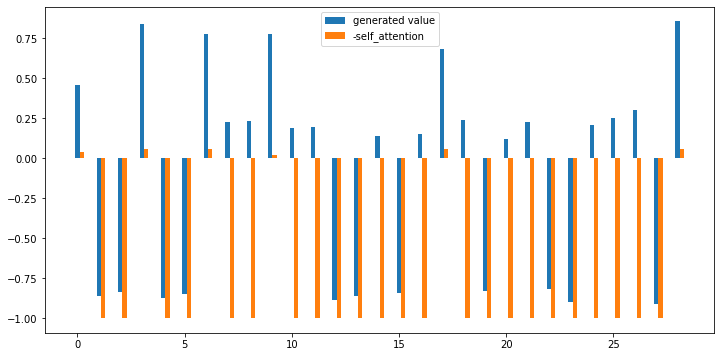

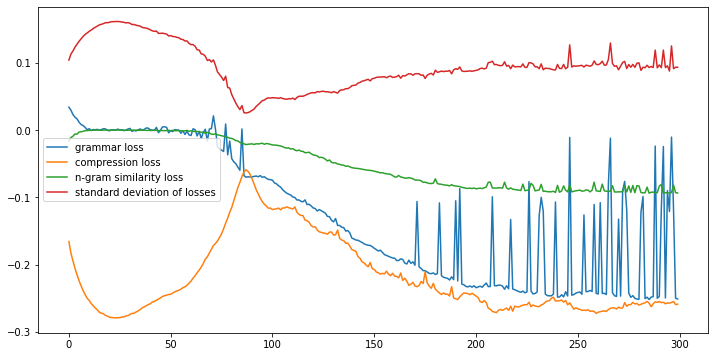

0.4674,0.5030,score:1.9918,[people and and Also on Monday filed in court and In filing in court last week and.]
0.5825,0.4364,score:2.1029,[people and and Also on Monday Dershowitz filed in court and In filing in court last week and.]
0.5920,0.4545,score:1.6063,[people and and Also on Monday Dershowitz filed court and In filing in court last week and.]
0.5697,0.4727,score:1.9109,[people and and Also on Monday Dershowitz filed in court and In filing in last week and.]
0.5574,0.4727,score:1.9245,[people and and Also on Monday Dershowitz in court and In filing in court last week and.]
0.5534,0.4788,score:1.9959,[people and and Also on Monday Dershowitz filed in court and In in court last week and.]
0.5413,0.5091,score:1.2155,[people and and Also Monday Dershowitz court and In filing in court last week and.]
0.5314,0.5333,score:0.9345,[people and and Also on Monday Dershowitz court and In in court last week and.]
0.5132,0.5394,score:0.7223,[people and and Also Monday Dershowitz court and I

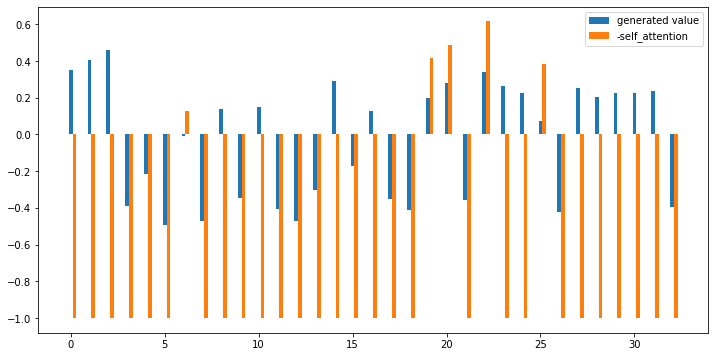

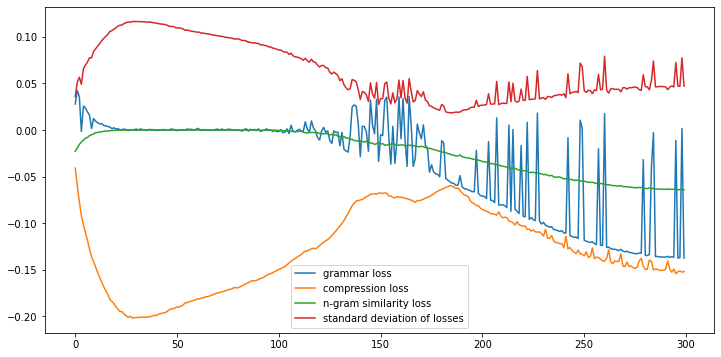

0.7022,0.4348,score:2.4528,[Former federal judge and court had with girl on Roberts accused the prince Dershowitz of having sex with]
0.7088,0.3913,score:1.3310,[Former federal judge Florida and court had with girl on Roberts accused the prince Dershowitz of having sex with]
0.6789,0.4728,score:2.3452,[Former federal judge and court had with girl on Roberts accused the Dershowitz of having sex with]
요약률 0.4728 문법성 3.6814 요약 Former federal judge and court had with girl on Roberts accused the prince Dershowitz of having sex with.
--------------------------------------------------
Former federal judge and court had with girl on Roberts accused the prince Dershowitz of having sex with. 2.45280937713186 3.6813623905181885
================================================== Original Document 11==================================================
Two lawyers representing a woman who. claims to have had sex as a minor with prominent U S criminal defense lawyer Alan Dershowitz have filed a counter

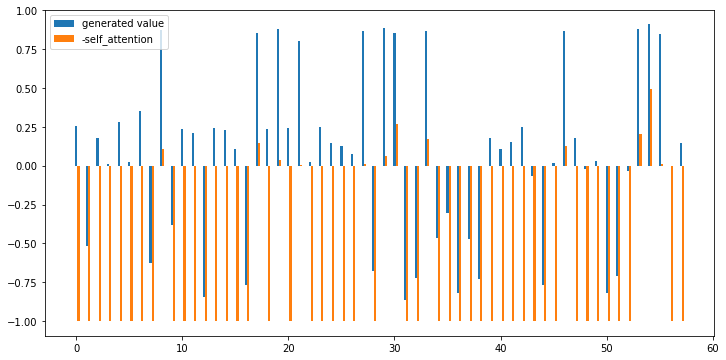

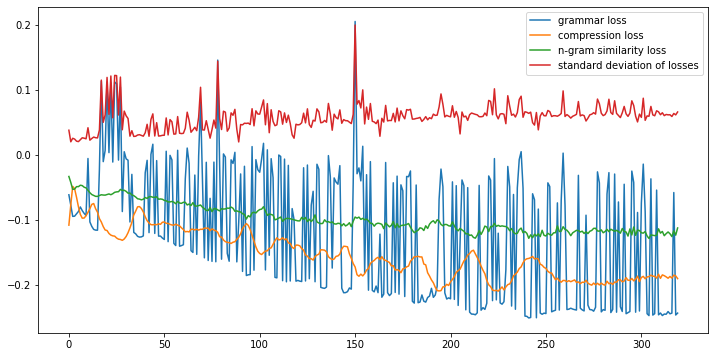

0.7960,0.2614,score:2.7671,[Theres very personal meaning behind it Id to share it all began Her friend booked the session as a gift and we had beautiful sunny service Mrs Ernhart has built a photographers around the terminally ill pets with their owners.]
0.8125,0.2320,score:2.6205,[Theres very personal meaning behind it Id to share it all began Her friend booked the session as a gift and we had beautiful sunny service Mrs Ernhart has built a of photographers around the world terminally ill pets with their owners.]
0.7907,0.2582,score:2.4074,[Theres very personal meaning behind it Id to share it all began Her friend booked the session as a gift and we had beautiful sunny service Mrs has built a of photographers around the world terminally ill pets with their owners.]
0.7708,0.2745,score:2.5475,[Theres very personal behind it Id to share it all began Her friend booked the session as a gift and had beautiful sunny service Mrs Ernhart has built of photographers around the world terminally

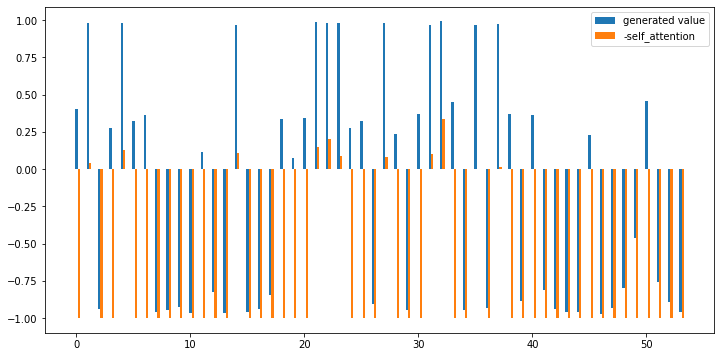

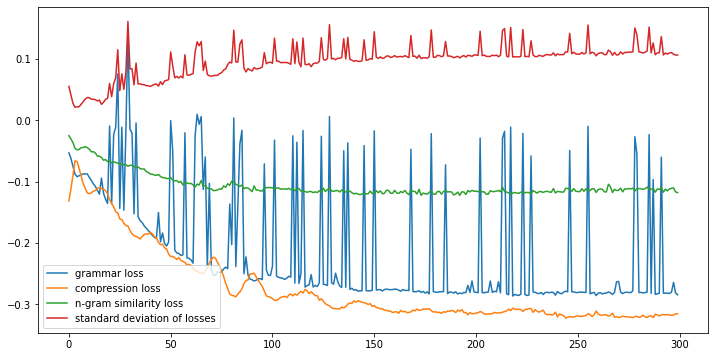

0.6692,0.4189,score:2.2829,[The service become widespread enough that a photographers who shoot terminally ill pets with their owners Joy would herself under Joan to her stand firm help inside peoples]
0.6828,0.4054,score:2.5570,[The service become widespread enough that photographers who shoot terminally ill pets with their owners Joy would herself under Joan to her stand firm help inside these peoples]
0.6595,0.4459,score:2.0923,[The service widespread enough that a photographers who shoot terminally ill pets with their Joy would herself under Joan to her stand firm help inside these peoples]
0.6572,0.4426,score:1.4869,[The service widespread enough that a photographers who shoot terminally ill pets with their owners Joy would herself under Joan to her stand firm help inside peoples]
0.6832,0.3986,score:2.3579,[The service become widespread enough that a photographers who shoot terminally ill pets with their owners Joy would herself under Joan to her stand firm help inside these peop

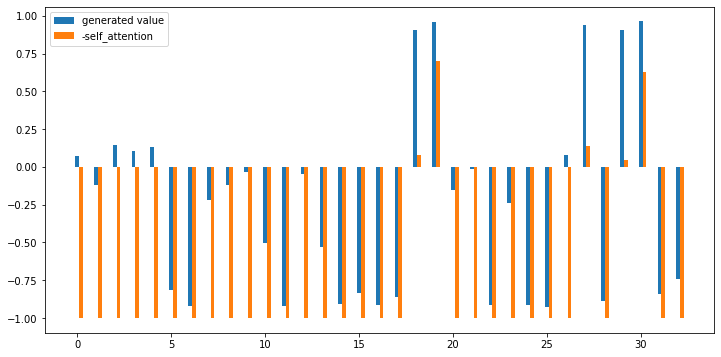

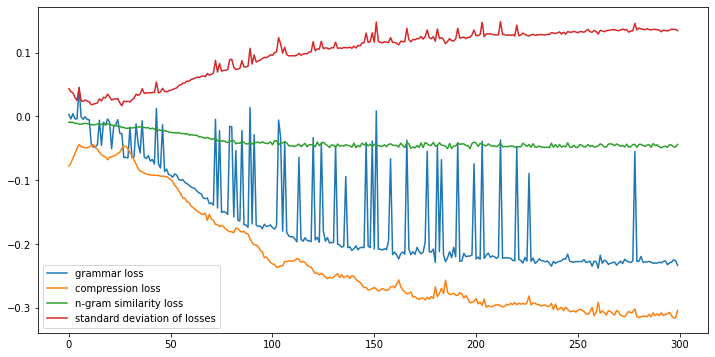

0.5941,0.5137,score:1.6083,[was so blessed to have into her life eyes as Joan Service Dog Black Lab]
0.6799,0.4247,score:2.2228,[was so blessed to have into her life eyes as Joan and Joy help Service Dog Black Lab]
0.6491,0.4589,score:2.4682,[was so blessed to have her life eyes as Joan and Joy help Service Dog Black Lab]
0.6539,0.4521,score:2.2654,[was so blessed to have into her life eyes as Joan and help Service Dog Black Lab]
0.4623,0.6644,score:2.1847,[was blessed to have her as Joan Joy Dog Black Lab]
0.5858,0.4863,score:2.2497,[was so blessed to have her life eyes as Joan Joy help Service Dog Black Lab]
0.6578,0.4863,score:2.7810,[was so blessed to have into her life as Joan and help Service Dog Black Lab]
0.6121,0.5137,score:2.4729,[was so blessed to have her life eyes as Joan and Joy help Dog Black Lab]
0.5312,0.5342,score:1.9534,[was blessed to have her life eyes as Joan help Service Dog Black Lab]
0.6259,0.5205,score:2.7563,[was so blessed to have her life as Joan and help S

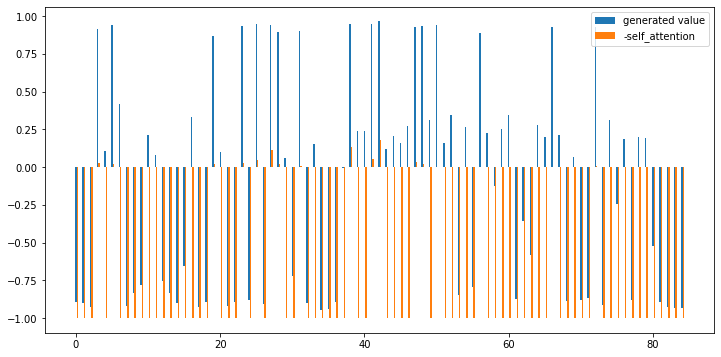

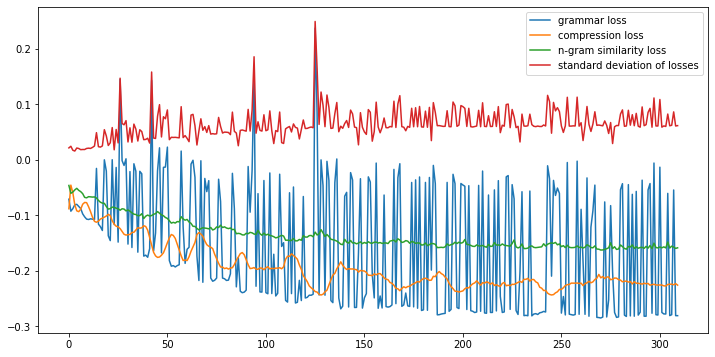

0.7123,0.3958,score:1.9999,[hooked by Van Gaal minutes at Monday Manchester Uniteds over Saints Robin van Persies either of ensured United left the south coast with three points Louis van Gaal said he had option to substitute Paddy McNair in against Southampton because the confidence - believes that it benefit the]
0.6968,0.3979,score:2.2098,[hooked by Van Gaal minutes at Monday Manchester Uniteds over Saints Robin van Persies either of ensured United left the south coast with three points and Louis van said he had option to substitute Paddy McNair in against Southampton because the confidence - believes that it benefit the]
0.6678,0.4442,score:1.8721,[hooked by Van Gaal at Monday Manchester Uniteds over Saints Robin van Persies either of ensured United the south coast with points and Louis van Gaal said he had option to substitute Paddy McNair in Southampton because the confidence - believes that it benefit the]
0.5881,0.4884,score:1.0779,[hooked by Van Gaal minutes at Monday Manchest

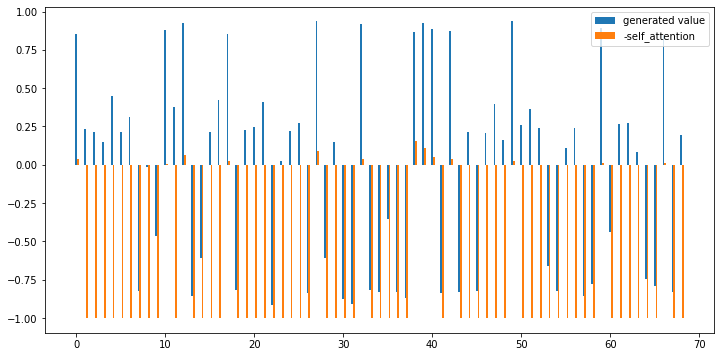

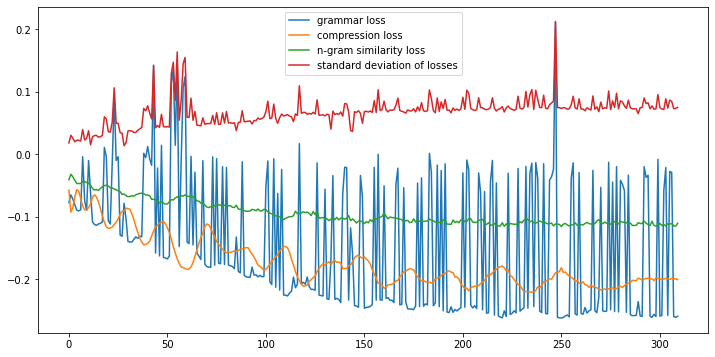

0.7286,0.3818,score:1.9354,[And admitting it will be difficult McNair accept being replaced Van Gaal insisted it was a will serve Northern well and Southampton strikers Shane and Pelle Van Gaal into replacing him prematurely and continued: Of tough McNair) but its his interests.]
0.7507,0.3473,score:2.4678,[And despite admitting it will be difficult McNair accept being replaced Van Gaal insisted it was a which will serve Northern well and Southampton strikers Shane and Pelle Van Gaal into replacing him prematurely and continued: Of tough McNair) but its his interests.]
0.7482,0.3522,score:2.6588,[And despite admitting it will be difficult McNair accept being replaced Van Gaal insisted it was which will serve Northern well and Southampton strikers Shane and Pelle Van Gaal into replacing him prematurely and continued: Of tough McNair) but its his interests.]
0.7419,0.3744,score:2.4316,[And despite admitting it will be difficult McNair accept being replaced Van Gaal insisted it was a whic

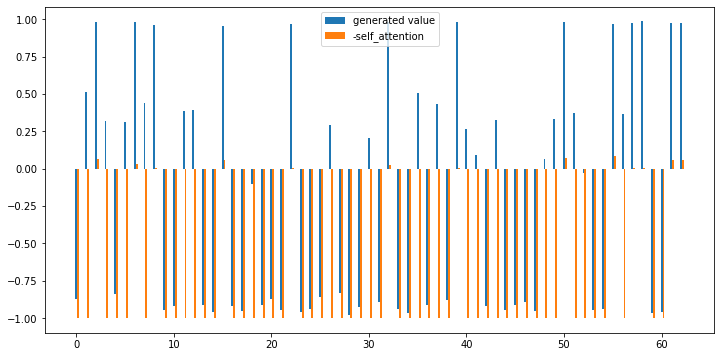

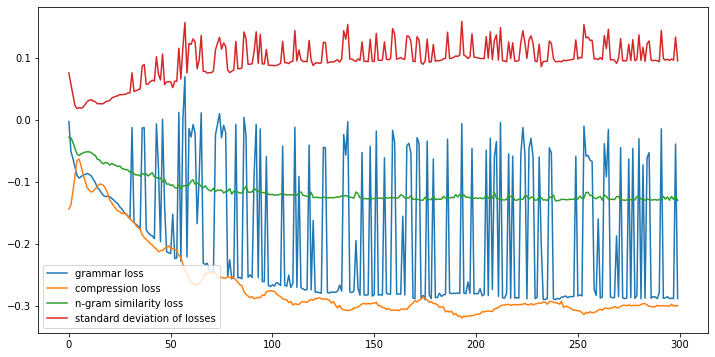

0.6473,0.4849,score:2.1523,[(right) slices the forward off his foot early stages Southampton Jonny to McNair midfielder Herrera Carrick back to the system and United boss Louis admitted he had to against Southampton.]
0.6657,0.4438,score:2.2267,[(right) slices the forward off his foot early stages Southampton Jonny to McNair midfielder Herrera Carrick back to the centre defence system and United boss Louis admitted he had to against Southampton.]
0.6568,0.4849,score:1.9703,[(right) slices the forward off his foot early stages Southampton Jonny to McNair midfielder Herrera back to the centre defence and United boss Louis admitted he had to against Southampton.]
0.6588,0.4658,score:2.2504,[(right) slices the forward off his foot early stages Southampton Jonny to McNair midfielder Herrera Carrick back to the centre system and United boss Louis admitted he had to against Southampton.]
0.5853,0.4959,score:1.2654,[slices the forward off his foot early stages Southampton Jonny to midfielder H

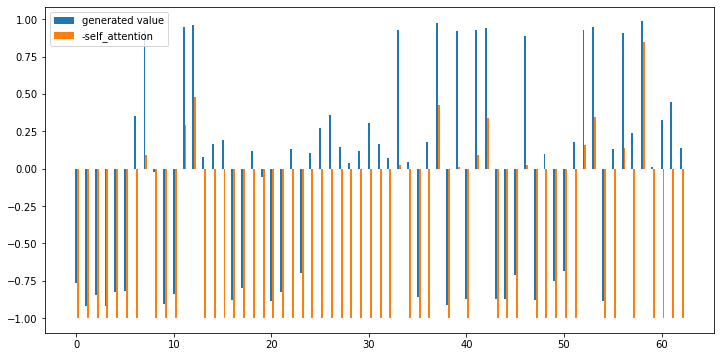

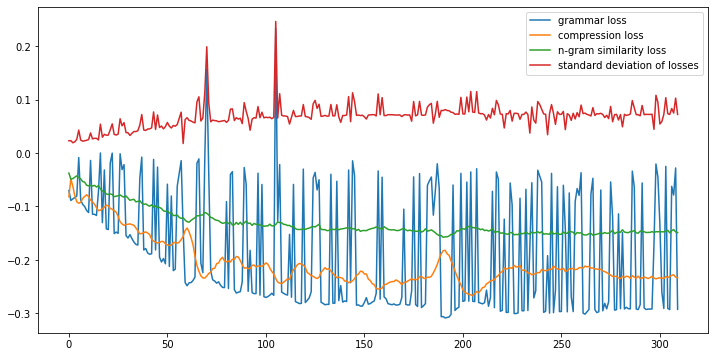

0.8110,0.3034,score:2.5924,[wont be much corporate tax left to reform Congress can this moving forward with a White House proposal to bar corporations that obviously American pretending be foreign corporations arent shifting profits offshore avoid U S taxes is a huge problem.]
0.8034,0.3202,score:2.6004,[wont be much corporate tax left to reform Congress can this moving forward with a White House proposal to bar corporations that obviously American pretending be foreign corporations arent shifting profits offshore U S taxes is a huge problem.]
0.7323,0.4185,score:2.2241,[wont be much corporate tax left to can moving forward with a White House proposal to bar corporations obviously American pretending be foreign corporations profits offshore avoid U S taxes is a huge problem.]
0.8085,0.3146,score:2.7450,[wont be much corporate tax left to reform Congress this moving forward with a White House proposal to bar corporations that obviously American pretending be foreign corporations arent s

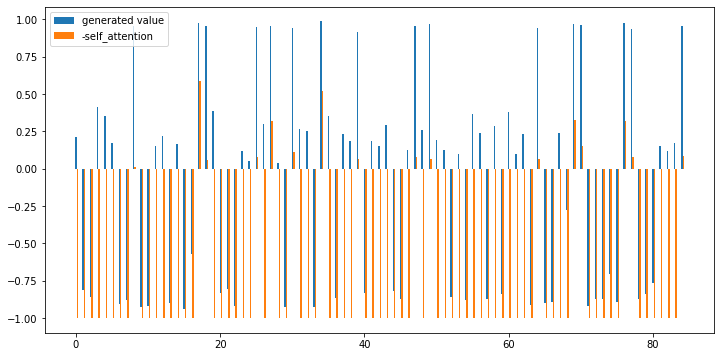

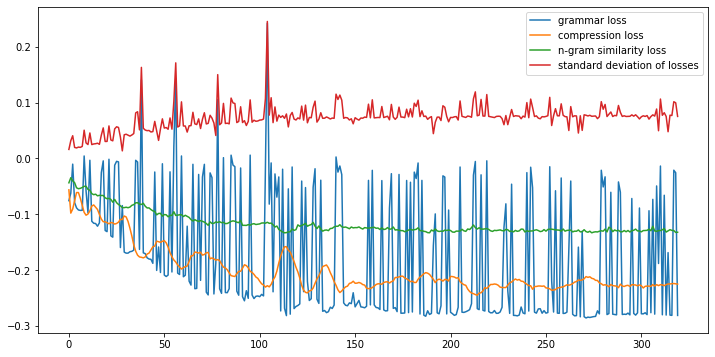

0.7208,0.4320,score:2.7171,[They exist without federal research and infrastructure commerce possible and for companies to earn profits in country that are larger than countrys entire economy proving companies are gimmicks to avoid U S American engage in tricks they can defer U on offshore earnings profits to which may never happen.]
0.7359,0.4153,score:2.5071,[They exist without federal research and in infrastructure commerce possible and for companies to earn profits in country that are larger than countrys entire economy proving companies are gimmicks to avoid U S taxes American engage in tricks they can defer U on offshore earnings profits to which may never happen.]
0.7171,0.4395,score:2.3225,[They exist without federal research and in infrastructure commerce possible and for companies to earn profits in country that are larger than countrys economy proving companies are gimmicks to avoid U S taxes American engage in tricks they can U on offshore earnings profits to which may never

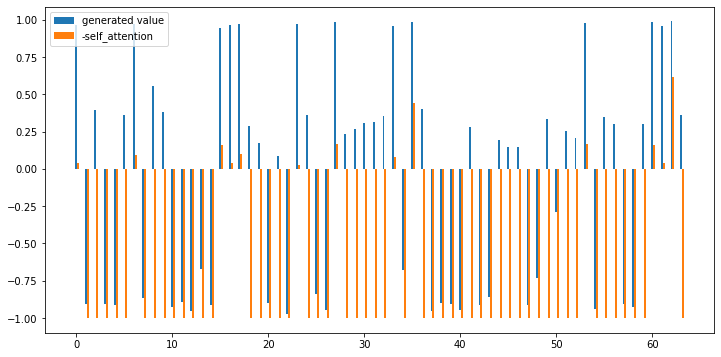

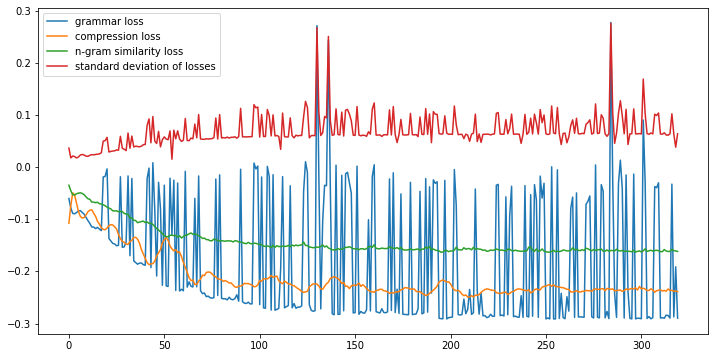

0.7634,0.4278,score:2.4189,[Taxpayers be these companies no qualms U S economic system without their share and corporations have publicly asserted they are moving headquarters but the do business just ploy that corporations to reduce their U S tax bills.]
0.7524,0.4481,score:1.6207,[Taxpayers be these companies no qualms U S economic system their share and corporations have publicly asserted they are moving headquarters but the do business just ploy that corporations to reduce their U S tax bills.]
0.7063,0.4506,score:1.2309,[Taxpayers be these companies no qualms U S economic system their share and corporations have publicly asserted are moving headquarters but the do business and just ploy that corporations to reduce their U S tax bills.]
0.7530,0.4177,score:2.4044,[Taxpayers be these companies no qualms U S economic system without their share and corporations have publicly asserted they are moving headquarters but the do business and just ploy that corporations to reduce their U S t

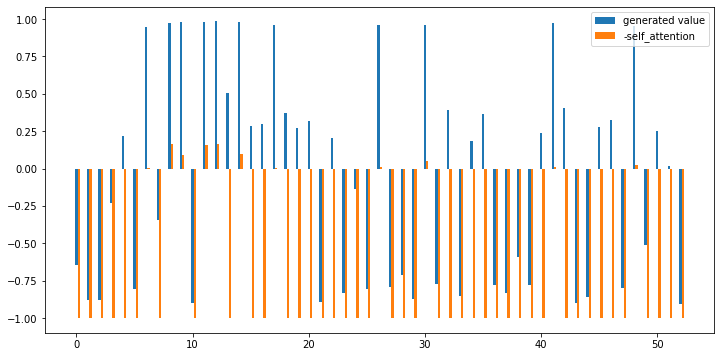

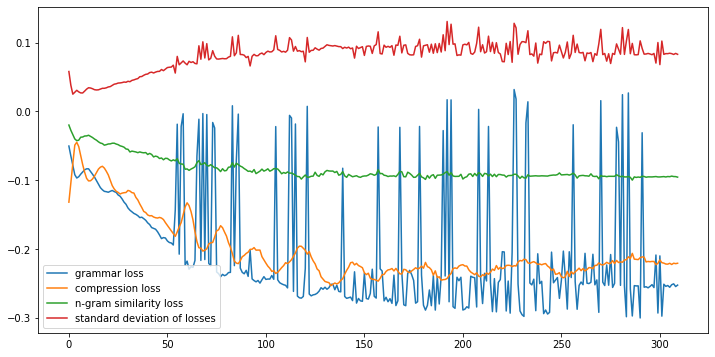

0.6314,0.4514,score:1.8566,[the nine yoga retreat Via Yoga in Mexico is the escape you’ve been waiting and most it travel and unique luxury Columbia’s picturesque Cariboo Valley Ranch Spa offers ultimate]
0.6279,0.4671,score:2.0878,[the nine yoga retreat Via Yoga in Mexico is the escape you’ve been waiting and it travel and unique luxury Columbia’s picturesque Cariboo Valley Ranch Spa offers ultimate]
0.6067,0.4953,score:2.1791,[the nine yoga retreat Via Yoga in Mexico is the escape you’ve been waiting and it travel and unique luxury Columbia’s picturesque Cariboo Valley Ranch Spa offers]
0.6103,0.4796,score:2.0836,[the nine yoga retreat Via Yoga in Mexico is the escape you’ve been waiting and most it travel and unique luxury Columbia’s picturesque Cariboo Valley Ranch Spa offers]
0.5875,0.4984,score:2.1039,[the nine yoga retreat Via Yoga in Mexico is the escape you’ve been waiting and most it travel and unique luxury Columbia’s picturesque Cariboo Valley Spa offers]
0.6086,0.4765,scor

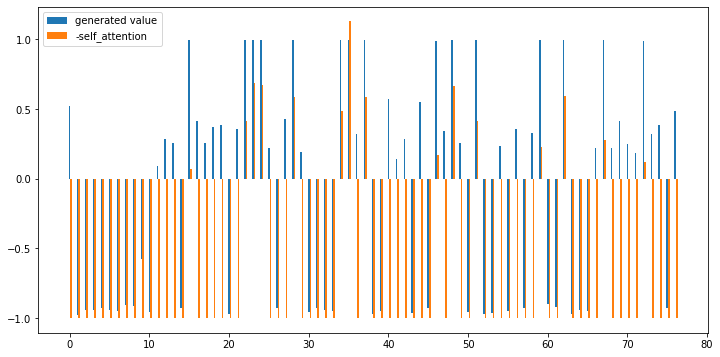

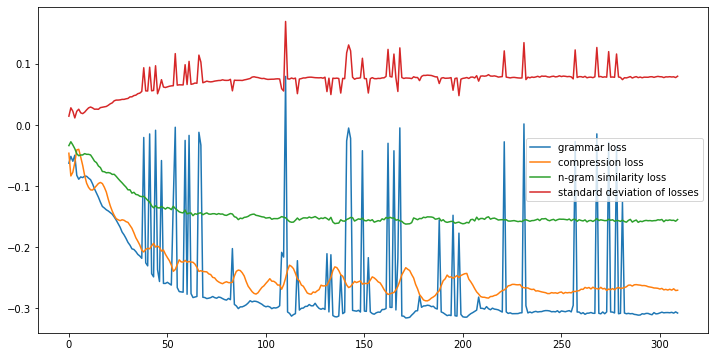

0.7519,0.3941,score:2.5416,[In third of Brits they regret spending too much on their mobile device while on holiday and work emails on holiday to more and people for a digital detox Their reads: you increasingly addicted devices selecting hotels that are offering detox holidays to help de-stress.]
0.7452,0.4077,score:2.4528,[In of Brits they regret spending too much on their mobile device while on holiday and work emails on holiday to more and people for a digital detox Their reads: you increasingly addicted devices selecting hotels that are offering detox holidays to help de-stress.]
0.7453,0.4032,score:2.6246,[In third of Brits they regret spending too much on their mobile device while on holiday and work emails on holiday to more and people for a digital detox Their reads: increasingly addicted devices selecting hotels that are offering detox holidays to help de-stress.]
0.7430,0.4077,score:2.5210,[In third of Brits they regret spending too much on their mobile device while on holid

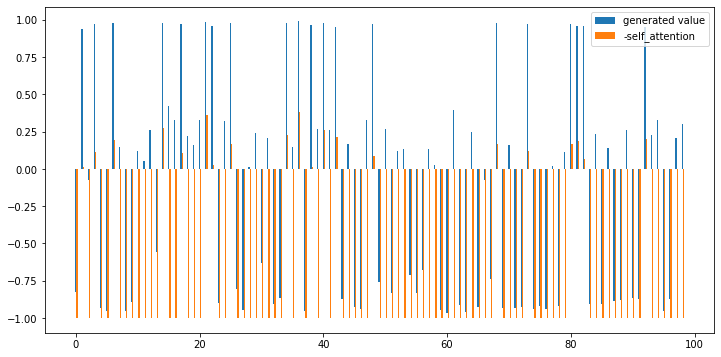

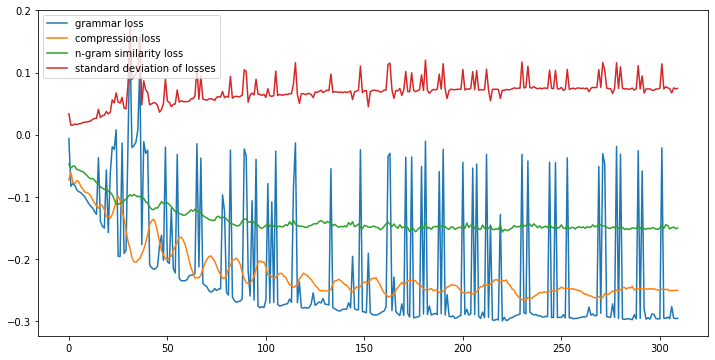

0.7000,0.3925,score:2.3267,[spot in Essex Spa has tech-free policy in grounds to enable you to be at peace with world and have their points leave from work them to check the weather view seems travellers switching off disconnect restoring more all-important balance and website spots free Wi-Fi and phone reception digitaldetoxholidays have five-fold customers in six The Independent.]
0.7050,0.3788,score:2.3598,[spot in Essex Spa has tech-free policy in grounds to enable you to be at peace with world and have their points leave from work them to check the weather view seems travellers benefit switching off disconnect restoring more all-important balance and website spots free Wi-Fi and phone reception digitaldetoxholidays have five-fold customers in six The Independent.]
0.7001,0.3959,score:2.3669,[spot in Essex Spa has tech-free policy in grounds to enable you to be at peace with world and have their points leave from work them to check the weather view seems travellers benefit switchin

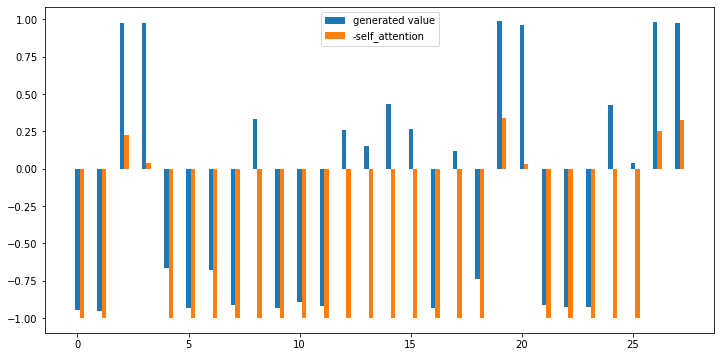

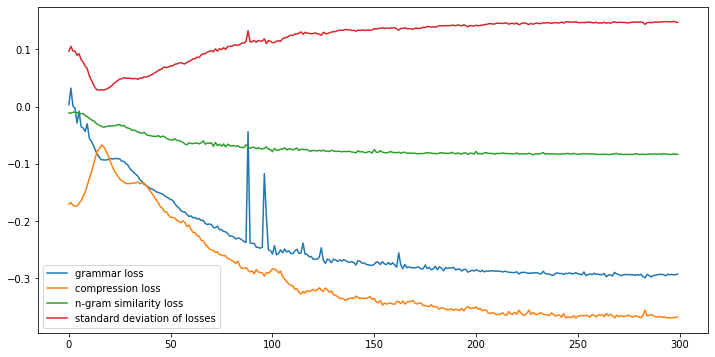

0.5821,0.4926,score:2.6216,[pop star and intended as a skin-lightener as cure for want to buy it.]
0.5836,0.5147,score:2.6645,[pop star and intended as a skin-lightener cure for want to buy it.]
요약률 0.5147 문법성 5.8960 요약 pop star and intended as a skin-lightener cure for want to buy it.
--------------------------------------------------
pop star and intended as a skin-lightener cure for want to buy it. 2.664479432441597 5.8959641456604
--------------------------------------------------
I dont really care. Scroll down for video. The comment comes just a month after Miss Nyongo mentioned Dencia - who has been accused of marketing her own brand of skin-bleaching cream called Whitenicious - in a speech about learning to value the color of her own skin.
--------------------------------------------------
Length ------------------------------------| 50
{0: -1.0, 1: -1.0, 2: -1.0, 3: 0.08639217913150787, 4: -1.0, 5: -1.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: -1.0, 13: -1.

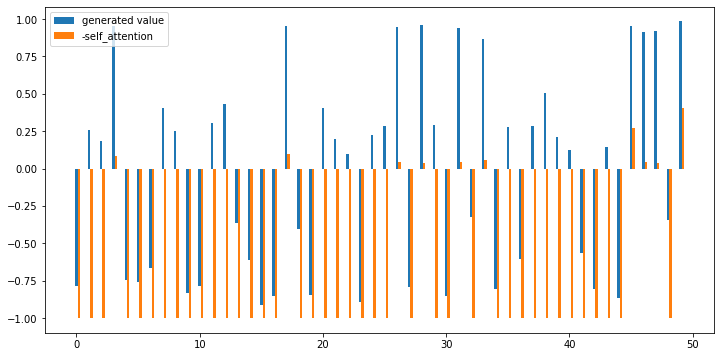

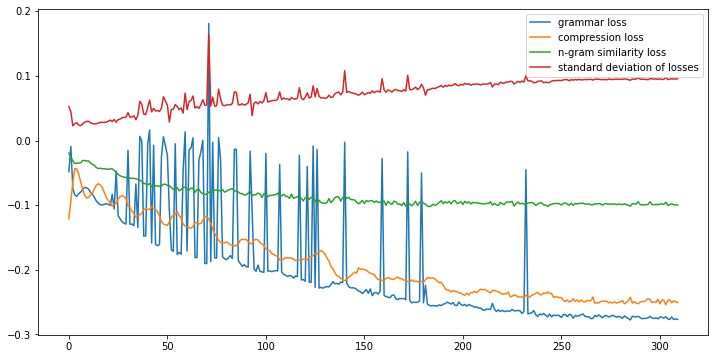

0.6107,0.4757,score:2.4552,[dont care for video comment comes Miss Dencia - who been accused of her own of cream Whitenicious in a speech about value color of her skin.]
0.6372,0.4494,score:2.4643,[dont really care for video comment comes Miss Dencia - who been accused of her own of cream Whitenicious in a speech about value color of her skin.]
0.5955,0.4981,score:2.5659,[dont care for video comment comes Miss Dencia - who been accused of her own of cream Whitenicious in a speech about color of her skin.]
0.6265,0.4719,score:2.5274,[dont really care for comment comes Miss Dencia - who been accused of her own of cream Whitenicious in a speech about value color of her skin.]
0.5807,0.5056,score:2.4848,[dont care for video comment comes Miss Dencia who been accused of her own of cream Whitenicious in a speech about color of her skin.]
0.5839,0.5206,score:2.5946,[dont care for comment comes Miss Dencia - who been accused of her own of cream Whitenicious in a speech about color of her skin.

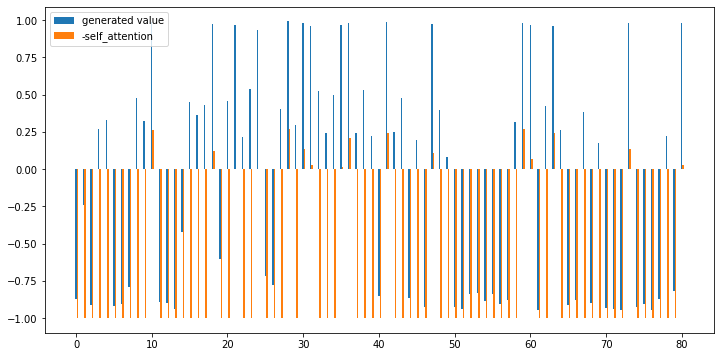

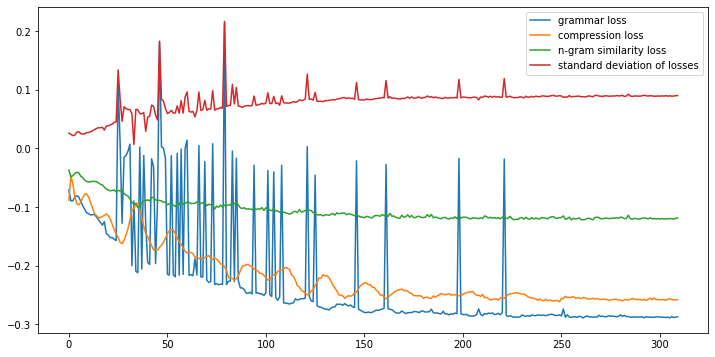

0.7194,0.4390,score:2.8213,[as Dencias a white perusal of the website that it has a number and foundations in darker skin tones and In her response Dencia said of cosmetics company: But sell cream tho [sic] Lancomes Blanc Expert of cosmetics which advertised brighteners production of skin.]
0.6892,0.4411,score:2.3445,[as Dencias is a white perusal of website that it has a number and foundations in darker skin tones and In her response Dencia said of cosmetics company: But sell cream tho [sic] Lancomes Blanc Expert of cosmetics which advertised brighteners production of skin.]
0.7030,0.4711,score:2.8230,[as is a white perusal of the website that it has a number and foundations in darker skin tones and In her response Dencia of cosmetics company: But cream tho [sic] Lancomes Blanc Expert of cosmetics which advertised brighteners production of skin.]
0.7227,0.4325,score:2.8510,[as Dencias is a white perusal of the website that it has a number and foundations in darker skin tones and In he

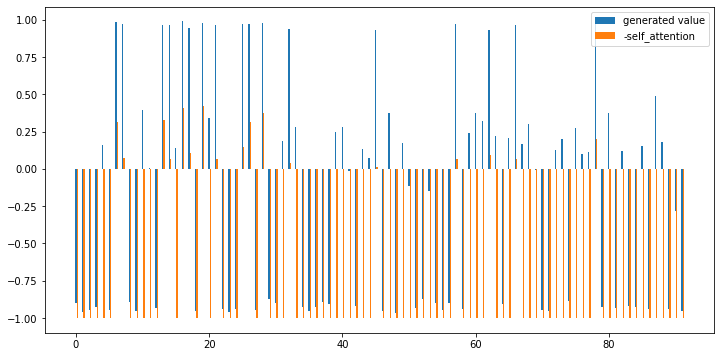

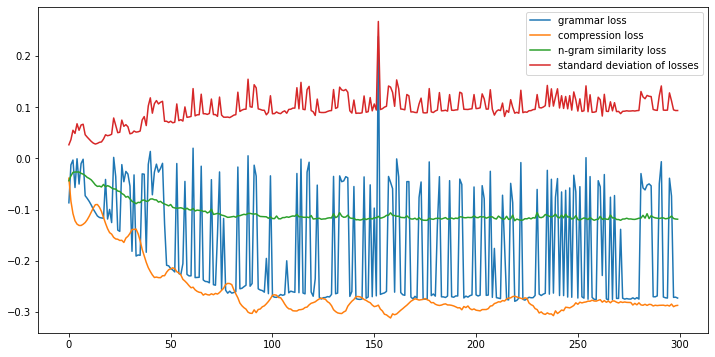

0.6910,0.4430,score:2.5688,[’ Chief Marshal Graydon a head of the RAF and Commodore Andrew Lambert defence chief commanded Iraq called for options in Iraq The ex-military chiefs suggested up Special of fanatics including British Muslims who swept across northern Iraq and said UK Forces on the ground be on to huge damage advancing]
0.6529,0.4871,score:2.3362,[’ Chief Marshal Graydon head of the RAF and Commodore Andrew Lambert defence chief commanded Iraq called for options in Iraq The chiefs suggested up Special to of fanatics including British Muslims who swept across northern Iraq and said UK Forces on the ground on to huge damage]
0.6424,0.4926,score:2.4835,[’ Chief Marshal Graydon a head of the RAF and Commodore Andrew Lambert defence chief commanded called for options in Iraq The ex-military chiefs suggested up to of fanatics including British Muslims who swept across northern Iraq and said UK on the ground be on to huge damage]
0.6918,0.4375,score:2.4816,[’ Chief Marshal Graydon 

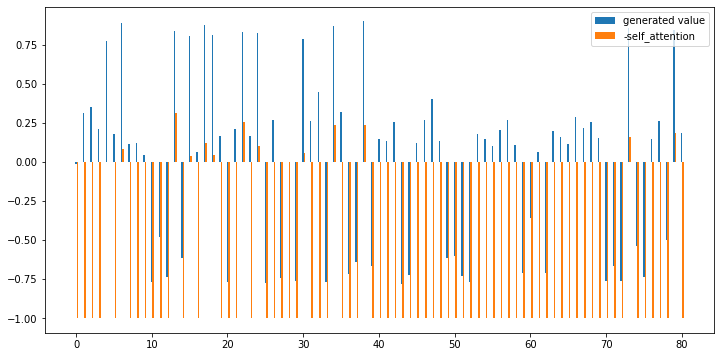

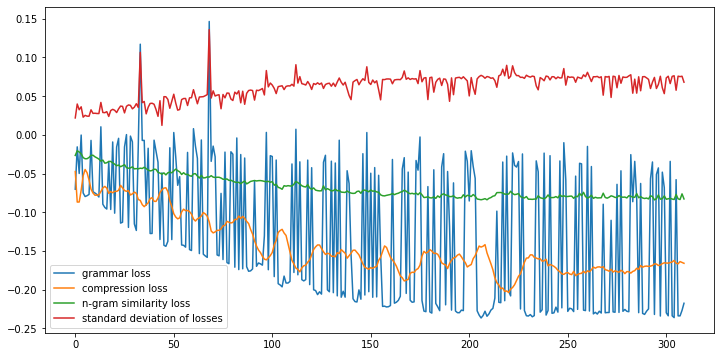

0.7742,0.2973,score:2.4083,[It is not about jihad or religion is all adventure Mohammed Shafiq chief executive of Ramadhan Foundation said Britain be risk terror attacks if fighters are return ‘The jihadists have hands on artillery and Iraqi army which has given them advantage ‘We condemn unreservedly their psychopathic violence whether minorities or on Muslims ’.]
0.7718,0.3098,score:2.2688,[It is not about jihad or religion it is all adventure Mohammed Shafiq chief executive of Ramadhan Foundation said Britain be risk terror attacks if fighters are return ‘The jihadists have hands on artillery and Iraqi army which has given them advantage ‘We condemn unreservedly their psychopathic whether minorities or on Muslims ’.]
0.7753,0.3035,score:2.3726,[It is not about jihad or religion it is all adventure Mohammed Shafiq chief executive of Ramadhan Foundation said Britain be risk terror attacks if fighters are return ‘The jihadists have hands on artillery and Iraqi army has given them advan

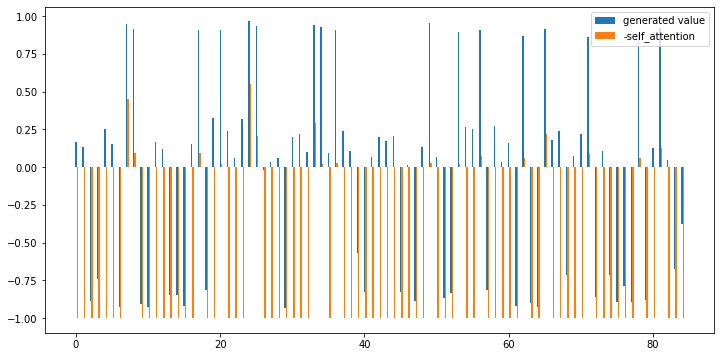

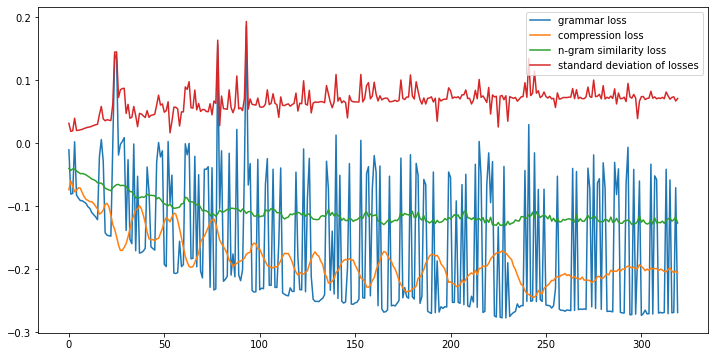

0.7620,0.3978,score:2.5844,[But critics compared the appeals via and YouTube thousands-strong marches to protest Israel’s military action against Gaza or the publication a  cartoon of Mohammed in a Danish magazine and the West must brace atrocities before in Iraq  are defeated top brass night commanders issued the warning as they David RAF fight Islamic]
0.7754,0.3720,score:2.8287,[But critics compared the appeals via and YouTube thousands-strong marches to protest Israel’s military action against Gaza or the publication a  cartoon of Mohammed in a Danish magazine and the West must brace for bloody atrocities before in Iraq  are defeated top brass night commanders issued the warning as they David RAF to fight Islamic]
0.7687,0.3775,score:2.7711,[But critics compared the appeals via and YouTube thousands-strong marches to protest Israel’s military action against Gaza or the publication a  cartoon of Mohammed in a Danish magazine and the West must brace for bloody atrocities before in Ir

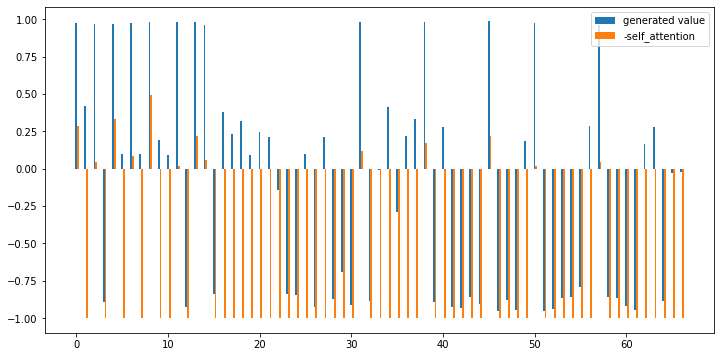

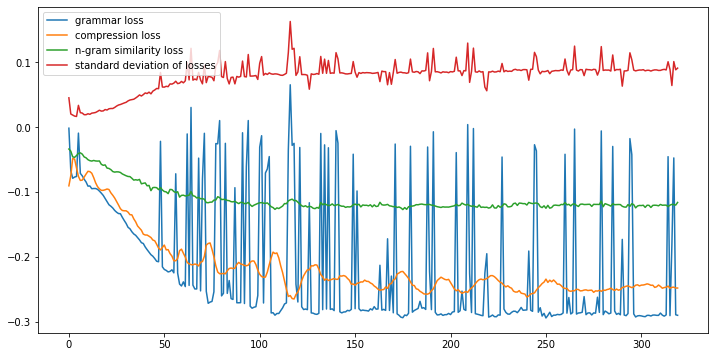

0.7033,0.4262,score:2.0207,[During the assault victim apparently suffered a cardiac event which resulted her death John L Molinelli said in a statement County autopsy Rojas-Jovels body results were pending tests Martinez charged with simple assault county jail $75000 bail.]
0.7115,0.4028,score:2.2764,[During the assault victim apparently suffered a cardiac event which resulted her death John L Molinelli said in a statement County Examiners autopsy Rojas-Jovels body results were pending tests Martinez charged with simple assault county jail $75000 bail.]
0.6778,0.4473,score:1.0360,[During the assault victim apparently suffered a cardiac resulted her death John L Molinelli said in a statement County Examiners autopsy Rojas-Jovels body results were pending tests Martinez charged with simple assault county jail bail.]
0.7244,0.3934,score:2.4087,[During the assault victim apparently suffered a cardiac event which resulted her death John L Molinelli said in a statement and County Examiners a

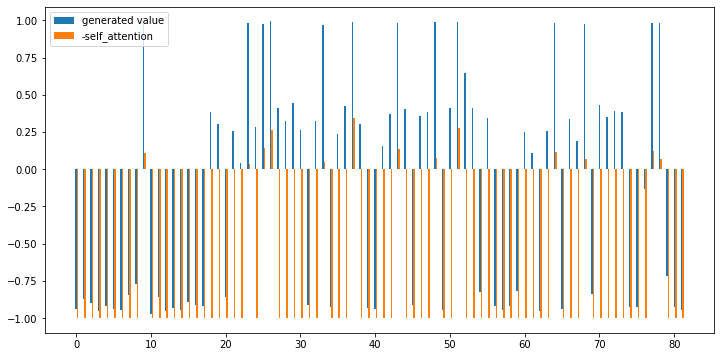

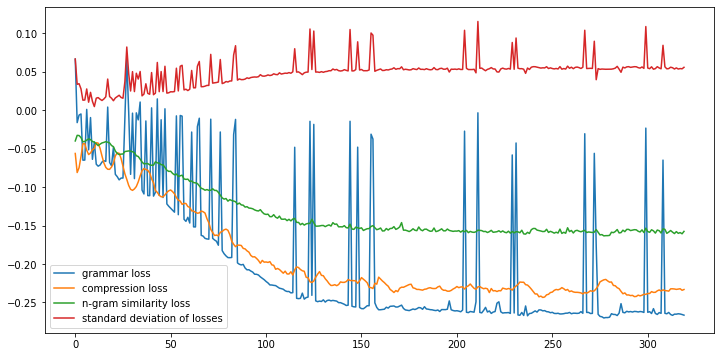

0.7784,0.4177,score:2.7358,[victim appeared to been involved in a domestic assault the prosecutor said and seven-year-old child witnessed the fight according prosecutor but he did reveal the relationship the adults and the and 911 call the apartment after 4am on and when they arrived Rojas-Jovel dead on]
0.7664,0.4430,score:2.8439,[victim appeared to been involved in a domestic assault the prosecutor said and seven-year-old child witnessed the fight according prosecutor but he did reveal the relationship the adults and the and 911 call the apartment after 4am on and when they arrived dead on]
0.7700,0.4346,score:2.6445,[victim appeared to been involved in a domestic assault the prosecutor said and seven-year-old child witnessed the fight according prosecutor but he did reveal the relationship the adults and the and 911 call the apartment after 4am on and when they Rojas-Jovel dead on]
0.7713,0.4219,score:2.6699,[victim appeared to been involved in domestic assault the prosecutor said a

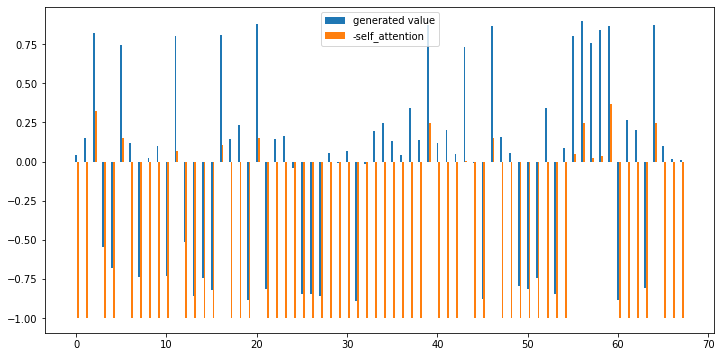

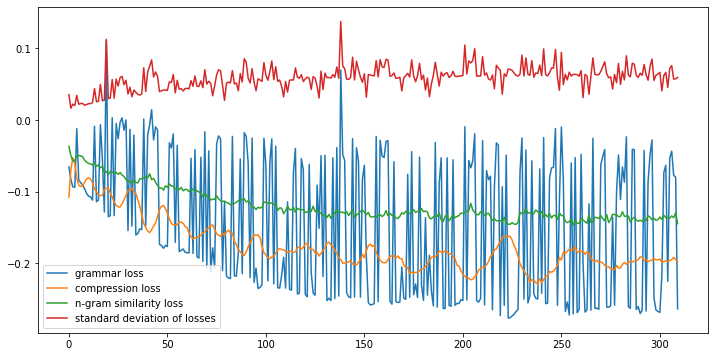

0.7359,0.4455,score:1.4741,[In their booking Hernandez Rojas scratches necks Hernandez also hid not detail what was - which investigators recovered in a search at the crime scene Hernandez Soriano was welfare of a child domestic violence and apprehension according to]
0.8221,0.2970,score:2.5521,[In their booking Hernandez Soriano Martinez Rojas scratches necks and Molinelli Hernandez hid evidence detail what was - investigators later recovered in a search at the crime scene Hernandez Soriano was endangering welfare of a child domestic violence assault and apprehension according to authorities.]
0.6853,0.4919,score:1.0173,[their booking Hernandez Martinez scratches necks Hernandez hid evidence what was - which investigators recovered a search the crime Hernandez Soriano was endangering welfare of a child domestic violence and apprehension]
0.7667,0.3573,score:1.2564,[their booking Hernandez Soriano Martinez scratches necks and Molinelli Hernandez also hid evidence detail what was - inve

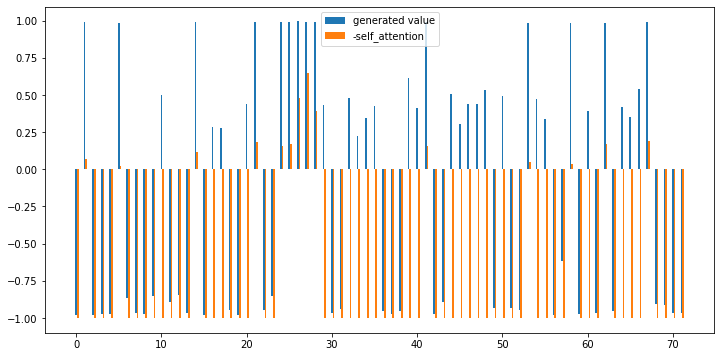

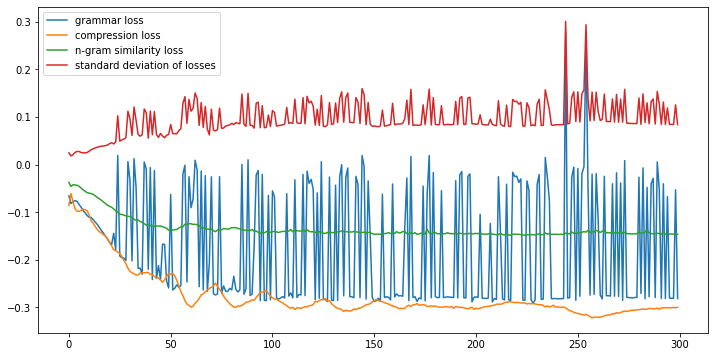

0.6096,0.5151,score:0.9740,[attack Syrian a unrest when President cracked down on peaceful protesters and it has evolved into that has killed 100000 and than million refugees according Cross But Lebanese puts the total at]
0.6902,0.4372,score:2.1186,[attack Syrian a unrest started in when President cracked down on peaceful protesters and it has evolved into that has killed 100000 and transformed more than million refugees according to Cross But Lebanese puts the total at]
0.5916,0.5151,score:0.8519,[attack Syrian a unrest started in when President cracked down on peaceful protesters and it has evolved into has killed 100000 and transformed than million refugees to Cross But Lebanese the at]
0.6797,0.4472,score:1.6622,[attack Syrian a unrest started in when President cracked down on peaceful protesters and it has evolved into that killed 100000 and transformed more than million refugees according to Cross But Lebanese puts the total at]
0.6797,0.4472,score:1.6353,[attack Syrian a unrest

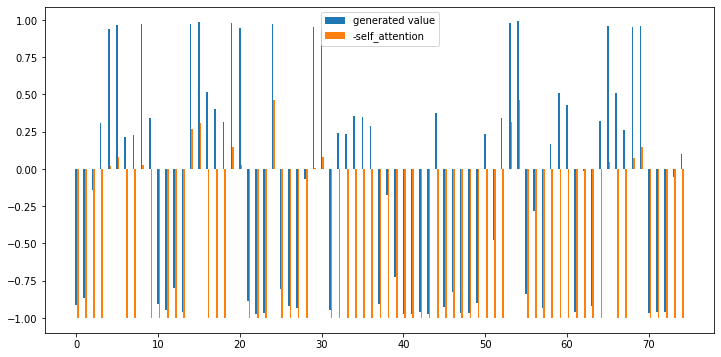

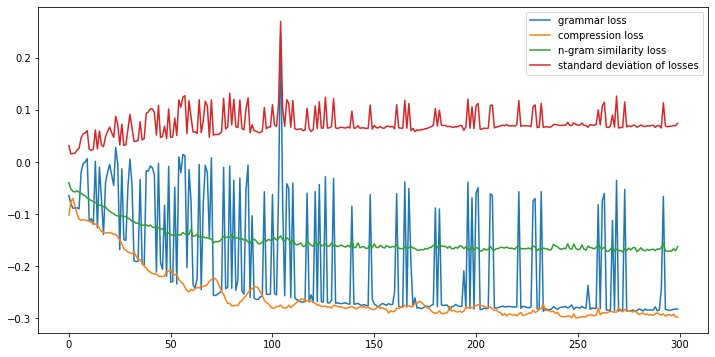

0.7803,0.4269,score:2.9617,[Syrians have fled to neighboring Lebanon a million people according to a U N strike Syrian refugee camp near the Syrian border between the Agency and Saturdays strike not first by the government has accused rebels of smuggling arms the border.]
0.7802,0.4434,score:2.9913,[Syrians have fled neighboring Lebanon a million people according to a U N strike Syrian refugee camp near the Syrian border between the Agency and Saturdays strike first by the government has accused rebels of smuggling arms the border.]
0.7704,0.4599,score:2.9136,[Syrians have fled to neighboring Lebanon a million people according to a U N strike Syrian refugee camp near the Syrian border between the Agency Saturdays strike by the government has accused rebels of smuggling arms the border.]
0.7830,0.4363,score:3.0049,[Syrians have fled to neighboring Lebanon a million people according to a U N strike Syrian refugee camp near the Syrian border between the Agency and Saturdays strike first b

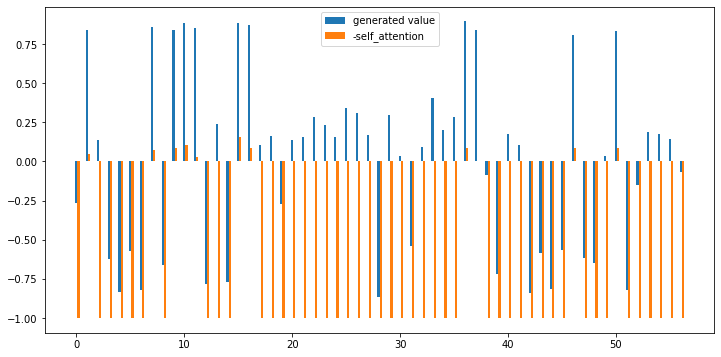

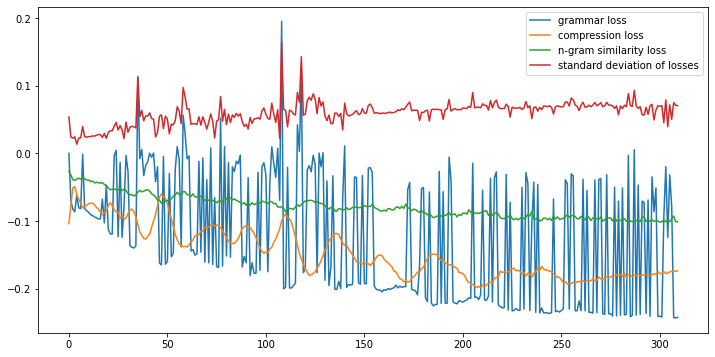

0.7020,0.3887,score:2.5427,[Nick Paton from and Tom Watkins it Atlanta and Beirut (CNN) Syria carried out an airstrike on a refugee in northern Saturday killing nine Syrians and wounding a and Alkhshali and contributed to this report.]
0.4356,0.6855,score:0.5731,[Nick from and Tom Watkins it Atlanta and Beirut (CNN) Syria an airstrike a and wounding a Lebanese and and]
0.7284,0.3620,score:2.6453,[Nick Paton from and Tom Watkins it Atlanta and Beirut (CNN) Syria carried out an airstrike on a refugee in northern Saturday killing nine Syrians and wounding a Lebanese and Alkhshali and contributed to this report.]
0.6956,0.4095,score:1.4631,[Nick Paton from and Tom Watkins it Atlanta and Beirut (CNN) carried out an on a refugee in northern Saturday killing nine Syrians and wounding a Lebanese and Alkhshali and contributed to this report.]
0.7233,0.3828,score:2.4502,[CNNs Nick from and Tom Watkins it Atlanta and Beirut Syria carried out an airstrike on a refugee in northern Saturday killing 

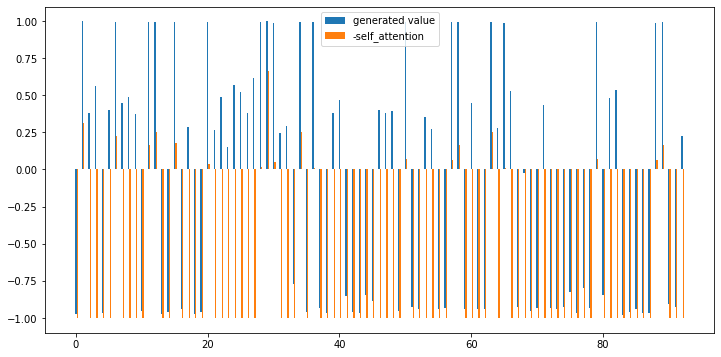

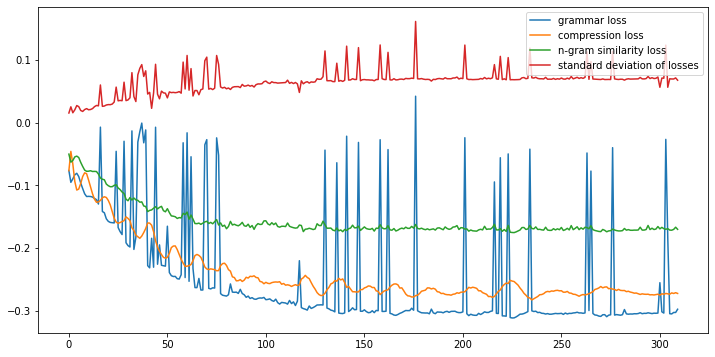

0.7511,0.4268,score:2.4859,[letter also noted the Russian Government was refusing recognise Mr nationality in limits the ability of the Australian Government to provide consular assistance and Evgeny Mr brother lives in the minimum 15 sentence and expressed his brothers and Mr Shilovs brother who lives told sentence a worrying his brothers detainment.]
0.7457,0.4321,score:2.2308,[letter also noted the Russian Government was refusing recognise Mr nationality in limits the ability of the Australian Government provide consular assistance and Evgeny Mr brother lives in the minimum 15 sentence and expressed his brothers and Mr Shilovs brother who lives told sentence a worrying his brothers detainment.]
0.7488,0.4374,score:2.5735,[letter also noted the Russian Government was refusing recognise Mr nationality in limits the ability of the Australian Government to provide consular assistance and Evgeny Mr brother lives in the minimum 15 sentence and expressed his brothers and Mr Shilovs brother

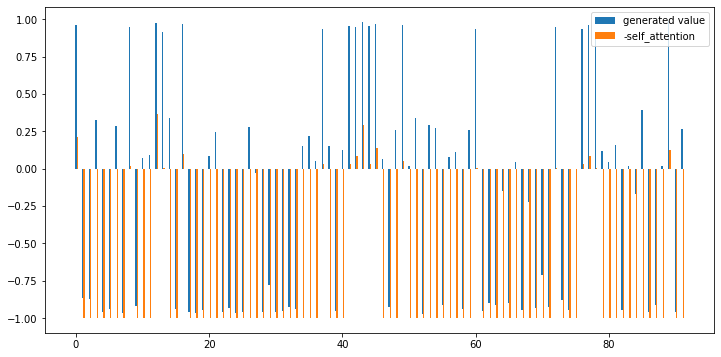

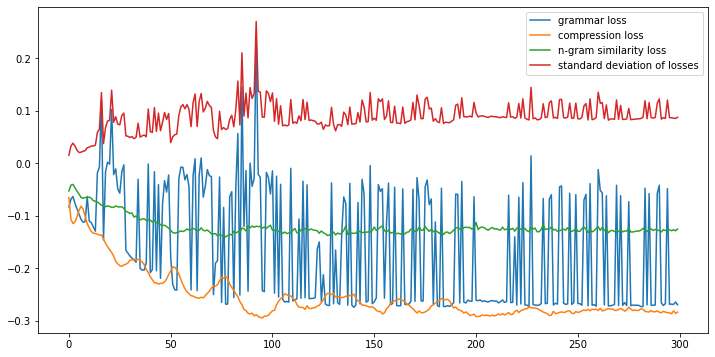

0.6327,0.5301,score:2.3391,[Roman baby live detained by Russian on trafficking in the ABC and three years before his arrest assist his father with his spice trade supplied up to cent the seed market laid and his father by Russias Federal Drug is the 47 tonnes narcotics.]
0.6800,0.4485,score:1.6604,[Roman wife baby live Brisbane was detained by Russian on trafficking in the ABC and three years before his arrest assist his father with his spice which supplied up to per the countrys market the reported laid and his father by Russias Federal Drug Service is the 47 tonnes narcotics.]
0.5943,0.6136,score:1.3488,[Roman wife baby live was detained by Russian on the ABC and three years his assist his father with his spice trade which supplied to per cent the seed market the laid his father by Drug the 47 tonnes]
0.6830,0.4544,score:2.3832,[Roman wife live Brisbane was detained by Russian on trafficking in the ABC and three years before his arrest assist his father with his spice trade which sup

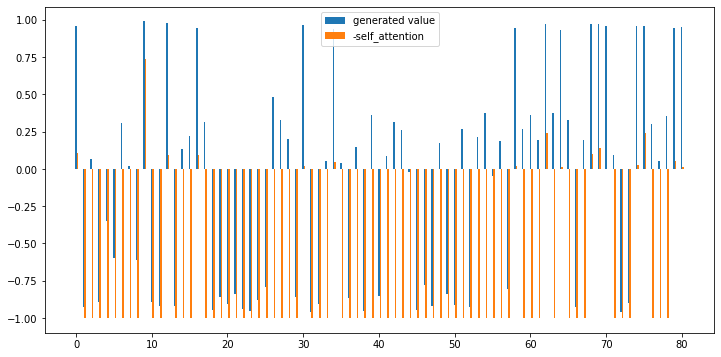

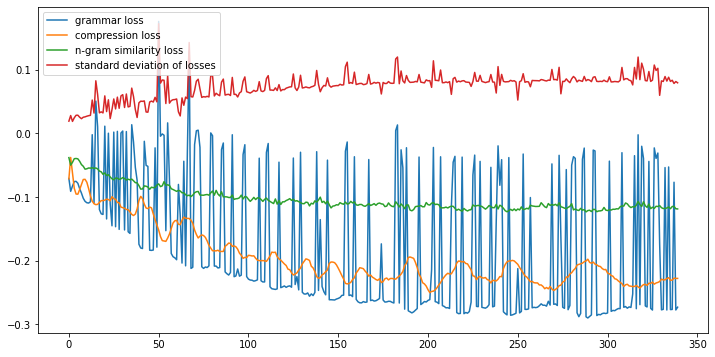

0.7522,0.3879,score:2.4433,[Consular are communication with mans his advisers about his case made up entirely poppy the Service had only 001 percent of it Regrettably authorities have not accepted advice and remain committed to having Mr Shilov in detention Ms Bishop wrote letter to the Shilov familys local MP.]
0.7233,0.4052,score:1.4608,[Consular are communication with mans his about his case made up entirely poppy the Service had admitted only 001 percent of as Regrettably authorities have not accepted advice and remain committed to having Mr Shilov in detention Ms Bishop wrote letter to the Shilov local MP.]
0.6843,0.4892,score:1.2368,[Consular are mans his about his case made up entirely poppy the Service had admitted only percent of Regrettably authorities have accepted advice and remain committed to having Mr Shilov in detention Ms Bishop letter to familys local MP.]
0.7580,0.3621,score:2.6487,[Consular are communication with mans his advisers about his case made up entirely pop

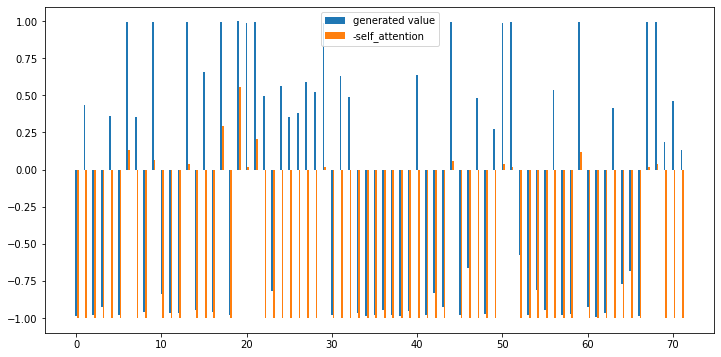

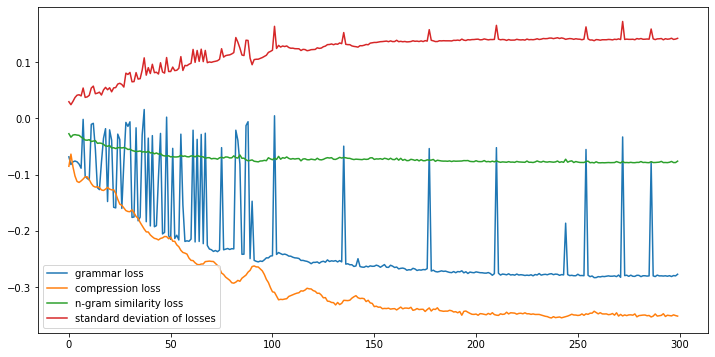

0.6040,0.4624,score:2.6494,[Romeu from Spanish League Chelsea loaned to Bundesliga Stuttgart and Valencia want defensive-minded midfielder to step in and search for talks over transfer Alberto Moreno and Kaboul Tottenham outlay and Mateo Musacchio from Villarreal.]
0.5851,0.4852,score:2.5887,[Romeu from Spanish League Chelsea loaned to Bundesliga Stuttgart and Valencia want defensive-minded midfielder to step in and search for talks over transfer Alberto Moreno and Kaboul Tottenham outlay and Mateo from Villarreal.]
0.5757,0.4852,score:2.4753,[Romeu from Spanish League Chelsea loaned to Bundesliga Stuttgart and Valencia want defensive-minded midfielder step in and search for talks over transfer Alberto Moreno and Kaboul Tottenham and Mateo Musacchio from Villarreal.]
0.5928,0.4784,score:2.6437,[Romeu from Spanish League Chelsea loaned to Bundesliga Stuttgart and Valencia want defensive-minded midfielder to step in and search for talks over transfer Alberto Moreno and Kaboul Tottenham a

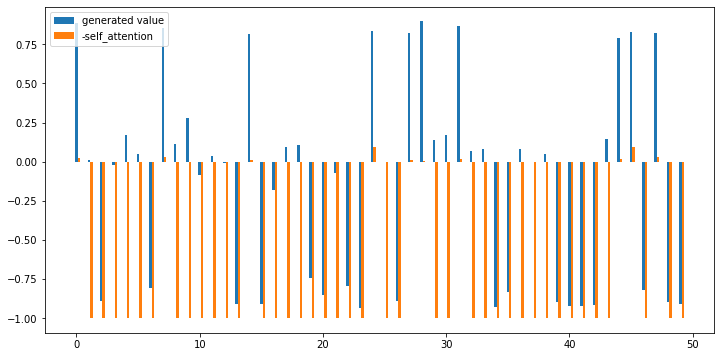

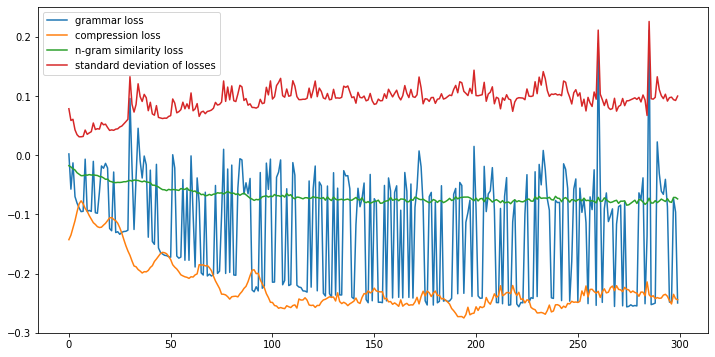

0.6416,0.4444,score:2.1876,[Sunderland are the front runners for deal with Jack Rodwell Valencia eager to take on Sevilla about Sporting Lisbons 26-year-old Jefferson as replacement to pay Spurs for]
0.7227,0.3497,score:2.5581,[Sunderland are the front runners for a deal with Jack Rodwell Valencia eager to take on Sevilla have about Sporting Lisbons 26-year-old Jefferson Nascimento as short term replacement to pay Spurs for]
0.5344,0.5915,score:0.7677,[Sunderland are runners for a Valencia take on Sevilla have about Sporting Lisbons Jefferson Nascimento as short pay Spurs for]
0.6868,0.3922,score:2.3990,[Sunderland are the front runners for a with Jack Valencia eager to take on Sevilla have about Sporting Lisbons 26-year-old Jefferson Nascimento as short term replacement to pay Spurs for]
0.6934,0.3824,score:1.8053,[Sunderland are the front runners for a deal with Rodwell Valencia eager to on Sevilla have about Sporting Lisbons 26-year-old Jefferson Nascimento as short term replacement

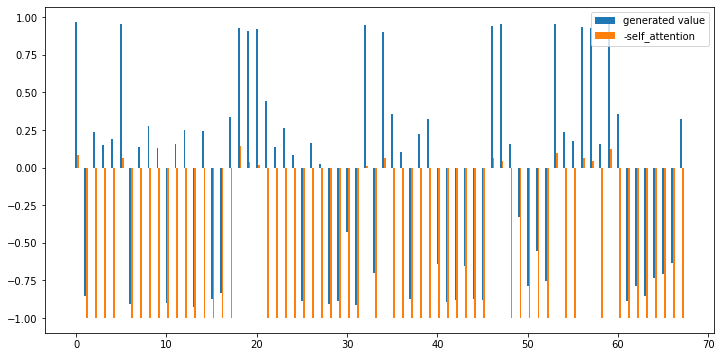

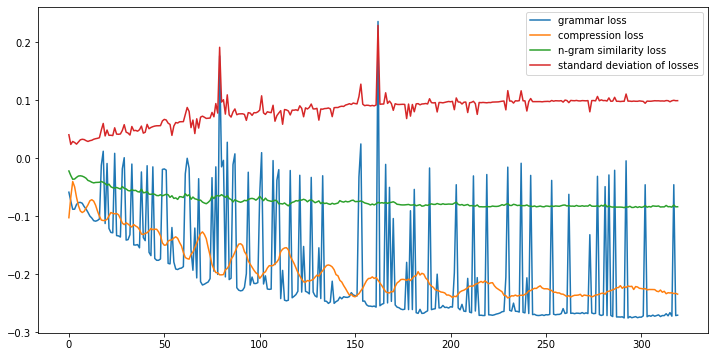

0.7193,0.3704,score:2.4785,[Valencia hope to give him season in La where he continue and Newcastle will sign Jamaal Lascelles and Karl from Nottingham loan pair back and 30-year-old defender his country Star Belgrade has been training at Hillsborough and friendlies.]
0.7199,0.3677,score:2.3386,[Valencia hope to give him season in where he continue and Newcastle will sign Jamaal Lascelles and Karl from Nottingham loan pair back and 30-year-old defender his country and Star Belgrade has been training at Hillsborough and friendlies.]
0.7074,0.3836,score:2.4183,[Valencia hope to give him season in La where he continue and Newcastle will sign Jamaal Lascelles and Karl from Nottingham loan pair back and 30-year-old defender his country and Star has been training at Hillsborough and friendlies.]
0.7274,0.3598,score:2.4263,[Valencia hope to give him season in La where he continue and Newcastle will sign Jamaal Lascelles and Karl from Nottingham loan pair back and 30-year-old defender his count

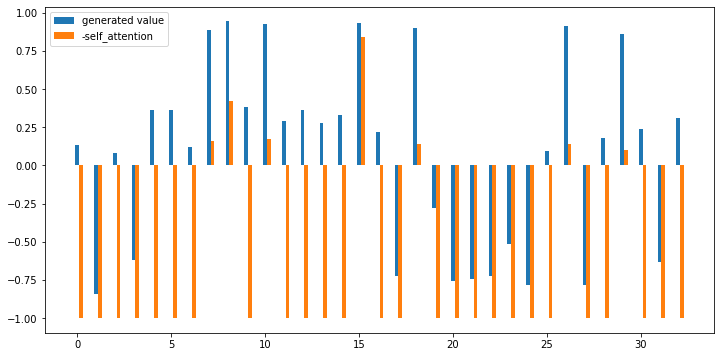

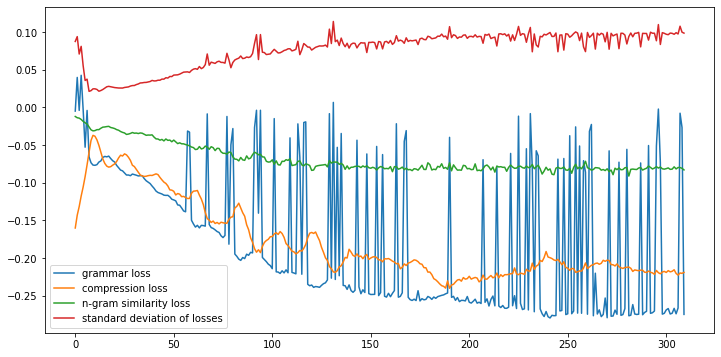

0.6849,0.3580,score:2.4452,[These to from an email address based in Russia and £35000 to stop it and messages to his unless he handed £35000.]
0.6802,0.4205,score:1.5146,[These to from an email address based in Russia £35000 to stop it and messages to his he handed £35000.]
0.6531,0.3750,score:1.9657,[These to from an email address based in Russia and £35000 stop it and messages to his unless he handed £35000.]
0.6743,0.3977,score:2.4678,[These to from an email address based in Russia and to stop it and messages to his unless he handed £35000.]
0.6412,0.4148,score:2.2251,[These to from an email address based in Russia and stop it and messages to his unless he handed £35000.]
0.6068,0.4318,score:0.6787,[These to from an email address based Russia and £35000 stop it and messages to his he handed £35000.]
0.6505,0.3920,score:2.3180,[These to from an address based in Russia and £35000 to stop it and messages to his unless he handed £35000.]
0.6563,0.4091,score:1.9274,[These to from an emai

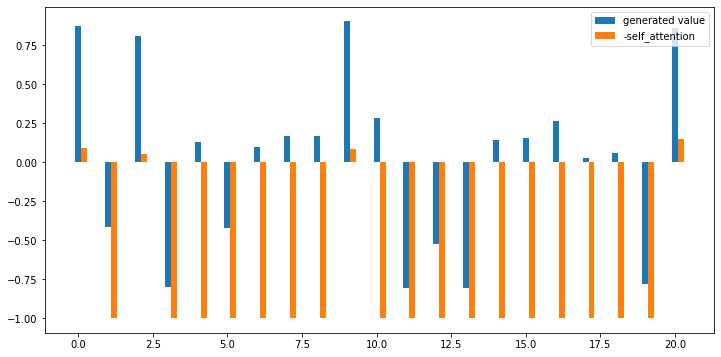

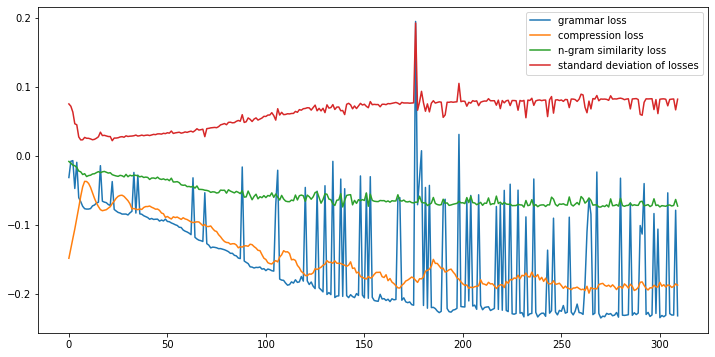

0.6473,0.3419,score:2.5252,[Mr threats met mixed reaction from Twitter users Hollie Bannatyne and us pay.]
0.5984,0.4103,score:1.1884,[Mr threats met mixed reaction Twitter users Hollie Bannatyne and pay.]
0.5551,0.4957,score:1.8911,[Mr threats met from Twitter users Hollie Bannatyne and pay.]
0.6354,0.3590,score:2.2468,[Mr threats met mixed reaction from Twitter users Bannatyne and Contact pay.]
0.5206,0.4530,score:2.0676,[Mr threats met mixed reaction from Twitter users Hollie and pay.]
0.4951,0.5385,score:1.0891,[Mr threats met reaction from Twitter users Hollie pay.]
0.3884,0.6752,score:0.8631,[Mr threats met from Twitter users pay.]
0.4917,0.4872,score:1.9385,[Mr threats met mixed reaction from Twitter users and us pay.]
0.4228,0.6154,score:0.8918,[Mr threats met from Twitter users Hollie pay.]
0.6930,0.2735,score:2.3216,[Mr threats met mixed reaction from Twitter users Hollie Bannatyne and Contact us pay.]
0.3589,0.6239,score:0.5525,[Mr threats met Twitter users Hollie and pay.]


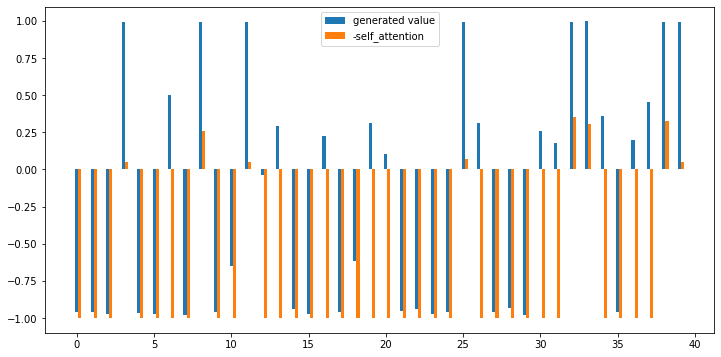

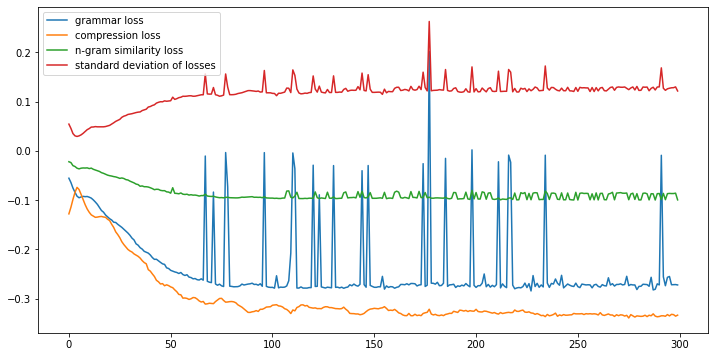

0.5478,0.5112,score:1.9154,[Im a investment us and Although was Mr Bannatyne OK £30000 leading to his arrest and should have expected us.]
0.5099,0.5561,score:1.8391,[Im a investment us and Although was Mr OK £30000 leading to his arrest and should have expected us.]
0.5834,0.4753,score:2.0188,[Im a investment us and Although was deleted Mr Bannatyne OK £30000 leading to his arrest and should have expected us.]
0.5560,0.5291,score:1.9137,[Im a investment us Although was Mr Bannatyne OK £30000 leading to his arrest and should have expected us.]
0.4711,0.5919,score:1.0304,[Im a investment us and Although was Mr OK £30000 to his arrest and should have expected us.]
0.5073,0.5740,score:2.1215,[Im a investment us and Although Mr OK £30000 leading to his arrest and should have expected us.]
0.5113,0.5471,score:1.1575,[Im a investment us and Although was Mr Bannatyne OK £30000 to his arrest and should have expected us.]
0.4752,0.5874,score:1.4840,[Im a investment us and Although was Mr OK lea

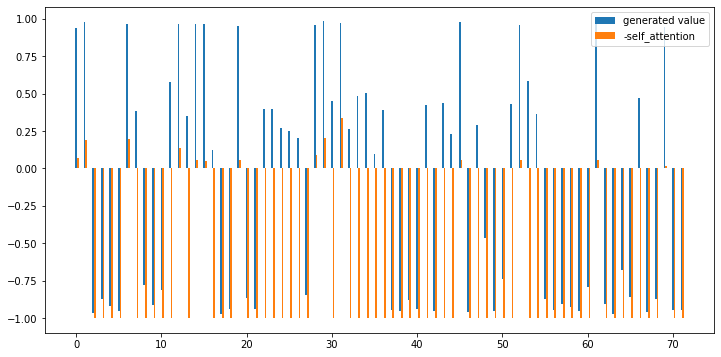

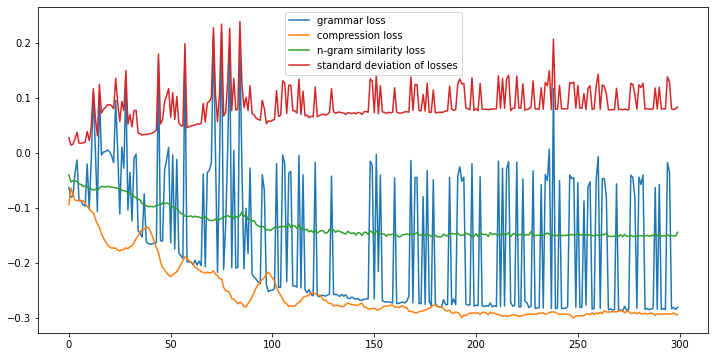

0.6720,0.5345,score:2.3715,[Cheaper farmland centres are Amish colonies in The Empire State out shows and New York has land prices in rural areas than Pennsylvania and Ohio for half of the S In the 1980s and the it Mr]
0.5402,0.6355,score:0.7646,[Cheaper farmland centres Amish colonies in The Empire State out shows and York has land prices rural than Ohio for half the S In the 1980s the it Mr]
0.6680,0.5517,score:2.4778,[Cheaper farmland centres are Amish colonies in The Empire State out shows and York has land prices in rural areas than Pennsylvania and Ohio for half of the S In the 1980s and the Mr]
0.6510,0.5468,score:2.2409,[Cheaper farmland centres are Amish colonies in The Empire State out shows and New York has land prices in rural areas Pennsylvania and Ohio for half of the S In the 1980s and the it Mr]
0.6609,0.5493,score:2.2792,[Cheaper farmland centres are Amish colonies in The Empire out shows and New York has land prices in rural areas than Pennsylvania and Ohio for half o

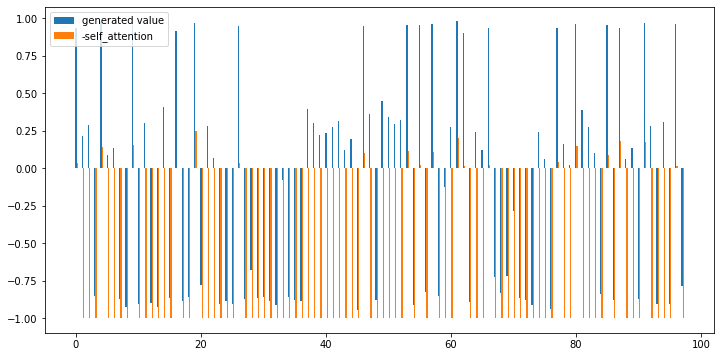

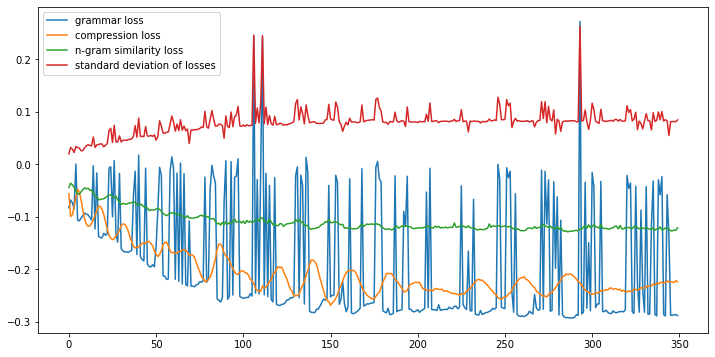

0.6919,0.4247,score:2.4749,[Mr Kraybill said farmland in Lancaster costs $15000 a challenge young along with buying Amish from Ohio or Pennsylvania have set up 10 settlements in York since 2010 - growth doubles states While their Christian beliefs practices can vary to were defined for study purposes as people use transportation and speak dialect of German Swiss]
0.7064,0.4229,score:2.3046,[Mr Kraybill said farmland in Lancaster costs $15000 a challenge young with buying Amish from Ohio or Pennsylvania have set up 10 settlements in York since 2010 - growth doubles states While their Christian beliefs practices can vary to church were defined for study purposes as people use transportation and speak dialect of German Swiss]
0.7232,0.4178,score:2.5881,[Mr Kraybill said farmland in Lancaster costs a challenge young along with buying Amish from Ohio or Pennsylvania have set up 10 settlements in York since 2010 - growth doubles states While their Christian beliefs practices can vary settlem

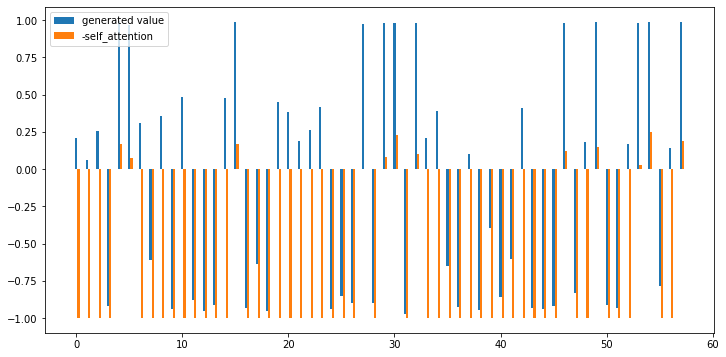

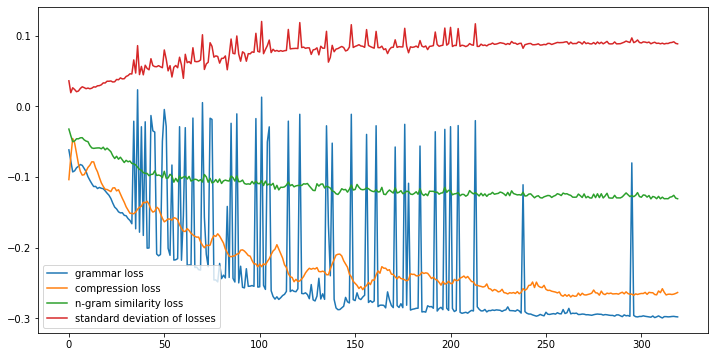

0.5890,0.5362,score:2.0920,[Amish are in 28 U states more up in the last few years and to from Switzerland Germany about 300 and Kraybill study the movement by productive underpriced land.]
0.6541,0.5043,score:2.3468,[Amish communities are in 28 U states more up in the last years to from Switzerland Germany about 300 and Kraybill study the movement driven by productive underpriced land.]
0.5860,0.5391,score:1.2110,[Amish are in 28 U states more up in the last few years to from Switzerland Germany about and Kraybill study the movement driven by productive underpriced land.]
0.6760,0.4928,score:2.4690,[Amish communities are in 28 U states more up in the last few years and to from Switzerland Germany about 300 Kraybill study the movement driven by productive underpriced land.]
0.6030,0.5159,score:2.3236,[Amish are in 28 U states more up in the last few years and to from Switzerland Germany about 300 and Kraybill study the movement driven by productive underpriced land.]
0.6758,0.4812,scor

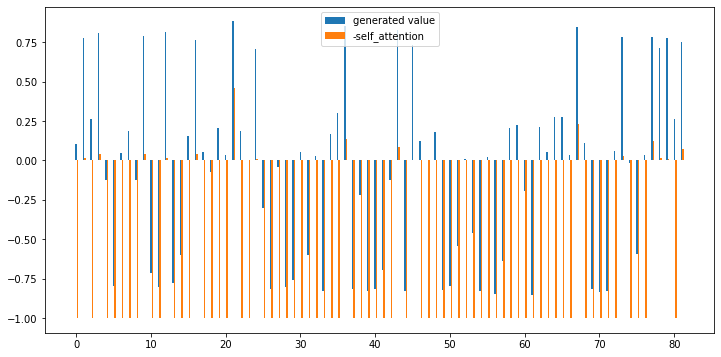

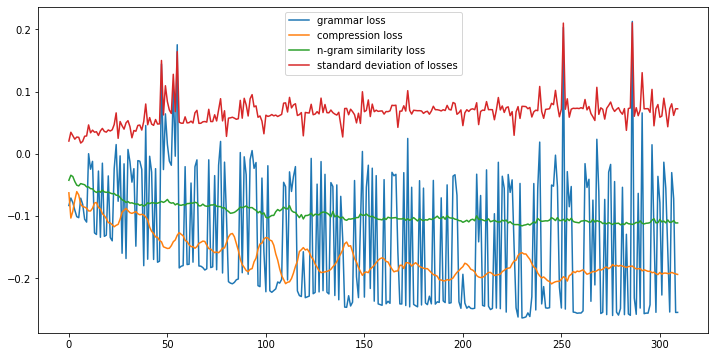

0.7138,0.3772,score:2.1951,[The scrutiny was on us a big game against side came through very well ’ Stoke will consider themselves The is still to the cause his after diving to goal has the end may near and There were minor talks at last season but that I could accept or reject.]
0.7193,0.4119,score:2.4546,[The scrutiny was on big game against side came through it very well ’ Stoke will consider themselves The is to the cause his after diving in to goal has the end and There were minor talks at last season but that I could accept or reject.]
0.7282,0.3548,score:2.4808,[The scrutiny was on us a big game against side came through it very well ’ Stoke will consider themselves The is still to the cause ending his after diving in to goal has the end may near and There were minor talks at last season that I could accept or reject.]
0.7346,0.3623,score:2.3346,[The scrutiny was on us a big game against side came through it very well ’ Stoke will consider themselves The is still to the cause hi

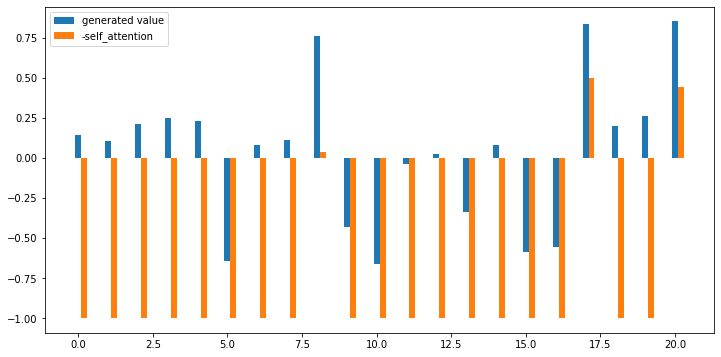

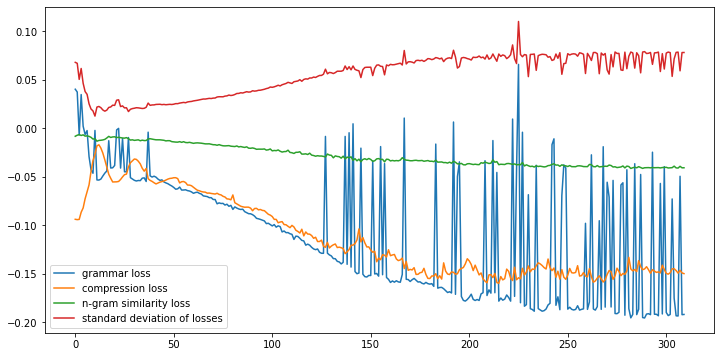

0.7637,0.2079,score:2.2455,[‘Time goes very quick and haven’t been offered if haven’t contract I can’t stay.]
0.6965,0.3465,score:2.1028,[goes very quick and haven’t been offered if contract I can’t stay.]
0.7390,0.2178,score:2.2105,[‘Time goes quick and haven’t been offered But if haven’t contract I can’t stay.]
0.7015,0.3762,score:1.1149,[‘Time goes very quick haven’t offered if contract I can’t stay.]
0.7851,0.1683,score:2.3153,[‘Time goes very quick and haven’t been offered But if haven’t contract I can’t stay.]
0.6811,0.3168,score:1.2834,[goes quick and haven’t been offered if haven’t contract I can’t stay.]
0.7390,0.2178,score:2.1553,[‘Time goes very quick and haven’t offered But if haven’t contract I can’t stay.]
0.7164,0.2574,score:2.0973,[‘Time goes quick and haven’t been offered if haven’t contract I can’t stay.]
0.7164,0.2574,score:1.6583,[‘Time very quick and haven’t been offered if haven’t contract I can’t stay.]
0.7164,0.2574,score:2.0271,[‘Time goes very quick and haven’

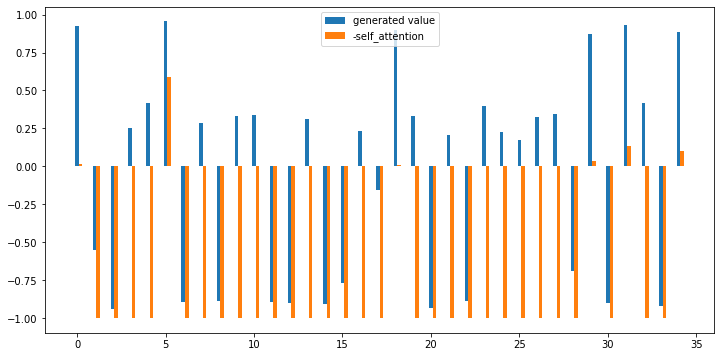

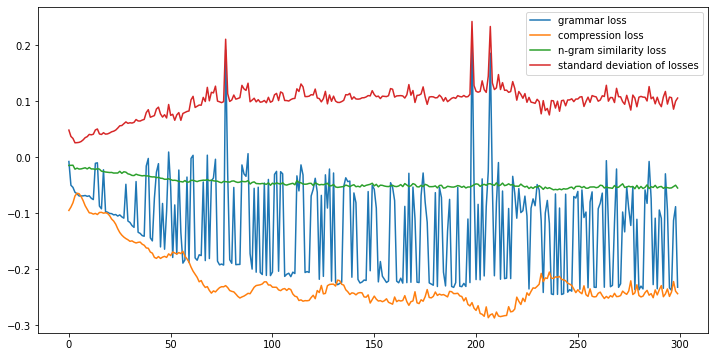

0.5302,0.4368,score:1.8671,[We win ’ Rodgers down touchline and goal and All I can my job and It’s not business talk to clubs.]
0.4059,0.6379,score:0.7548,[We win Rodgers down goal and I can It’s business talk to clubs.]
0.5435,0.4023,score:2.0256,[We win ’ Rodgers down touchline and goal and All I can doing my job and It’s not business talk to clubs.]
0.3167,0.7069,score:0.3821,[We win Rodgers down I job It’s business talk clubs.]
0.4193,0.5345,score:1.0990,[We win Rodgers down and goal and I can doing and It’s not business talk to clubs.]
0.5156,0.4828,score:1.9454,[We win ’ Rodgers down touchline goal and I can my job and It’s not business talk to clubs.]
0.4359,0.6552,score:0.5945,[We win ’ Rodgers and goal I can It’s business talk to clubs.]
0.4924,0.4655,score:2.0024,[We win Rodgers touchline and goal and All I doing my job and It’s not business talk to clubs.]
0.4632,0.5805,score:0.7018,[We Rodgers down and goal All I can doing It’s not business talk to clubs.]
0.3047,0.7414,sco

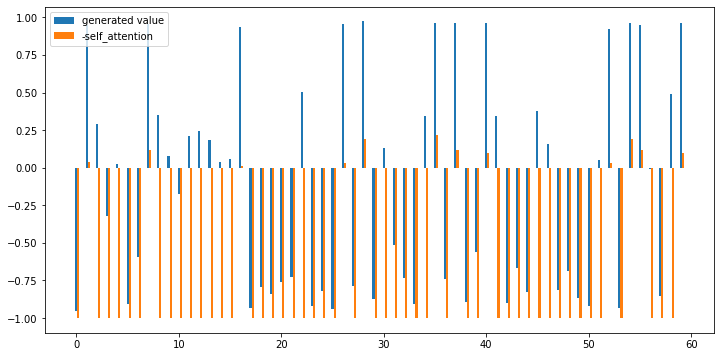

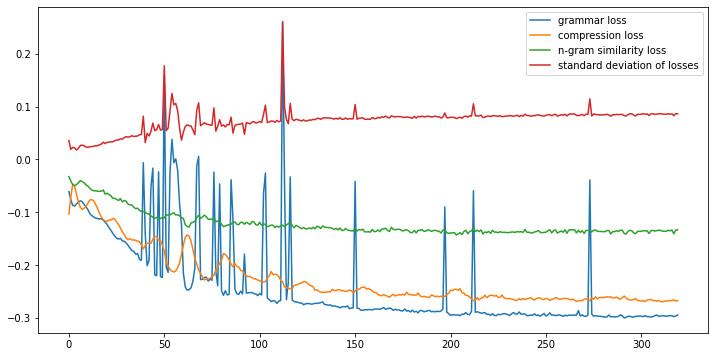

0.7023,0.4139,score:2.7423,[insists that reason to do this is because he finds kayaking so relaxing years documenting trips uploading an adventure to followers on the past been documenting trips to his Instagram followers.]
0.6846,0.4502,score:2.1137,[insists that to do is because he finds kayaking so relaxing years documenting trips uploading an adventure to followers on the past been documenting trips to his Instagram followers.]
0.6985,0.4230,score:2.3999,[insists that reason to do this because he finds kayaking so relaxing years documenting trips uploading an adventure to followers on the past been documenting trips to his Instagram followers.]
0.6765,0.4260,score:2.6781,[insists that reason to do this is because he finds kayaking so relaxing years documenting trips uploading an adventure to followers on the past been documenting trips to Instagram followers.]
0.6804,0.4411,score:2.6844,[insists that reason to do this is because he finds kayaking relaxing documenting trips uploadin

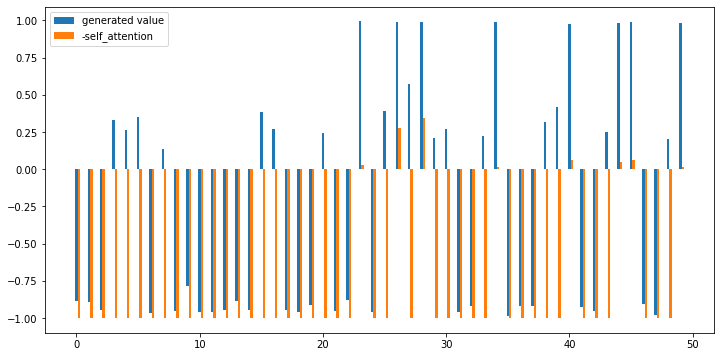

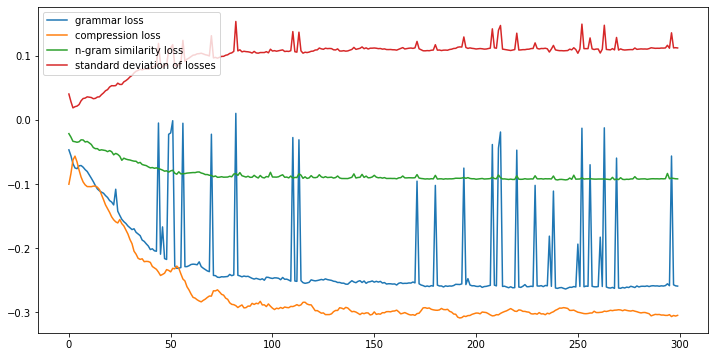

0.6197,0.5120,score:2.1994,[that these breathtaking were GoPro camera? spends his time atop the waters of Norways nature spots uses a helmet camera to capture and videos.]
0.6069,0.5189,score:1.6094,[that these breathtaking were GoPro camera? spends his time atop the waters of Norways nature spots uses helmet camera to capture and videos.]
0.6038,0.5361,score:2.0950,[that these breathtaking were GoPro camera? spends his time atop the waters of Norways spots uses a helmet camera to capture and videos.]
0.5698,0.5739,score:1.0016,[these breathtaking were GoPro camera? spends his atop the waters of nature spots uses a helmet camera to capture and videos.]
0.5518,0.5670,score:1.4555,[that these breathtaking were camera? spends his time atop waters of Norways nature spots uses helmet camera to capture videos.]
0.5893,0.5258,score:1.6488,[that these breathtaking were GoPro camera? spends his time atop waters of Norways nature spots uses a helmet camera to capture and videos.]
0.6057,0.5395,s

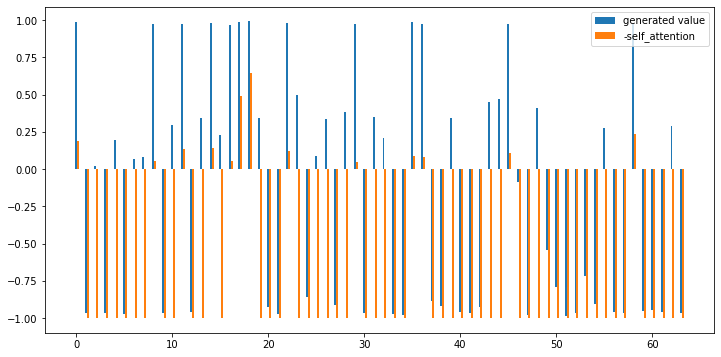

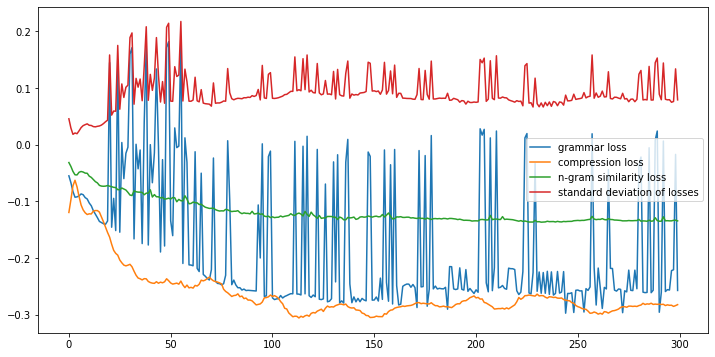

0.6419,0.4450,score:1.8855,[He enjoys fact kayaking allows you get closer many environments than you would hiking and sunset is one of many photos Tomasz has his adventure the over 26000 followers on networking reflected water peaceful]
0.6370,0.4531,score:2.0976,[He enjoys fact kayaking allows you get closer many environments than you would hiking and sunset is one of many photos Tomasz has his adventure the over 26000 followers networking reflected water peaceful]
0.6305,0.4638,score:1.4125,[He enjoys fact kayaking allows you closer many environments than you would hiking and sunset is one of many photos Tomasz has his adventure the over 26000 followers networking reflected water peaceful]
0.6398,0.4638,score:1.3121,[He fact kayaking allows you get closer many environments than you would hiking and sunset is one of many photos Tomasz has his adventure the over 26000 followers on networking reflected water peaceful]
0.6236,0.4558,score:2.2268,[He enjoys fact kayaking allows you get cl

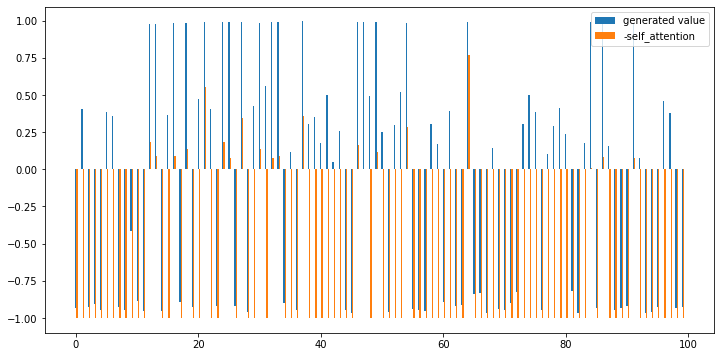

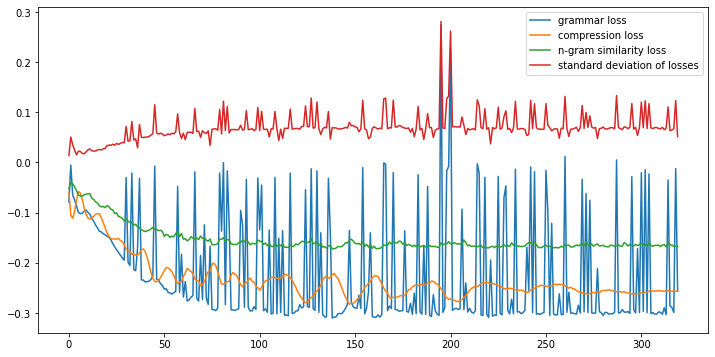

0.7632,0.4152,score:2.3855,[told she suffered Police Department she laid naked the floor of police station cell a group of officers laughed her Davis told the Palm Beach Post: [Officers] hands to my feet and took a tie around then me suitcase on golf cart and 32-year-old said that while being detained bikini officers whisked in front]
0.7475,0.4171,score:2.4735,[told she suffered Police Department she laid naked the floor of police station cell a group of officers laughed her Davis told the Palm Beach Post: [Officers] hands to my feet and took a tie around me suitcase on golf cart and 32-year-old said that while being detained bikini top officers whisked in front]
0.7060,0.4610,score:2.1435,[told suffered Police Department laid naked the floor of police station cell a group of officers laughed her Davis told the Palm Beach [Officers] hands to my feet and a tie around me suitcase on golf cart and 32-year-old said that while being detained bikini officers whisked in front]
0.7298,0.4533,

RuntimeError: ignored

In [43]:
import io
R1 = []
R2 = []
RL = []
Similarity = []
Grammar = []

result_data = {}
result_data['comp_rate'] = []
result_data['R1'] = []
result_data['R2'] = []
result_data['RL'] = []
result_data['Similarity'] = []
result_data['Grammar'] = []

atten_rate = 0.2
similarity = 1.0
std_factor = 3.0

es = ExtactiveSummarizer()

logout = True
for rate in range(0,1):
    comp_rate=1.7
    result_data['comp_rate'].append(comp_rate)
    for try_count in range(100):
        
        full_text = get_prepared_doc(sentences_dataset[try_count])
        '''
        try:
            del model
            print('delete model')
        except Exception as ex:
            pass
        model = EncoderDecoderModel.from_pretrained("/content/drive/MyDrive/GAN_ENDE/en_sentence_complete_model")
        '''
        #try:

        #org_text = besm(full_text,num_sentences=9)
        org_text = es.generate_summary(full_text,top_n=9)[0]
        
        org_sentences = np.array(nltk.sent_tokenize(org_text.strip()))
        if logout:
            print('BESM Summary sentance length:',len(org_sentences))
        org_text,grammar,simil = summary(full_text,org_text,steps=3,top_rank=3,comp_rate=comp_rate)
        
        gsmry = gold_summary[try_count]
        
        print('='*50 + ' Original Document ' + str(try_count) + '='*50)
        print(full_text)
        print('-'*50 + ' Summary ' + str(try_count) + '-'*50)
        for txt in np.array(nltk.sent_tokenize(org_text.strip())):
            print(txt)
        print('-'*50 + ' Ground truth' + '-'*50)
        print(gsmry)
        print('-'*120)

        with io.open('/content/drive/MyDrive/GAN_ENDE/CNN_Daily_summary_result.txt','a',encoding='utf8') as f:
            f.write(org_text + '\r\n\r\n')
        smry = org_text
        scores = scorer.score(gsmry,smry)
        print(scores['rouge1'].fmeasure)
        if scores['rouge1'].fmeasure > 0.1:
            print('rouge1', scores['rouge1'].fmeasure)
            print('rouge2', scores['rouge2'].fmeasure)
            print('rougeL', scores['rougeL'].fmeasure)
            print('Similarity',simil)
            print('Grammar',grammar)

            R1.append(scores['rouge1'].fmeasure)
            R2.append(scores['rouge2'].fmeasure)
            RL.append(scores['rougeL'].fmeasure)
            Similarity.append(simil)
            Grammar.append(grammar)
            print()
            print('Mean R1',np.mean(R1))
            print('Mean R2',np.mean(R2))
            print('Mean RL',np.mean(RL))
            print('Similarity',np.mean(Similarity))
            print('Grammar',np.mean(Grammar))
        print()               
        #except Exception as ex:
        #    print(ex)

    print()
    print()
    print()
    print("="*50 + "Compression rate:" + str(comp_rate) + "=" * 50)
    print('R1',np.mean(R1))
    print('R2',np.mean(R2))
    print('RL',np.mean(RL))
    print('Similarity',np.mean(Similarity))
    print('Grammar',np.mean(Grammar))    
    print()
    print()
    print()
    result_data['R1'].append(np.mean(R1))
    result_data['R2'].append(np.mean(R2))
    result_data['RL'].append(np.mean(RL))
    result_data['Similarity'].append(np.mean(Similarity))
    result_data['Grammar'].append(np.mean(Grammar))
df_result_data = pd.DataFrame(result_data)
df_result_data